"""
This is a sample notebook of MOBOrch in ATOMAI package-- focussed on application to Multi-objective Bayesian optimized Active Recommender Systems (MOBOARS)
=========
<<<<<<< HEAD
Sample tutorials of running MOBO models, with MOBOARS for autonomous microscopy platform.
Jupiter notebook of tutorial_AE script
=======
Developed in Pytorch environment
Prepared by Arpan Biswas (email: arpanbiswas52@gmail.com)
"""

In [2]:
import pickle
import time

import atomai as aoi
import gdown as gdown
import numpy as np
import torch
from atomai import utils
from matplotlib import pyplot as plt
from skimage.metrics import structural_similarity as ssim
from skimage.transform import resize

from mAForch import mAcqFunc
from mGPorch import mGPtrainer
from paretorch import Pareto
from utils import plotPareto


Required functions to design MOBOARS model

In [3]:
norm_ = lambda x: (x - x.min()) / x.ptp()


def return_new_measurement(full_dataset, points_measured):
    ampdat_masked = np.zeros_like(full_dataset)
    ampdat_masked[points_measured, :] = full_dataset[points_measured, :]
    return ampdat_masked, points_measured


def func_automated_obj(idx_x, idx_y, new_spec_x, new_spec_y, target_func, n_obj):
    idx1 = int(idx_x)
    idx2 = int(idx_y)
    rf = 10
    obj = torch.zeros(1, 2)
    for i in range(0, n_obj):
        # print(wcount_good)
        # Calculate ssim between target and ith loop shape
        pred = new_spec_y.detach().numpy()
        target = target_func[:, i].detach().numpy()
        ssim_spec = ssim(target, pred, data_range=pred.max() - pred.min())

        # This is the basic setting of obj func-- we can incorporate more info as per domain knowledge to improve
        # Into maximization problem
        obj[0, i] = rf * ssim_spec  # Maximize ssim
    # print(obj)
    return obj


def func_human_interacted_obj(idx_x, idx_y, new_spec_x, new_spec_y, wcount_good, target_func, vote, n_obj):
    idx1 = int(idx_x)
    idx2 = int(idx_y)
    rf = 1
    obj = torch.zeros(1, 2)
    for i in range(0, n_obj):
        # print(wcount_good)
        if wcount_good[0, i] == 0:  # We dont find a good loop yet from all initial sampling and thus target is unknown
            ssim_spec = torch.rand(1) * 1  # Unif[0, 1] A sufficiently large value as we want to avoid selecting
            # bad loops, When we have a target, we will recalculate again to get more accurate estimate
            R = vote[i] * rf

        else:
            # Calculate dissimilarity (mse) between target and ith loop shape

            pred = new_spec_y.detach().numpy()
            target = target_func[:, i].detach().numpy()
            ssim_spec = ssim(target, pred, data_range=pred.max() - pred.min())
            # plt.plot(new_spec_x, new_spec_y) plt.show() dev2_spectral = (target_func-new_spec_y)**2 mse_spectral =
            # torch.mean(dev2_spectral) Calculate reward as per voting, this will minimize the risk of similar
            # function values of good and bad loop shape with similar mse
            R = vote[i] * rf

        # This is the basic setting of obj func-- we can incorporate more info as per domain knowledge to improve
        # Into maximization problem
        obj[0, i] = R + ssim_spec  # Maximize reward and ssim
        # print(mse_spectral)
    # print(obj)
    return obj


def generate_target(idx_x, idx_y, new_spec_x, new_spec_y, img_space, wcount_good, target_func, n_obj):
    # count_good= 0
    idx1 = int(idx_x)
    idx2 = int(idx_y)
    if (wcount_good[0, 0] == 0) and (wcount_good[0, 1] == 0):
        # Figure for user choice
        fig, ax = plt.subplots(ncols=2, figsize=(12, 5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker='x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' + str(idx2) + "," + str(idx1), fontsize=20)
        plt.show()

    elif (wcount_good[0, 0] == 0) and (wcount_good[0, 1] > 0):
        # Figure for user choice
        fig, ax = plt.subplots(ncols=3, figsize=(18, 5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker='x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' + str(idx2) + "," + str(idx1), fontsize=20)
        # ax[2].plot(new_spec_x,target_func[:, 0], 'r-', label='target 1', linewidth=2)
        ax[2].plot(new_spec_x, target_func[:, 1], 'b-', label='target 2', linewidth=2)
        ax[2].legend(loc='best')
        ax[2].set_title('Current target functions', fontsize=20)
        plt.show()

    elif (wcount_good[0, 0] > 0) and (wcount_good[0, 1] == 0):
        # Figure for user choice
        fig, ax = plt.subplots(ncols=3, figsize=(18, 5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker='x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' + str(idx2) + "," + str(idx1), fontsize=20)
        ax[2].plot(new_spec_x, target_func[:, 0], 'r-', label='target 1', linewidth=2)
        # ax[2].plot(new_spec_x,target_func[:, 1], 'b-', label='target 2', linewidth=2)
        ax[2].legend(loc='best')
        ax[2].set_title('Current target functions', fontsize=20)
        plt.show()

    else:
        # Figure for user choice
        fig, ax = plt.subplots(ncols=3, figsize=(18, 5))
        ax[0].imshow(img_space, origin="lower")
        ax[0].scatter(idx2, idx1, marker='x', color="red")
        ax[0].axes.xaxis.set_visible(False)
        ax[0].axes.yaxis.set_visible(False)
        ax[1].plot(new_spec_x, new_spec_y)
        ax[1].set_title('loc:' + str(idx2) + "," + str(idx1), fontsize=20)
        ax[2].plot(new_spec_x, target_func[:, 0], 'r-', label='target 1', linewidth=2)
        ax[2].plot(new_spec_x, target_func[:, 1], 'b-', label='target 2', linewidth=2)
        ax[2].legend(loc='best')
        ax[2].set_title('Current target functions', fontsize=20)
        plt.show()

    vote = torch.zeros((1, n_obj))
    # Generate multiple independent targets as per user voting. Each target will represent goal for each objective
    # as a MOO problem
    for i in range(0, n_obj):
        print("Rating for target: " + str(i + 1))
        print("Rating: 0-Bad or press ENTER, 1-Good, 2-Very good")
        time.sleep(0.5)
        v = (input("enter rating: "))
        # For bad spectral, we can also input null values to accelerate the voting- This is similar to skipping
        # voting for bad spectral. For good ones, user need to vote as either 1 or 2
        if v == "":
            vote[0, i] = 0
            print(vote[0, i])
        else:
            vote[0, i] = float(v)
            print(vote[0, i])

        if vote[0, i] > 0:
            newspec_wt = 1
            if (wcount_good[0, i]) > 0:  # Only if we already have selected good spectral in early iterations
                print(
                    "Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- "
                    "No")
                newspec_pref = str(input("Answer: "))
                # For no pref update, we can also press enter (skip) to accelerate the process
                if newspec_pref == 'Y' or newspec_pref == 'y':
                    print(
                        "Provide weights between 0 and 10: \n10 being all the weights to new spectral as new target.")
                    newspec_wt = float(input("enter weightage: ")) / 10
                    print(newspec_wt)
                else:
                    newspec_wt = 0.5
            wcount_good[0, i] = wcount_good[0, i] + vote[0, i]
            target_func[:, i] = (((1 - newspec_wt) * target_func[:, i] * (wcount_good[0, i] - vote[0, i])) + (
                    newspec_wt * vote[0, i] * new_spec_y)) / (((
                                                                       wcount_good[0, i] - vote[0, i]) * (
                                                                       1 - newspec_wt)) + (
                                                                      vote[0, i] * newspec_wt))
            # Normalize
            target_func[:, i] = (target_func[:, i] - target_func[:, i].min()) / (
                    target_func[:, i].max() - target_func[:, i].min())

    # print(vote, wcount_good, target_func)
    return vote, wcount_good, target_func


def augment_newdata(acq_X, acq_X_norm, acq_indices, train_X, train_X_norm, train_indices, train_Y,
                    new_spec_x, new_spec_y, eval_spec, img_space, var_params, n_obj, u, m):
    wcount_good, pref, target_func = var_params[0], var_params[1], var_params[2]

    nextX = acq_X
    nextX_norm = acq_X_norm
    nextind = acq_indices
    train_X_norm = np.vstack((train_X_norm, nextX_norm))
    train_X = np.vstack((train_X, nextX))
    train_indices = np.vstack((train_indices, nextind))

    p = np.empty((1, n_obj))
    # x = torch.empty((1,2))
    idx_x = int(train_indices[-1, 0])
    idx_y = int(train_indices[-1, 1])

    if u == 0:
        print("Are you satisfied with current target? (y- yes or press ENTER- No)")
        update_target = str(input("Answer: "))
        if update_target == "Y" or update_target == 'y':
            print("Spectral target now fixed. Continue automated BO...")
            # First time switching to automated BO, need to recalculate the objectives again
            plt.plot(new_spec_x, new_spec_y)
            plt.title('loc:' + str(idx_y) + "," + str(idx_x), fontsize=20)
            plt.show()
            train_Y = np.empty((train_X.shape[0], n_obj))
            u = 1  # This is a switching parameter to not call for update target every iteration once the user is
            # satisfied
            for i in range(0, train_X.shape[0]):
                idx_x = int(train_indices[i, 0])
                idx_y = int(train_indices[i, 1])
                spec_y = eval_spec_y[idx_x, idx_y, :]
                # print(idx_x, idx_y, spec_y)
                train_Y[i, :] = func_automated_obj(idx_x, idx_y, new_spec_x, spec_y, target_func, n_obj)

        else:
            print("User still searching for best target. Continue BO with human interaction...")

            # Vote for new spectral sample and update(or not) target spectral function
            p[0, :], wcount_good, target_func = generate_target(idx_x, idx_y, new_spec_x, new_spec_y, img_space,
                                                                wcount_good, target_func, n_obj)
            pref = np.vstack((pref, p))  # Augment pref matrix

            if (p[0, 0] == 0) and (p[0, 1] == 0):
                # If target loop is not updated, we eval for the new samples only as the
                # func value for others remain the same

                next_feval = np.empty((1, n_obj))
                next_feval[0, :] = func_human_interacted_obj(idx_x, idx_y, new_spec_x, new_spec_y, wcount_good,
                                                             target_func, pref[-1], n_obj)
                train_Y = np.vstack((train_Y, next_feval))
            else:
                # If target loop is updated, we reevaluate the obj of old spectral samples and
                # eval for the new samples
                train_Y = np.empty((train_X.shape[0], n_obj))
                for i in range(0, train_X.shape[0]):
                    # x[0, 0] = train_X[i, 0]
                    # x[0, 1] = train_X[i, 1]
                    idx_x = int(train_indices[i, 0])
                    idx_y = int(train_indices[i, 1])
                    spec_y = eval_spec_y[idx_x, idx_y, :]
                    # print(idx_x, idx_y, spec_y)
                    train_Y[i, :] = func_human_interacted_obj(idx_x, idx_y, new_spec_x, spec_y, wcount_good,
                                                              target_func, pref[i], n_obj)
    else:
        fig, ax = plt.subplots(ncols=2, figsize=(12, 5))
        ax[0].plot(new_spec_x, new_spec_y)
        ax[0].set_title('loc:' + str(idx_y) + "," + str(idx_x), fontsize=20)
        ax[1].plot(new_spec_x, target_func[:, 0], 'r-', label='target 1', linewidth=2)
        ax[1].plot(new_spec_x, target_func[:, 1], 'b-', label='target 2', linewidth=2)
        ax[1].legend(loc='best')
        ax[1].set_title('Fixed target functions', fontsize=20)
        plt.show()
        next_feval = np.empty((1, n_obj))
        next_feval[0, :] = func_automated_obj(idx_x, idx_y, new_spec_x, new_spec_y, target_func, n_obj)
        train_Y = np.vstack((train_Y, next_feval))

    var_params = [wcount_good, pref, target_func]
    m = m + 1
    return torch.from_numpy(train_X), torch.from_numpy(train_X_norm), torch.from_numpy(train_indices), torch.from_numpy(
        train_Y), var_params, u, m


Download experimental data and generate required dataset to facilitate sampling during MOBO

* In real-time application, we will connect the data sampling part to the microscope for characterization at given sample instead of downloading post experimental data.

Downloading...
From (uriginal): https://drive.google.com/uc?id=1pl7tJwDH0xsx21TwrN_i8KM7yEFHT4Xw
From (redirected): https://drive.google.com/uc?id=1pl7tJwDH0xsx21TwrN_i8KM7yEFHT4Xw&confirm=t&uuid=d0119107-5906-4856-86c6-cd3413efffcd
To: C:\Users\86f\PycharmProjects\pythonProject1\beps_ground_truth_d2.p
100%|██████████| 758M/758M [00:19<00:00, 38.0MB/s] 
Downloading...
From (uriginal): https://drive.google.com/uc?id=1djbYo-Gjgu6oVGaZlnp3idkUDDOru991
From (redirected): https://drive.google.com/uc?id=1djbYo-Gjgu6oVGaZlnp3idkUDDOru991&confirm=t&uuid=c3f77a1b-09ec-4fc3-9e56-f1c3a62b079f
To: C:\Users\86f\PycharmProjects\pythonProject1\iterative_results_d2.npy
100%|██████████| 112M/112M [00:03<00:00, 33.0MB/s] 


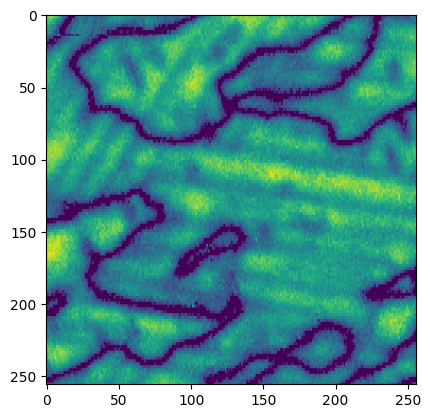

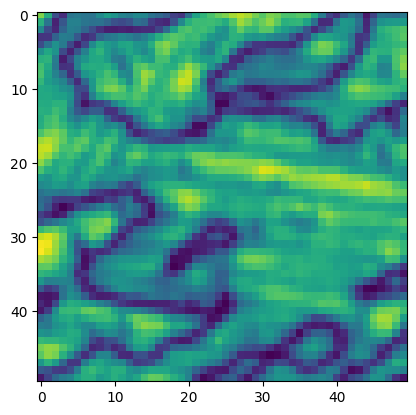

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\atomai\utils\img.py:450: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:248.)
  spectra = torch.tensor(spectra).unsqueeze(1)


In [4]:
# Experimental data download - PbTrO3 Oxide sample
# For AE, this part should be directly connected to microscope for image scanning and charaterization of spectra
url = "https://drive.google.com/uc?id=1pl7tJwDH0xsx21TwrN_i8KM7yEFHT4Xw"
output = "beps_ground_truth_d2.p"
gdown.download(url, output, quiet=False)
# gdown https://drive.google.com/uc?id=1pl7tJwDH0xsx21TwrN_i8KM7yEFHT4Xw
pickle_file_loc = r'beps_ground_truth_d2.p'
original_data = pickle.load(open(pickle_file_loc, "rb"))
beps_all = original_data['results_beps']
url = "https://drive.google.com/uc?id=1djbYo-Gjgu6oVGaZlnp3idkUDDOru991"
output = "iterative_results_d2.npy"
gdown.download(url, output, quiet=False)
results = np.load("iterative_results_d2.npy", allow_pickle=True)

# Scanned Amplitude image
img_big = results[0][-2]
dim = 50
img = resize(img_big, (50, 50), anti_aliasing=True)
plt.imshow(img_big)
plt.show()
plt.imshow(img)
plt.show()

# Generate matrix with spectra data
spec_length = 64  # spectral data length
dim = 50
amp_slices = []
for ind in range(len(beps_all)):
    amp_slices.append(beps_all[ind][1][2])
amp_slices = np.array(amp_slices)
vdc_full = np.array(beps_all[0][1][0])
vdc_vec = vdc_full[-64:]
amp_mat = amp_slices[:, 128:][:, 1::2]
amp_masked = np.zeros_like(amp_mat)
spec_length = amp_mat.shape[-1]  # spectral data length
specim = np.reshape(amp_mat, (dim, dim, spec_length))
# print(img.shape, vdc_vec.shape, amp_slices.shape, specim.shape)

# Create image patches of low-cost amplitude image
window_size = 4
coordinates = aoi.utils.get_coord_grid(img, step=1, return_dict=False)
features, targets, indices = aoi.utils.extract_patches_and_spectra(
    specim, img, coordinates=coordinates, window_size=window_size, avg_pool=1)
features, targets = norm_(features), norm_(targets)
# print(features.shape, targets.shape)

# Run few evaluations randomly for initialization

i is 0, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #1


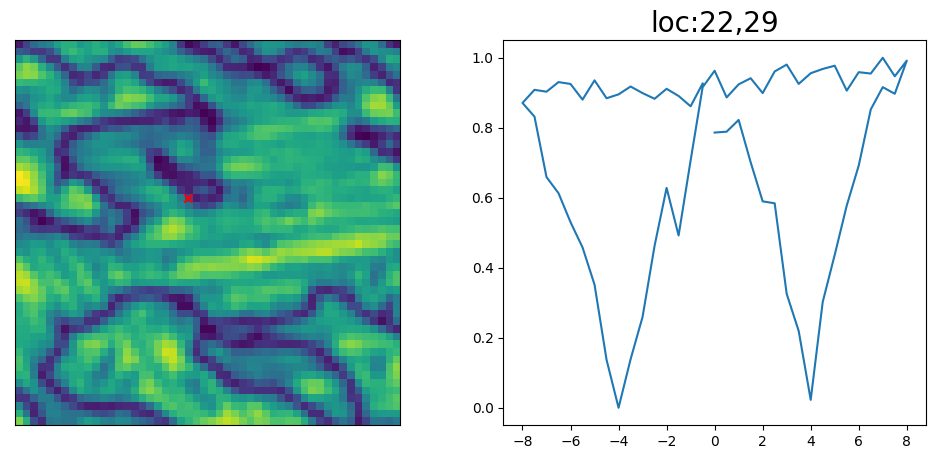

Rating for target: 1
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
tensor(2.)
Rating for target: 2
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
tensor(0.)
i is 1, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #2


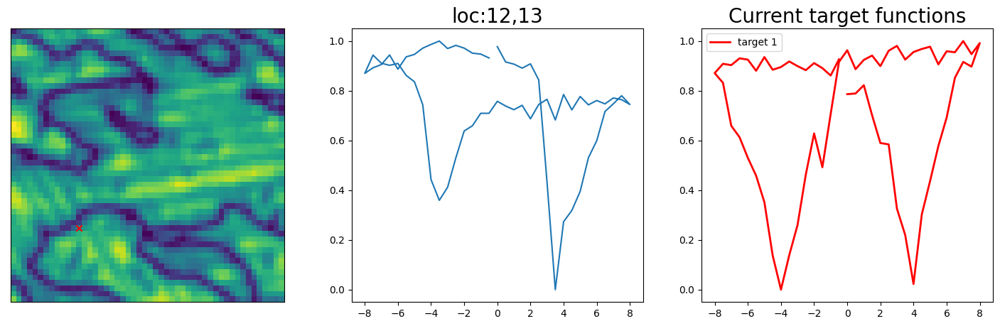

Rating for target: 1
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
tensor(1.)
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Rating for target: 2
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
tensor(1.)
i is 2, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #3


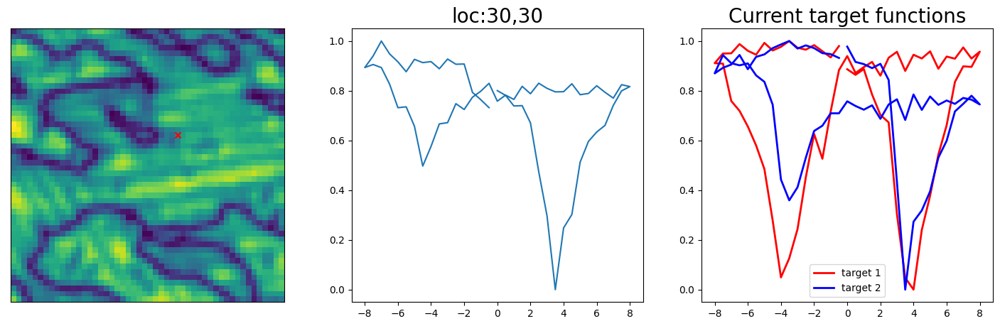

Rating for target: 1
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
tensor(0.)
Rating for target: 2
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
tensor(0.)
i is 3, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #4


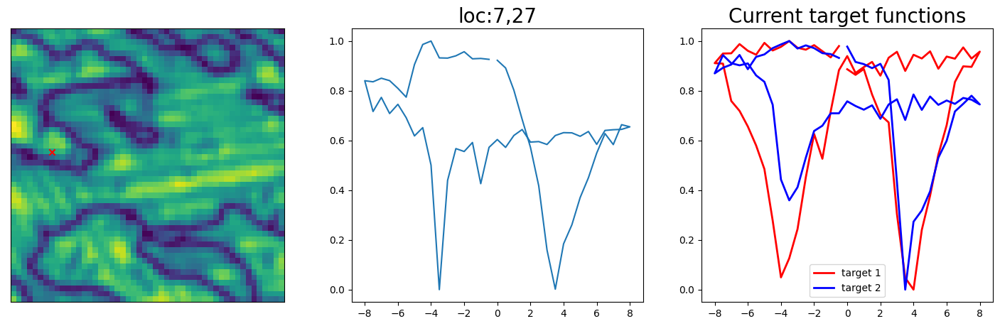

Rating for target: 1
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
tensor(0.)
Rating for target: 2
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
tensor(2.)
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
i is 4, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #5


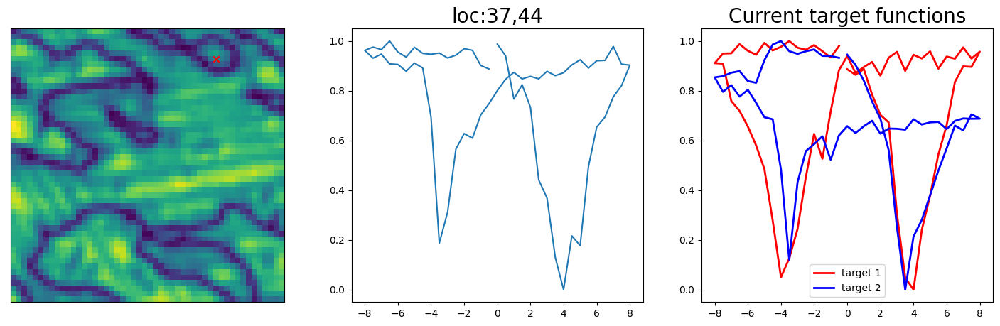

Rating for target: 1
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
tensor(2.)
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Rating for target: 2
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
tensor(0.)
i is 5, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #6


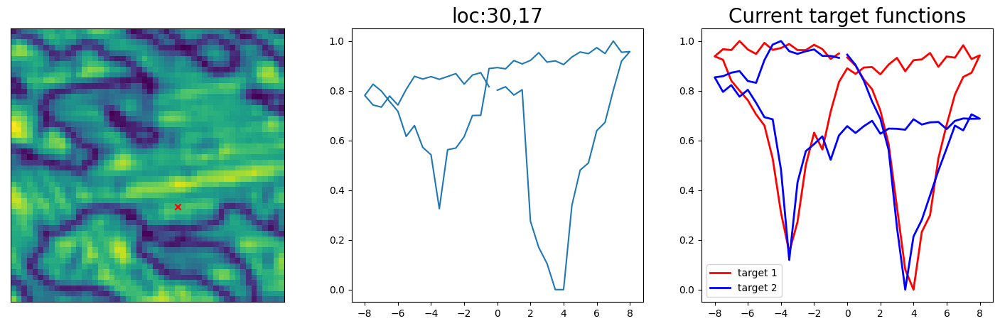

Rating for target: 1
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
tensor(0.)
Rating for target: 2
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
tensor(0.)
i is 6, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #7


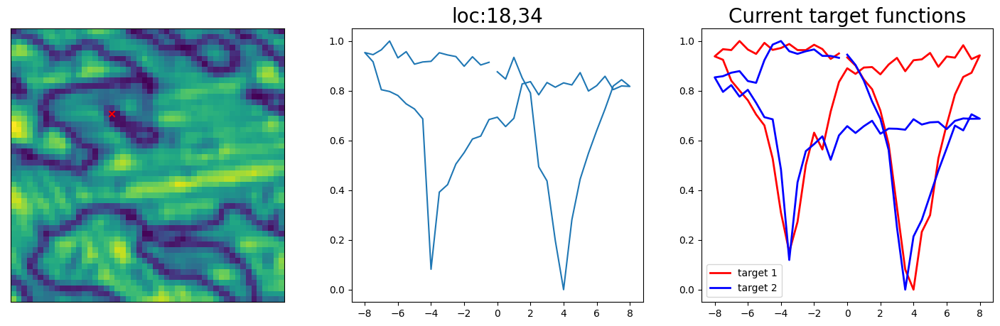

Rating for target: 1
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
tensor(1.)
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Rating for target: 2
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
tensor(0.)
i is 7, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #8


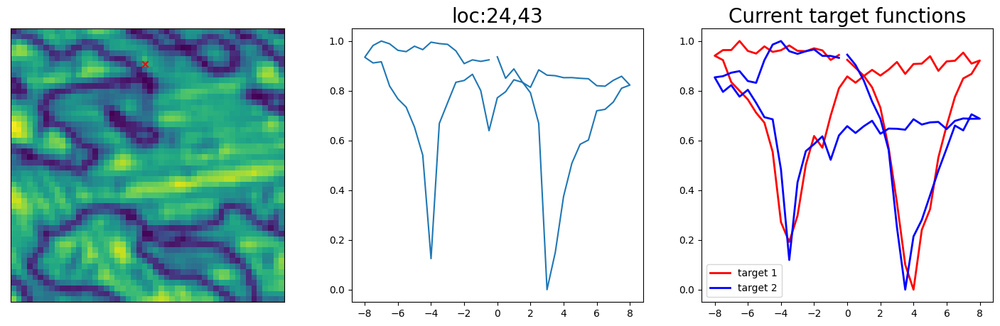

Rating for target: 1
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
tensor(2.)
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Rating for target: 2
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
tensor(0.)
i is 8, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #9


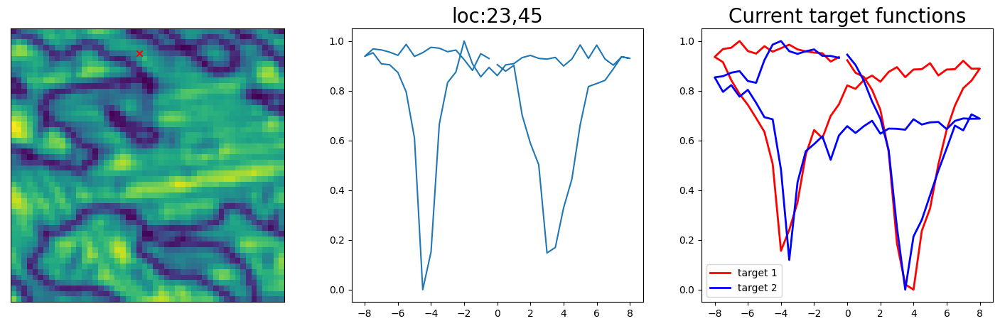

Rating for target: 1
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 1
tensor(1.)
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Rating for target: 2
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
tensor(0.)
i is 9, measurement done
points measured [1289  527 1344 1180 2009  733 1520 1949 2042 1032]
new_points_measured []


Sample #10


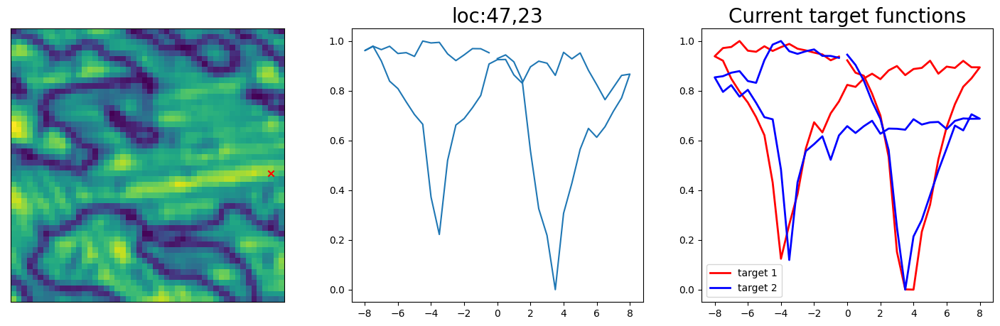

Rating for target: 1
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 2
tensor(2.)
Do you want to update preference to new spectral over prioir mean target? y- Yes or press ENTER- No
Answer: 
Rating for target: 2
Rating: 0-Bad or press ENTER, 1-Good, 2-Very good
enter rating: 
tensor(0.)


Text(0.5, 1.0, 'Current target functions')

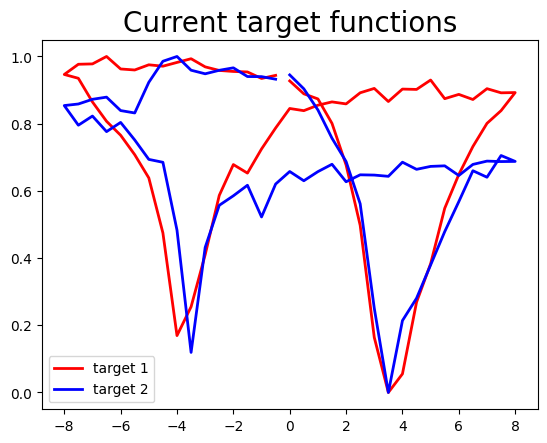

In [5]:
# Start initial evaluation
num_start = int(10)  # Starting samples
N = int(100)  # Total MOBO iterations
n_obj = 2  # No. of objectives to optimize jointly
m = 0
n, d1, d2 = features.shape
spec_length = 64  # spectral data length
spec_length = amp_mat.shape[-1]  # spectral data length
coordinates = utils.get_coord_grid(img, 1)
X_feas = torch.from_numpy(features.reshape(n, d1 * d2))
X_feas_norm = torch.from_numpy(features.reshape(n, d1 * d2))
amp_masked = np.zeros_like(targets)
np.random.seed(10)  # Set seed for reproducibility of initial locations
idx = np.random.randint(0, len(X_feas), num_start)
for ind in range(num_start):
    amp_masked[int(idx[ind]), :] = targets[int(idx[ind]), :]

train_X = X_feas[idx]  # image patches, high dimensional input
train_X_norm = X_feas_norm[idx]  # normalized image patches, high dimensional input
indices = torch.from_numpy(indices)
test_indices = indices  # all 2D co-ordinates in input image space
train_indices = indices[idx]  # evaluated 2D co-ordinates in input image space
test_targets = targets  # matrix contain characterized spectral data
# print(X_feas.shape, X_feas_norm.shape, train_X.shape, train_X_norm.shape, train_indices.shape, amp_masked.shape)

# set parameters
IV = np.copy(amp_masked)
points_measured = np.array(idx)
last_points_measured = np.array(points_measured)
vdc = vdc_vec
train_Y = torch.empty((num_start, n_obj))
pref = torch.empty((num_start, n_obj))
init_spec = torch.empty((num_start, spec_length))
# Define a sparse grid to store evaluated spectral locations
eval_spec_y = torch.zeros(img.shape[0], img.shape[0], spec_length)
# Evaluate initial training data
x = torch.empty((1, 2))
# First generate target spectra, based on initial training data
wcount_good = np.zeros((1, n_obj))
target_func = torch.zeros((spec_length, n_obj))

mask = np.isin(points_measured, last_points_measured, invert=True)
new_points_measured = points_measured[mask]
last_points_measured = np.append(last_points_measured, new_points_measured)

for i in range(0, num_start):
    time.sleep(0.1)

    idx_x = int(train_indices[i, 0])
    idx_y = int(train_indices[i, 1])

    next_loc = np.asarray([idx_x, idx_y])

    print("i is {}, measurement done".format(i))

    mask = np.isin(points_measured, last_points_measured, invert=True)
    new_points_measured = points_measured[mask]
    last_points_measured = np.append(last_points_measured, new_points_measured)
    print('points measured {}'.format(points_measured))
    print('new_points_measured {}'.format(new_points_measured))

    new_iv = IV[last_points_measured, :]

    new_spec_x = torch.from_numpy(vdc_vec)
    new_spec_y = torch.from_numpy(new_iv)[i, :]

    new_spec_y = (new_spec_y - new_spec_y.min()) / (new_spec_y.max() - new_spec_y.min())

    init_spec[i,] = new_spec_y
    eval_spec_y[idx_x, idx_y, :] = new_spec_y
    print("\n\nSample #" + str(m + 1))
    pref[i, :], wcount_good, target_func = generate_target(idx_x, idx_y, new_spec_x, new_spec_y,
                                                           img, wcount_good, target_func, n_obj)
    m = m + 1

# Once targets are generated from human assessment of all initial samples, we compute the obj
for i in range(0, num_start):
    idx_x = int(train_indices[i, 0])
    idx_y = int(train_indices[i, 1])
    spec_y = eval_spec_y[idx_x, idx_y, :]
    # print(idx_x, idx_y, spec_y)
    train_Y[i, :] = func_human_interacted_obj(idx_x, idx_y, new_spec_x, spec_y, wcount_good, target_func,
                                              pref[i], n_obj)

var_params = [wcount_good, pref, target_func]
test_X, test_X_norm, train_X, train_X_norm, train_Y, var_params, idx, m \
    = X_feas, X_feas_norm, train_X, train_X_norm, train_Y, var_params, idx, m

# Show targets after human assessment of random samplings
plt.plot(new_spec_x, target_func[:, 0], 'r-', label='target 1', linewidth=2)
plt.plot(new_spec_x, target_func[:, 1], 'b-', label='target 2', linewidth=2)
plt.legend(loc='best')
plt.title('Current target functions', fontsize=20)


* Run MOBO

Epoch 1/200 ... Training loss: 1.722
Epoch 10/200 ... Training loss: 1.7519
Epoch 20/200 ... Training loss: 1.6727
Epoch 30/200 ... Training loss: 1.6013
Epoch 40/200 ... Training loss: 1.5613
Epoch 50/200 ... Training loss: 1.5227
Epoch 60/200 ... Training loss: 1.488
Epoch 70/200 ... Training loss: 1.4208
Epoch 80/200 ... Training loss: 1.2523
Epoch 90/200 ... Training loss: 1.1739
Epoch 100/200 ... Training loss: 1.0949
Epoch 110/200 ... Training loss: 1.0386
Epoch 120/200 ... Training loss: 0.9822
Epoch 130/200 ... Training loss: 0.9291
Epoch 140/200 ... Training loss: 0.8777
Epoch 150/200 ... Training loss: 0.828
Epoch 160/200 ... Training loss: 0.7776
Epoch 170/200 ... Training loss: 0.7283
Epoch 180/200 ... Training loss: 0.6823
Epoch 190/200 ... Training loss: 0.6349
Epoch 200/200 ... Training loss: 0.5883
Epoch 1/200 ... Training loss: 1.3363
Epoch 10/200 ... Training loss: 1.3287
Epoch 20/200 ... Training loss: 1.3165
Epoch 30/200 ... Training loss: 1.3019
Epoch 40/200 ... Tr

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(
C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


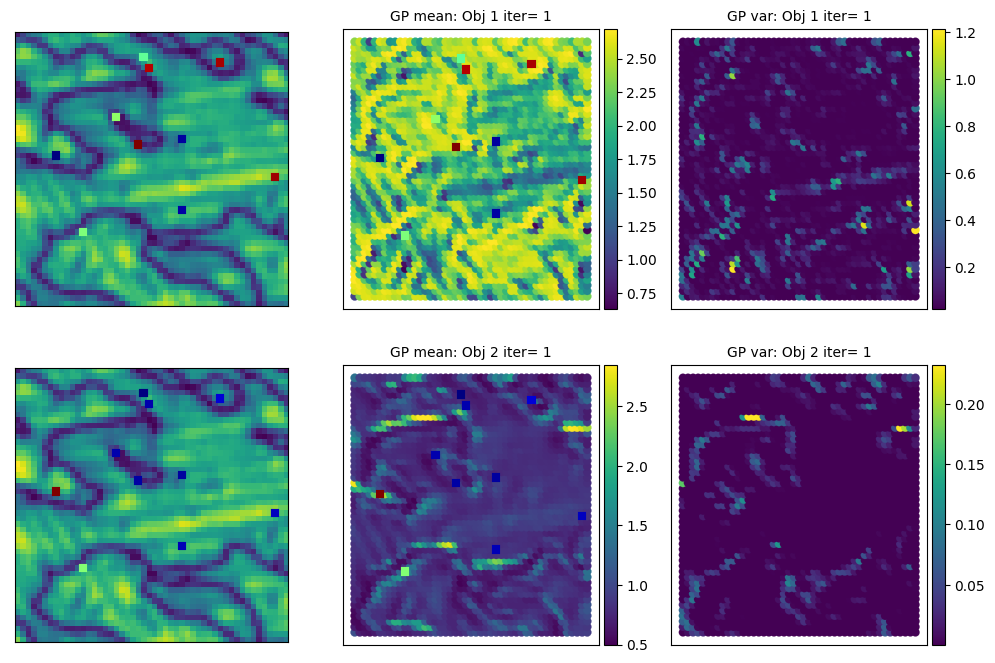

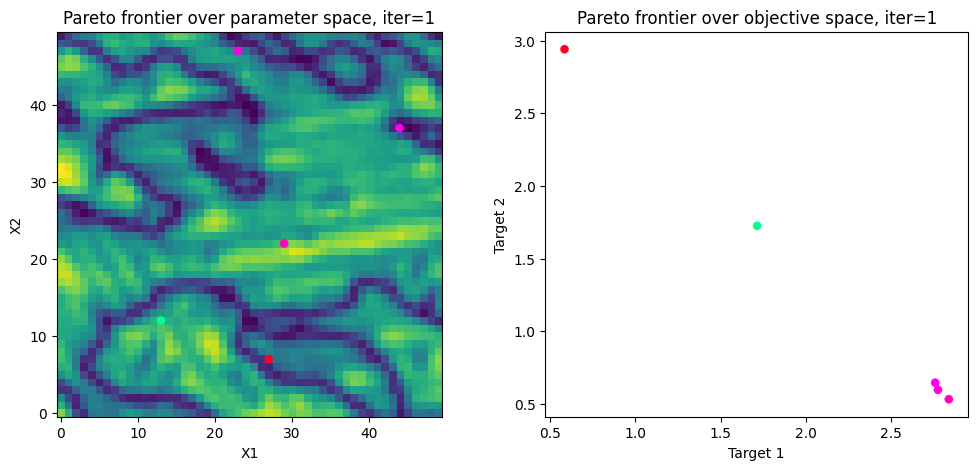

Are you satisfied with current target? (y- yes or press ENTER- No)
Answer: Y
Spectral target now fixed. Continue automated BO...


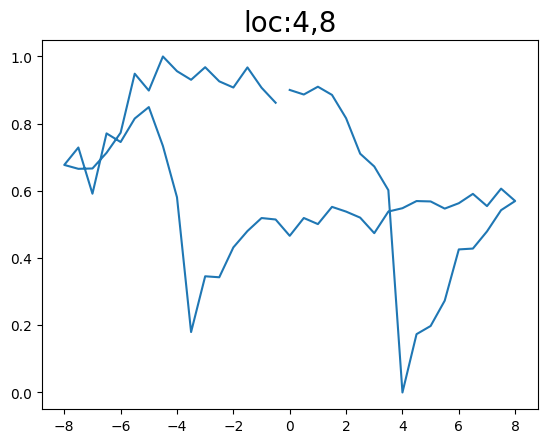

Epoch 1/200 ... Training loss: 5.9027
Epoch 10/200 ... Training loss: 6.1845
Epoch 20/200 ... Training loss: 5.3877
Epoch 30/200 ... Training loss: 4.6993
Epoch 40/200 ... Training loss: 4.269
Epoch 50/200 ... Training loss: 3.8611
Epoch 60/200 ... Training loss: 3.5403
Epoch 70/200 ... Training loss: 3.1673
Epoch 80/200 ... Training loss: 2.9255
Epoch 90/200 ... Training loss: 2.7818
Epoch 100/200 ... Training loss: 2.6554
Epoch 110/200 ... Training loss: 2.5467
Epoch 120/200 ... Training loss: 2.4514
Epoch 130/200 ... Training loss: 2.369
Epoch 140/200 ... Training loss: 2.2942
Epoch 150/200 ... Training loss: 2.2258
Epoch 160/200 ... Training loss: 2.1629
Epoch 170/200 ... Training loss: 2.1046
Epoch 180/200 ... Training loss: 2.0505
Epoch 190/200 ... Training loss: 1.9997
Epoch 200/200 ... Training loss: 1.9558
Epoch 1/200 ... Training loss: 5.0868
Epoch 10/200 ... Training loss: 5.2039
Epoch 20/200 ... Training loss: 4.3018
Epoch 30/200 ... Training loss: 3.8983
Epoch 40/200 ... T

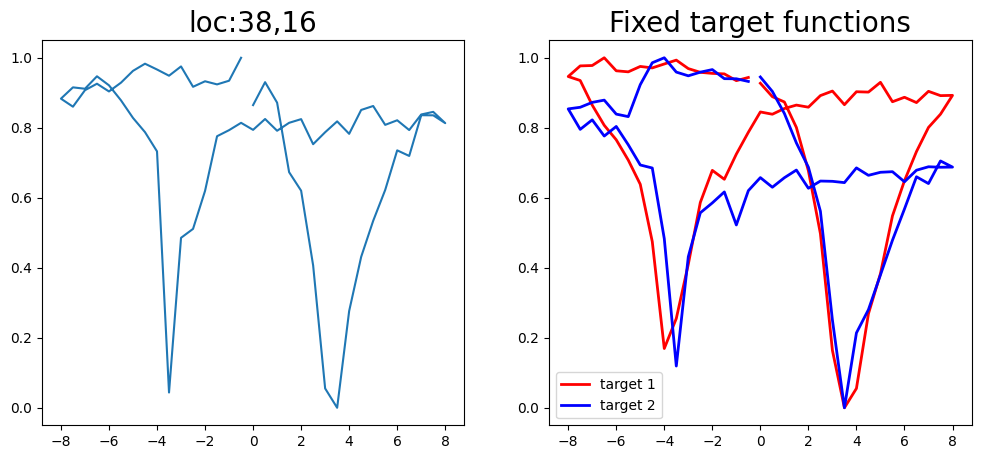

Epoch 1/200 ... Training loss: 5.4846
Epoch 10/200 ... Training loss: 6.0348
Epoch 20/200 ... Training loss: 4.8542
Epoch 30/200 ... Training loss: 4.3894
Epoch 40/200 ... Training loss: 4.1205
Epoch 50/200 ... Training loss: 3.6619
Epoch 60/200 ... Training loss: 3.3752
Epoch 70/200 ... Training loss: 3.1138
Epoch 80/200 ... Training loss: 2.8834
Epoch 90/200 ... Training loss: 2.7236
Epoch 100/200 ... Training loss: 2.5623
Epoch 110/200 ... Training loss: 2.4344
Epoch 120/200 ... Training loss: 2.344
Epoch 130/200 ... Training loss: 2.2654
Epoch 140/200 ... Training loss: 2.1923
Epoch 150/200 ... Training loss: 2.1259
Epoch 160/200 ... Training loss: 2.0658
Epoch 170/200 ... Training loss: 2.0098
Epoch 180/200 ... Training loss: 1.9572
Epoch 190/200 ... Training loss: 1.9077
Epoch 200/200 ... Training loss: 1.8608
Epoch 1/200 ... Training loss: 4.7514
Epoch 10/200 ... Training loss: 4.5965
Epoch 20/200 ... Training loss: 4.0975
Epoch 30/200 ... Training loss: 3.5966
Epoch 40/200 ... 

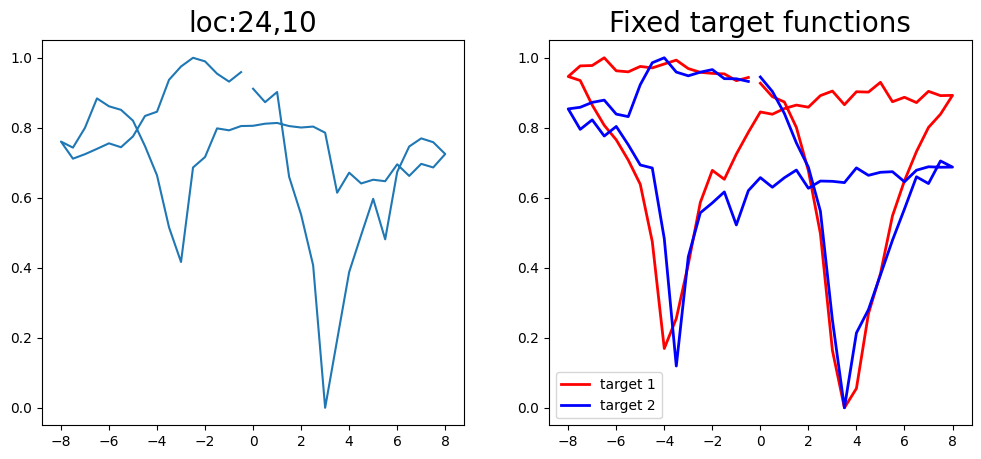

Epoch 1/200 ... Training loss: 5.5218
Epoch 10/200 ... Training loss: 5.6717
Epoch 20/200 ... Training loss: 4.8629
Epoch 30/200 ... Training loss: 4.3325
Epoch 40/200 ... Training loss: 3.912
Epoch 50/200 ... Training loss: 3.5129
Epoch 60/200 ... Training loss: 3.051
Epoch 70/200 ... Training loss: 2.7744
Epoch 80/200 ... Training loss: 2.6171
Epoch 90/200 ... Training loss: 2.4853
Epoch 100/200 ... Training loss: 2.3791
Epoch 110/200 ... Training loss: 2.2862
Epoch 120/200 ... Training loss: 2.2067
Epoch 130/200 ... Training loss: 2.1354
Epoch 140/200 ... Training loss: 2.0705
Epoch 150/200 ... Training loss: 2.0106
Epoch 160/200 ... Training loss: 1.9554
Epoch 170/200 ... Training loss: 1.9041
Epoch 180/200 ... Training loss: 1.856
Epoch 190/200 ... Training loss: 1.8107
Epoch 200/200 ... Training loss: 1.7677
Epoch 1/200 ... Training loss: 4.4743
Epoch 10/200 ... Training loss: 4.2586
Epoch 20/200 ... Training loss: 3.9329
Epoch 30/200 ... Training loss: 3.5904
Epoch 40/200 ... Tr

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


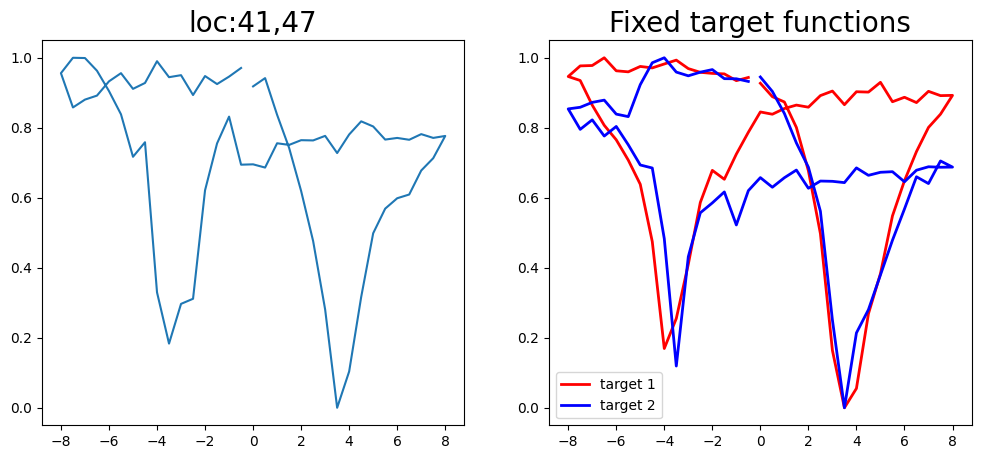

Epoch 1/200 ... Training loss: 5.1999
Epoch 10/200 ... Training loss: 5.5366
Epoch 20/200 ... Training loss: 4.7164
Epoch 30/200 ... Training loss: 4.1244
Epoch 40/200 ... Training loss: 3.7781
Epoch 50/200 ... Training loss: 3.4979
Epoch 60/200 ... Training loss: 3.2381
Epoch 70/200 ... Training loss: 2.9584
Epoch 80/200 ... Training loss: 2.6528
Epoch 90/200 ... Training loss: 2.4869
Epoch 100/200 ... Training loss: 2.3631
Epoch 110/200 ... Training loss: 2.2564
Epoch 120/200 ... Training loss: 2.1598
Epoch 130/200 ... Training loss: 2.0741
Epoch 140/200 ... Training loss: 2.0095
Epoch 150/200 ... Training loss: 1.9518
Epoch 160/200 ... Training loss: 1.8958
Epoch 170/200 ... Training loss: 1.8443
Epoch 180/200 ... Training loss: 1.7955
Epoch 190/200 ... Training loss: 1.7491
Epoch 200/200 ... Training loss: 1.7047
Epoch 1/200 ... Training loss: 4.2099
Epoch 10/200 ... Training loss: 4.1648
Epoch 20/200 ... Training loss: 3.8023
Epoch 30/200 ... Training loss: 3.481
Epoch 40/200 ... 

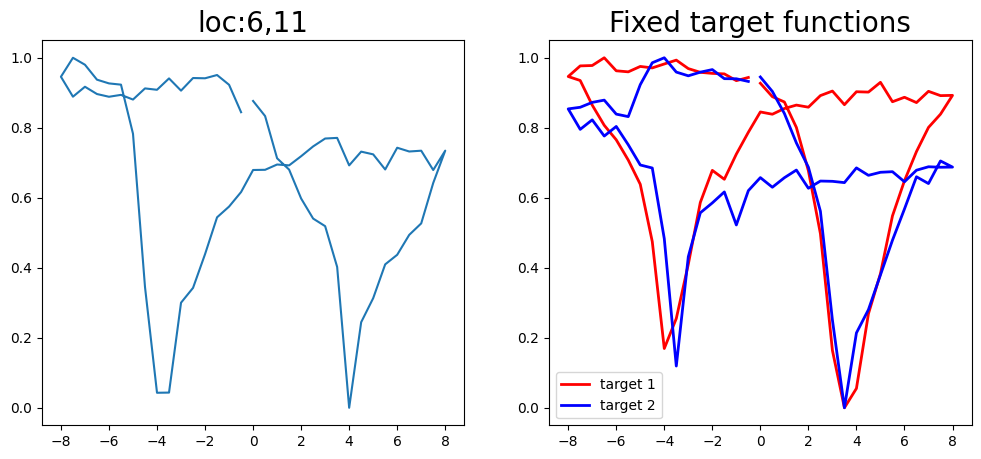

Epoch 1/200 ... Training loss: 4.9096
Epoch 10/200 ... Training loss: 5.1059
Epoch 20/200 ... Training loss: 4.4234
Epoch 30/200 ... Training loss: 3.9926
Epoch 40/200 ... Training loss: 3.6953
Epoch 50/200 ... Training loss: 3.4055
Epoch 60/200 ... Training loss: 3.1357
Epoch 70/200 ... Training loss: 2.8745
Epoch 80/200 ... Training loss: 2.6065
Epoch 90/200 ... Training loss: 2.4264
Epoch 100/200 ... Training loss: 2.2832
Epoch 110/200 ... Training loss: 2.1541
Epoch 120/200 ... Training loss: 2.077
Epoch 130/200 ... Training loss: 2.0106
Epoch 140/200 ... Training loss: 1.9528
Epoch 150/200 ... Training loss: 1.8991
Epoch 160/200 ... Training loss: 1.8488
Epoch 170/200 ... Training loss: 1.8017
Epoch 180/200 ... Training loss: 1.7571
Epoch 190/200 ... Training loss: 1.7146
Epoch 200/200 ... Training loss: 1.6738
Epoch 1/200 ... Training loss: 4.0387
Epoch 10/200 ... Training loss: 4.094
Epoch 20/200 ... Training loss: 3.6283
Epoch 30/200 ... Training loss: 3.2167
Epoch 40/200 ... T

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


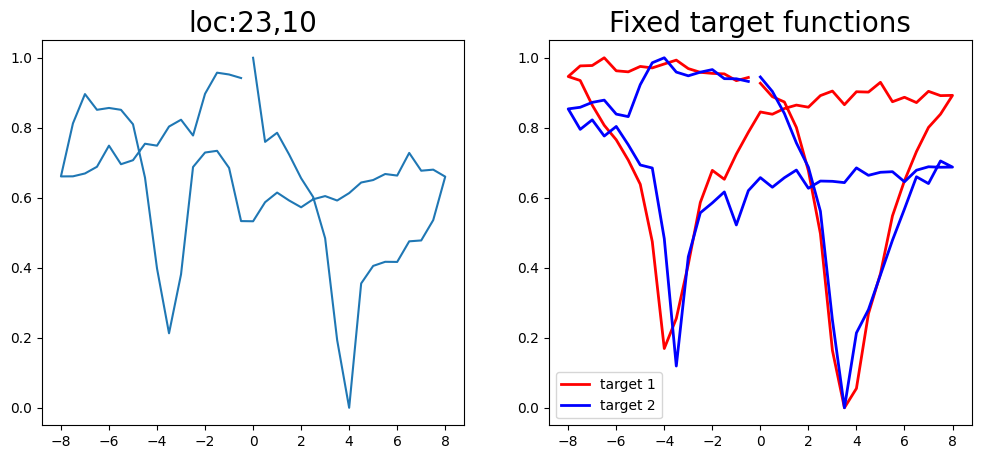

Epoch 1/200 ... Training loss: 4.8237
Epoch 10/200 ... Training loss: 4.8098
Epoch 20/200 ... Training loss: 4.2784
Epoch 30/200 ... Training loss: 3.872
Epoch 40/200 ... Training loss: 3.261
Epoch 50/200 ... Training loss: 2.7683
Epoch 60/200 ... Training loss: 2.5463
Epoch 70/200 ... Training loss: 2.3617
Epoch 80/200 ... Training loss: 2.2407
Epoch 90/200 ... Training loss: 2.1425
Epoch 100/200 ... Training loss: 2.0591
Epoch 110/200 ... Training loss: 1.9843
Epoch 120/200 ... Training loss: 1.9167
Epoch 130/200 ... Training loss: 1.855
Epoch 140/200 ... Training loss: 1.7981
Epoch 150/200 ... Training loss: 1.7452
Epoch 160/200 ... Training loss: 1.6956
Epoch 170/200 ... Training loss: 1.6486
Epoch 180/200 ... Training loss: 1.604
Epoch 190/200 ... Training loss: 1.5611
Epoch 200/200 ... Training loss: 1.5198
Epoch 1/200 ... Training loss: 3.8575
Epoch 10/200 ... Training loss: 3.8052
Epoch 20/200 ... Training loss: 3.4118
Epoch 30/200 ... Training loss: 3.0786
Epoch 40/200 ... Tra

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(
C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


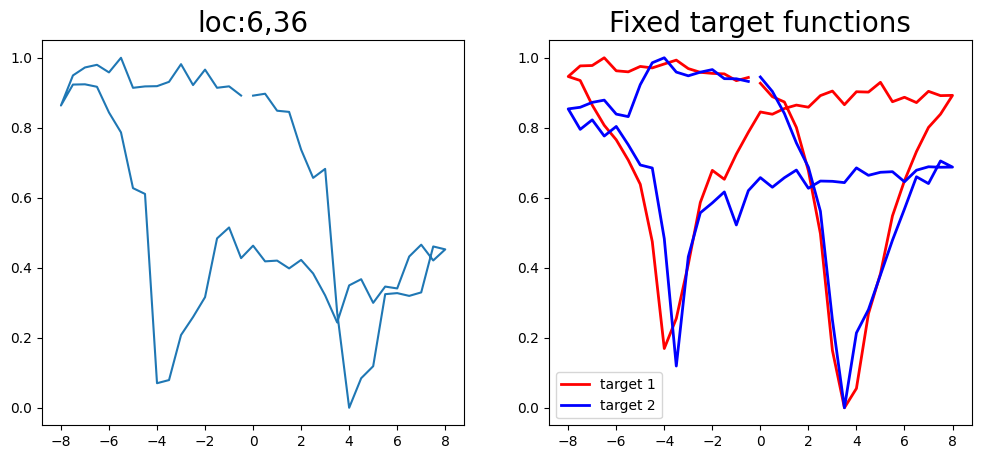

Epoch 1/200 ... Training loss: 4.6828
Epoch 10/200 ... Training loss: 4.225
Epoch 20/200 ... Training loss: 3.4745
Epoch 30/200 ... Training loss: 2.9926
Epoch 40/200 ... Training loss: 2.7347
Epoch 50/200 ... Training loss: 2.5101
Epoch 60/200 ... Training loss: 2.3426
Epoch 70/200 ... Training loss: 2.2172
Epoch 80/200 ... Training loss: 2.1081
Epoch 90/200 ... Training loss: 2.0115
Epoch 100/200 ... Training loss: 1.9247
Epoch 110/200 ... Training loss: 1.8458
Epoch 120/200 ... Training loss: 1.7735
Epoch 130/200 ... Training loss: 1.7062
Epoch 140/200 ... Training loss: 1.6426
Epoch 150/200 ... Training loss: 1.5823
Epoch 160/200 ... Training loss: 1.5264
Epoch 170/200 ... Training loss: 1.4705
Epoch 180/200 ... Training loss: 1.4163
Epoch 190/200 ... Training loss: 1.3638
Epoch 200/200 ... Training loss: 1.3179
Epoch 1/200 ... Training loss: 3.7541
Epoch 10/200 ... Training loss: 3.4355
Epoch 20/200 ... Training loss: 3.0984
Epoch 30/200 ... Training loss: 2.8426
Epoch 40/200 ... 

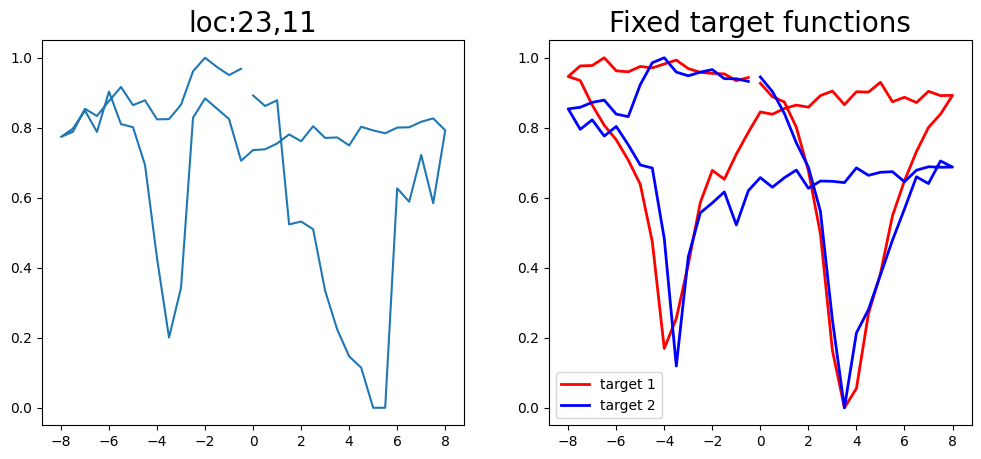

Epoch 1/200 ... Training loss: 4.5608
Epoch 10/200 ... Training loss: 3.4958
Epoch 20/200 ... Training loss: 3.1409
Epoch 30/200 ... Training loss: 2.7746
Epoch 40/200 ... Training loss: 2.5633
Epoch 50/200 ... Training loss: 2.3888
Epoch 60/200 ... Training loss: 2.2441
Epoch 70/200 ... Training loss: 2.116
Epoch 80/200 ... Training loss: 2.0024
Epoch 90/200 ... Training loss: 1.9015
Epoch 100/200 ... Training loss: 1.8088
Epoch 110/200 ... Training loss: 1.7228
Epoch 120/200 ... Training loss: 1.6453
Epoch 130/200 ... Training loss: 1.8058
Epoch 140/200 ... Training loss: 1.6072
Epoch 150/200 ... Training loss: 1.4656
Epoch 160/200 ... Training loss: 1.3899
Epoch 170/200 ... Training loss: 1.3247
Epoch 180/200 ... Training loss: 1.2634
Epoch 190/200 ... Training loss: 1.2034
Epoch 200/200 ... Training loss: 1.1408
Epoch 1/200 ... Training loss: 3.6426
Epoch 10/200 ... Training loss: 3.605
Epoch 20/200 ... Training loss: 3.2118
Epoch 30/200 ... Training loss: 2.8887
Epoch 40/200 ... T

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


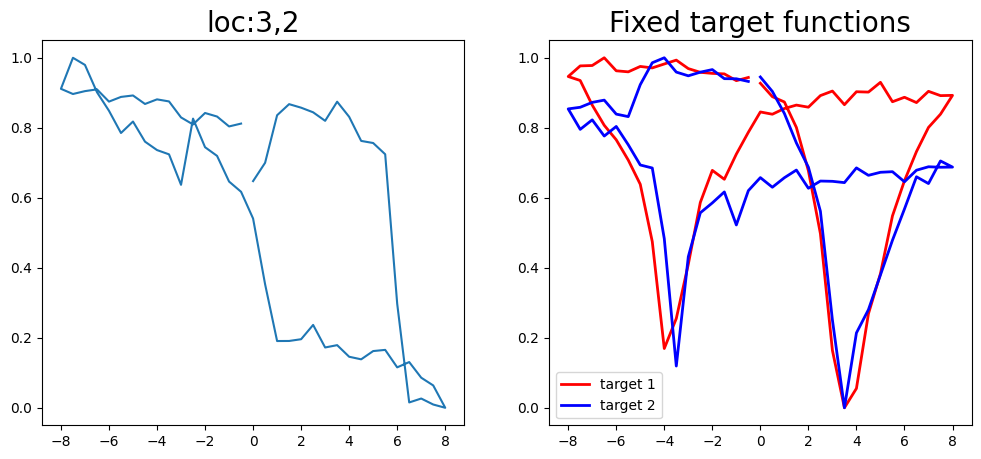

Epoch 1/200 ... Training loss: 5.0886
Epoch 10/200 ... Training loss: 3.8498
Epoch 20/200 ... Training loss: 3.0734
Epoch 30/200 ... Training loss: 2.7146
Epoch 40/200 ... Training loss: 2.4883
Epoch 50/200 ... Training loss: 2.3169
Epoch 60/200 ... Training loss: 2.1807
Epoch 70/200 ... Training loss: 2.0647
Epoch 80/200 ... Training loss: 1.9652
Epoch 90/200 ... Training loss: 1.8766
Epoch 100/200 ... Training loss: 1.7966
Epoch 110/200 ... Training loss: 1.7237
Epoch 120/200 ... Training loss: 1.6564
Epoch 130/200 ... Training loss: 1.5934
Epoch 140/200 ... Training loss: 1.534
Epoch 150/200 ... Training loss: 1.4781
Epoch 160/200 ... Training loss: 1.4232
Epoch 170/200 ... Training loss: 1.371
Epoch 180/200 ... Training loss: 1.32
Epoch 190/200 ... Training loss: 1.2725
Epoch 200/200 ... Training loss: 1.2238
Epoch 1/200 ... Training loss: 4.229
Epoch 10/200 ... Training loss: 3.5806
Epoch 20/200 ... Training loss: 2.8539
Epoch 30/200 ... Training loss: 2.6131
Epoch 40/200 ... Trai

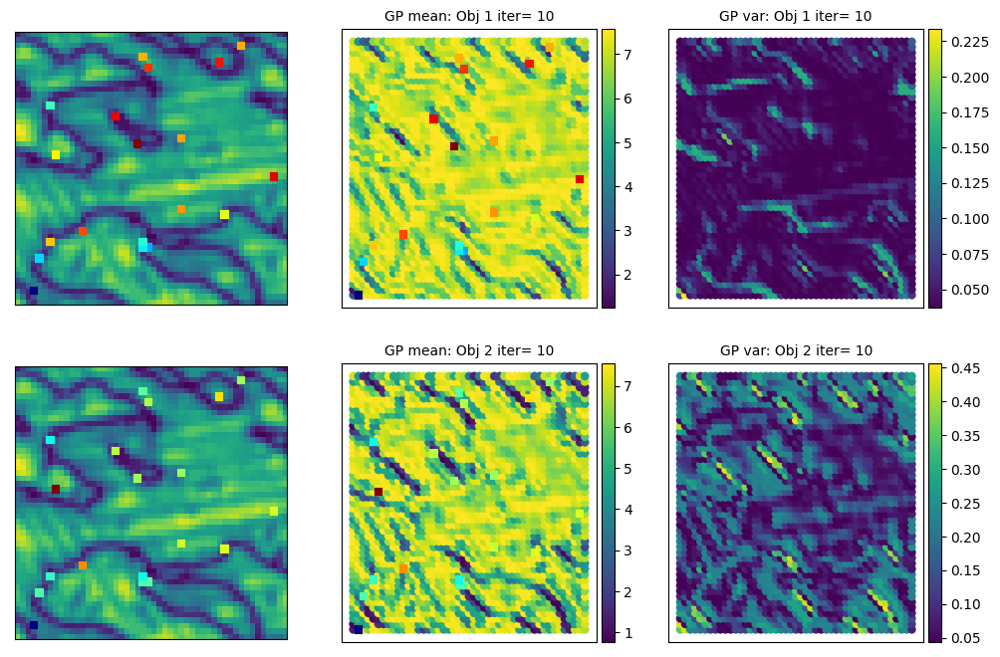

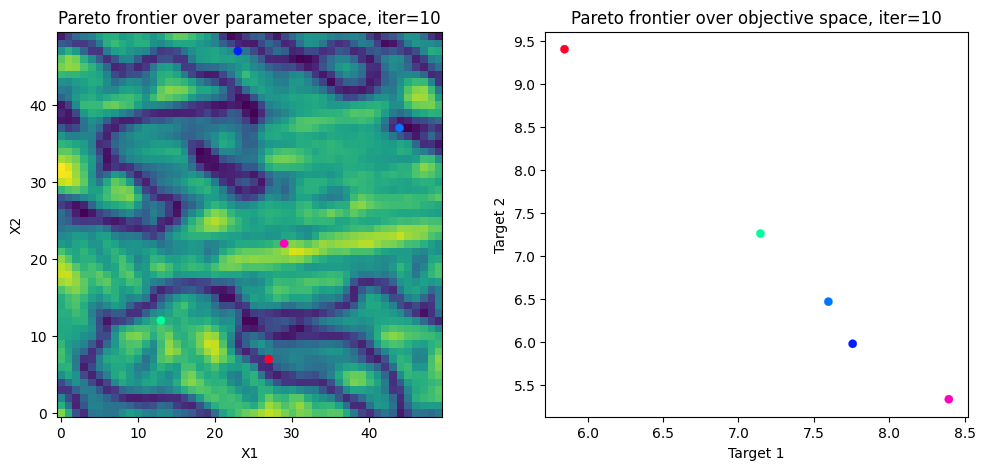

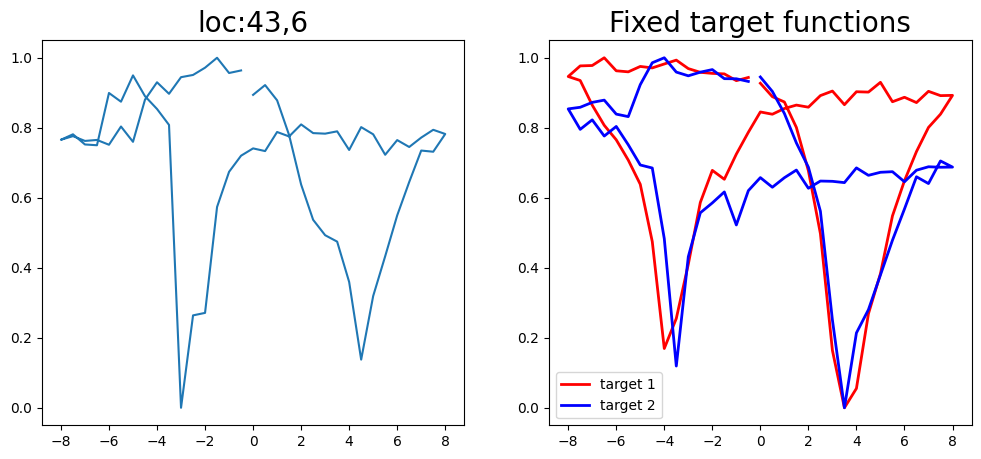

Epoch 1/200 ... Training loss: 4.947
Epoch 10/200 ... Training loss: 4.0222
Epoch 20/200 ... Training loss: 3.2431
Epoch 30/200 ... Training loss: 2.7001
Epoch 40/200 ... Training loss: 2.4446
Epoch 50/200 ... Training loss: 2.2561
Epoch 60/200 ... Training loss: 2.1185
Epoch 70/200 ... Training loss: 2.0064
Epoch 80/200 ... Training loss: 1.9135
Epoch 90/200 ... Training loss: 1.8314
Epoch 100/200 ... Training loss: 1.7576
Epoch 110/200 ... Training loss: 1.6905
Epoch 120/200 ... Training loss: 1.6287
Epoch 130/200 ... Training loss: 1.5711
Epoch 140/200 ... Training loss: 1.5169
Epoch 150/200 ... Training loss: 1.4656
Epoch 160/200 ... Training loss: 1.4168
Epoch 170/200 ... Training loss: 1.3687
Epoch 180/200 ... Training loss: 1.3223
Epoch 190/200 ... Training loss: 1.2778
Epoch 200/200 ... Training loss: 1.2358
Epoch 1/200 ... Training loss: 4.0996
Epoch 10/200 ... Training loss: 3.6973
Epoch 20/200 ... Training loss: 3.1355
Epoch 30/200 ... Training loss: 2.6814
Epoch 40/200 ... 

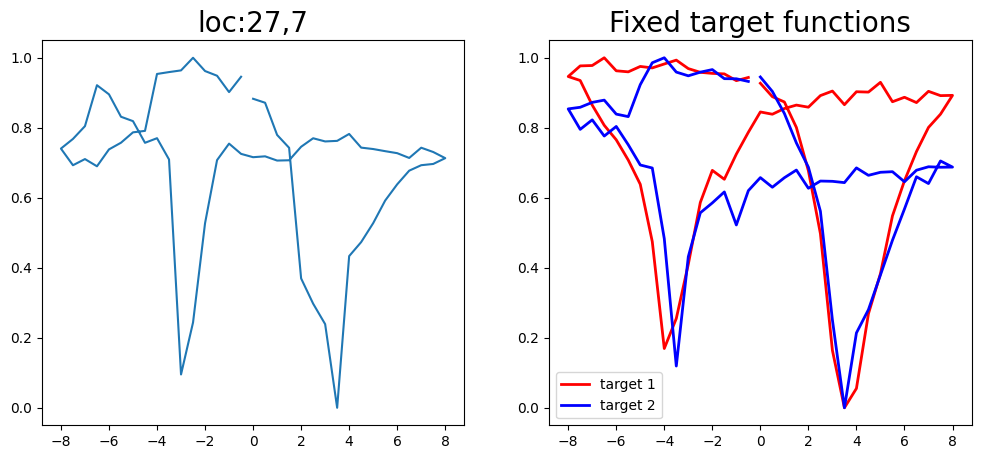

Epoch 1/200 ... Training loss: 4.824
Epoch 10/200 ... Training loss: 3.6078
Epoch 20/200 ... Training loss: 2.9668
Epoch 30/200 ... Training loss: 2.606
Epoch 40/200 ... Training loss: 2.3635
Epoch 50/200 ... Training loss: 2.1818
Epoch 60/200 ... Training loss: 2.0505
Epoch 70/200 ... Training loss: 1.9437
Epoch 80/200 ... Training loss: 1.8536
Epoch 90/200 ... Training loss: 1.7726
Epoch 100/200 ... Training loss: 1.7002
Epoch 110/200 ... Training loss: 1.6344
Epoch 120/200 ... Training loss: 1.5737
Epoch 130/200 ... Training loss: 1.5266
Epoch 140/200 ... Training loss: 1.4643
Epoch 150/200 ... Training loss: 1.4134
Epoch 160/200 ... Training loss: 1.3638
Epoch 170/200 ... Training loss: 1.3176
Epoch 180/200 ... Training loss: 1.2781
Epoch 190/200 ... Training loss: 1.2276
Epoch 200/200 ... Training loss: 1.1806
Epoch 1/200 ... Training loss: 3.9526
Epoch 10/200 ... Training loss: 2.9989
Epoch 20/200 ... Training loss: 2.765
Epoch 30/200 ... Training loss: 2.5886
Epoch 40/200 ... Tr

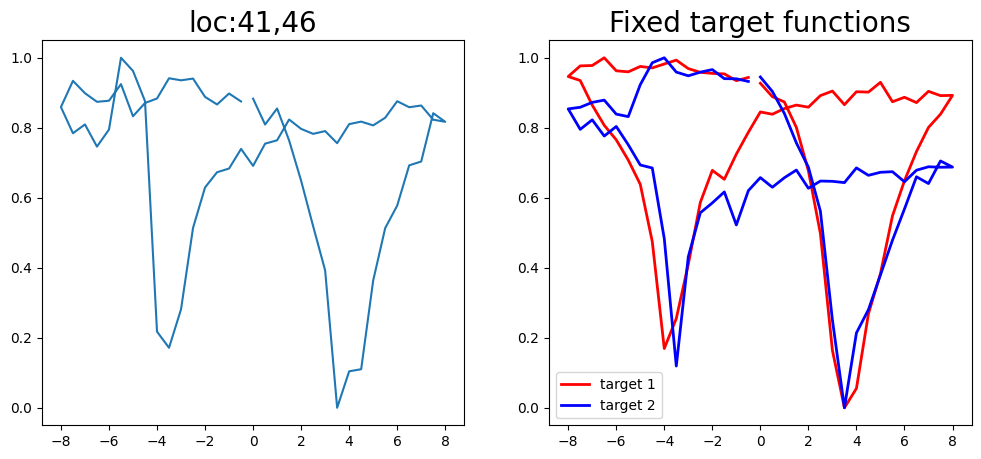

Epoch 1/200 ... Training loss: 4.6777
Epoch 10/200 ... Training loss: 3.3309
Epoch 20/200 ... Training loss: 2.9891
Epoch 30/200 ... Training loss: 2.7838
Epoch 40/200 ... Training loss: 2.328
Epoch 50/200 ... Training loss: 2.1414
Epoch 60/200 ... Training loss: 2.0208
Epoch 70/200 ... Training loss: 1.9213
Epoch 80/200 ... Training loss: 1.8307
Epoch 90/200 ... Training loss: 1.7435
Epoch 100/200 ... Training loss: 1.6708
Epoch 110/200 ... Training loss: 1.6043
Epoch 120/200 ... Training loss: 1.5424
Epoch 130/200 ... Training loss: 1.4834
Epoch 140/200 ... Training loss: 1.4272
Epoch 150/200 ... Training loss: 1.3735
Epoch 160/200 ... Training loss: 1.3215
Epoch 170/200 ... Training loss: 1.2717
Epoch 180/200 ... Training loss: 1.2238
Epoch 190/200 ... Training loss: 1.1741
Epoch 200/200 ... Training loss: 1.131
Epoch 1/200 ... Training loss: 3.8303
Epoch 10/200 ... Training loss: 3.5764
Epoch 20/200 ... Training loss: 3.231
Epoch 30/200 ... Training loss: 2.7912
Epoch 40/200 ... Tr

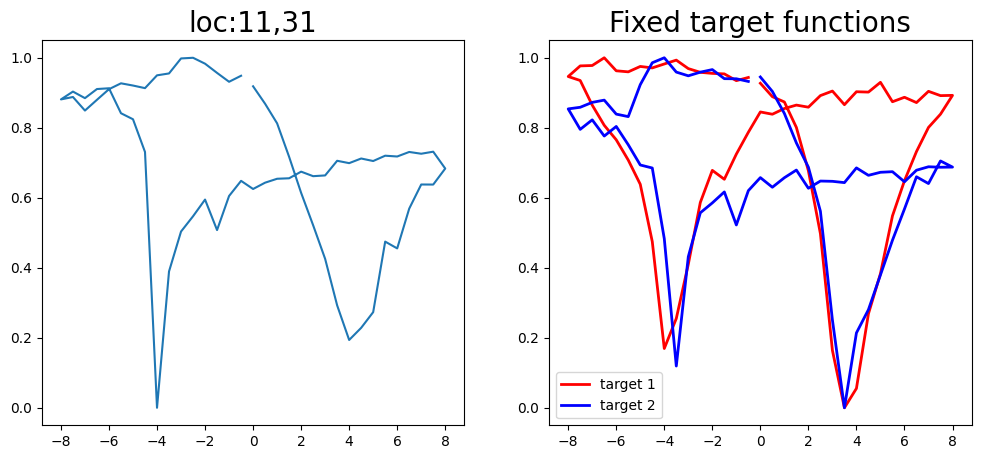

Epoch 1/200 ... Training loss: 4.5215
Epoch 10/200 ... Training loss: 3.6419
Epoch 20/200 ... Training loss: 2.8629
Epoch 30/200 ... Training loss: 2.5911
Epoch 40/200 ... Training loss: 2.2383
Epoch 50/200 ... Training loss: 2.0704
Epoch 60/200 ... Training loss: 1.9568
Epoch 70/200 ... Training loss: 1.8587
Epoch 80/200 ... Training loss: 1.771
Epoch 90/200 ... Training loss: 1.6935
Epoch 100/200 ... Training loss: 1.6235
Epoch 110/200 ... Training loss: 1.5585
Epoch 120/200 ... Training loss: 1.4977
Epoch 130/200 ... Training loss: 1.4402
Epoch 140/200 ... Training loss: 1.3854
Epoch 150/200 ... Training loss: 1.3329
Epoch 160/200 ... Training loss: 1.2817
Epoch 170/200 ... Training loss: 1.2349
Epoch 180/200 ... Training loss: 1.1833
Epoch 190/200 ... Training loss: 1.1352
Epoch 200/200 ... Training loss: 1.0887
Epoch 1/200 ... Training loss: 3.7109
Epoch 10/200 ... Training loss: 3.5692
Epoch 20/200 ... Training loss: 3.2314
Epoch 30/200 ... Training loss: 2.9643
Epoch 40/200 ... 

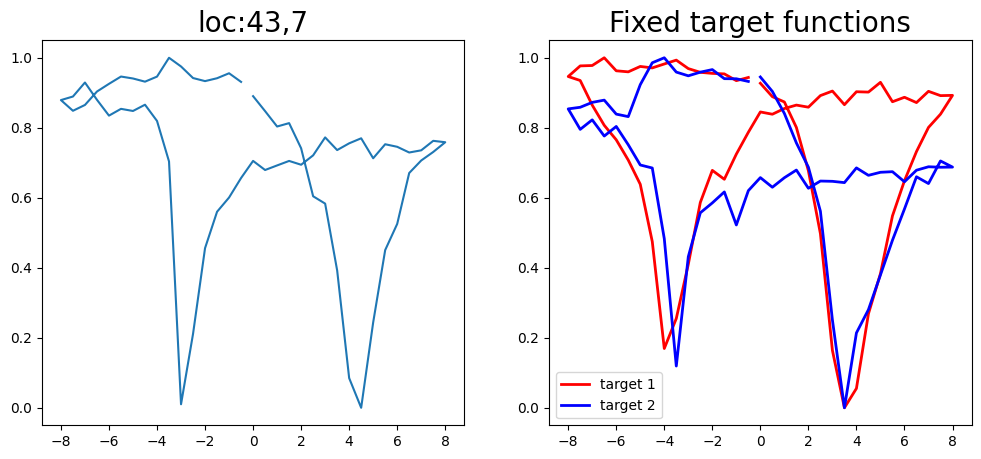

Epoch 1/200 ... Training loss: 4.3647
Epoch 10/200 ... Training loss: 3.4758
Epoch 20/200 ... Training loss: 2.8451
Epoch 30/200 ... Training loss: 2.4953
Epoch 40/200 ... Training loss: 2.1831
Epoch 50/200 ... Training loss: 2.0216
Epoch 60/200 ... Training loss: 1.9153
Epoch 70/200 ... Training loss: 1.8167
Epoch 80/200 ... Training loss: 1.7284
Epoch 90/200 ... Training loss: 1.6584
Epoch 100/200 ... Training loss: 1.5861
Epoch 110/200 ... Training loss: 1.5215
Epoch 120/200 ... Training loss: 1.4619
Epoch 130/200 ... Training loss: 1.4049
Epoch 140/200 ... Training loss: 1.3507
Epoch 150/200 ... Training loss: 1.2987
Epoch 160/200 ... Training loss: 1.2501
Epoch 170/200 ... Training loss: 1.1983
Epoch 180/200 ... Training loss: 1.1498
Epoch 190/200 ... Training loss: 1.1114
Epoch 200/200 ... Training loss: 1.0588
Epoch 1/200 ... Training loss: 3.5879
Epoch 10/200 ... Training loss: 3.3791
Epoch 20/200 ... Training loss: 3.0362
Epoch 30/200 ... Training loss: 2.5784
Epoch 40/200 ...

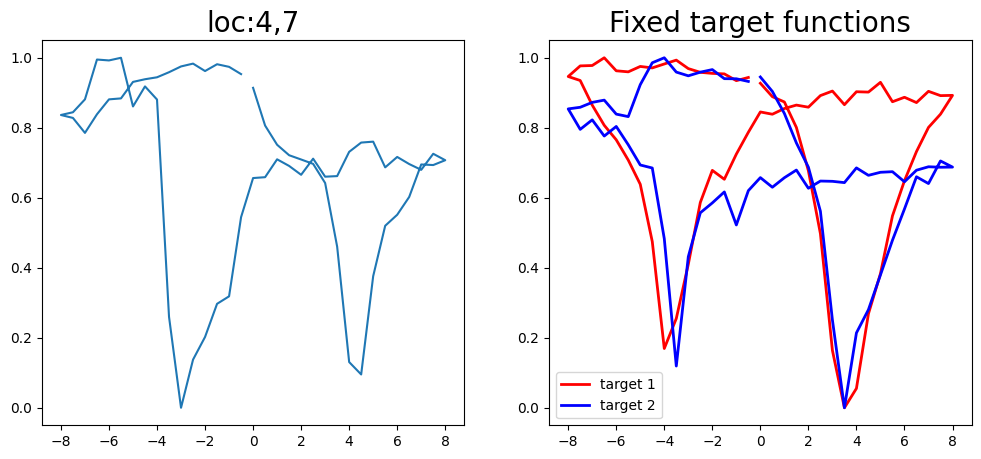

Epoch 1/200 ... Training loss: 4.2659
Epoch 10/200 ... Training loss: 3.3316
Epoch 20/200 ... Training loss: 2.8005
Epoch 30/200 ... Training loss: 2.4456
Epoch 40/200 ... Training loss: 2.1388
Epoch 50/200 ... Training loss: 1.9763
Epoch 60/200 ... Training loss: 1.8647
Epoch 70/200 ... Training loss: 1.7707
Epoch 80/200 ... Training loss: 1.687
Epoch 90/200 ... Training loss: 1.6113
Epoch 100/200 ... Training loss: 1.543
Epoch 110/200 ... Training loss: 1.477
Epoch 120/200 ... Training loss: 1.416
Epoch 130/200 ... Training loss: 1.3578
Epoch 140/200 ... Training loss: 1.3056
Epoch 150/200 ... Training loss: 1.2482
Epoch 160/200 ... Training loss: 1.1958
Epoch 170/200 ... Training loss: 1.1433
Epoch 180/200 ... Training loss: 1.0921
Epoch 190/200 ... Training loss: 1.074
Epoch 200/200 ... Training loss: 1.0026
Epoch 1/200 ... Training loss: 3.4766
Epoch 10/200 ... Training loss: 3.4181
Epoch 20/200 ... Training loss: 3.1952
Epoch 30/200 ... Training loss: 2.8097
Epoch 40/200 ... Trai

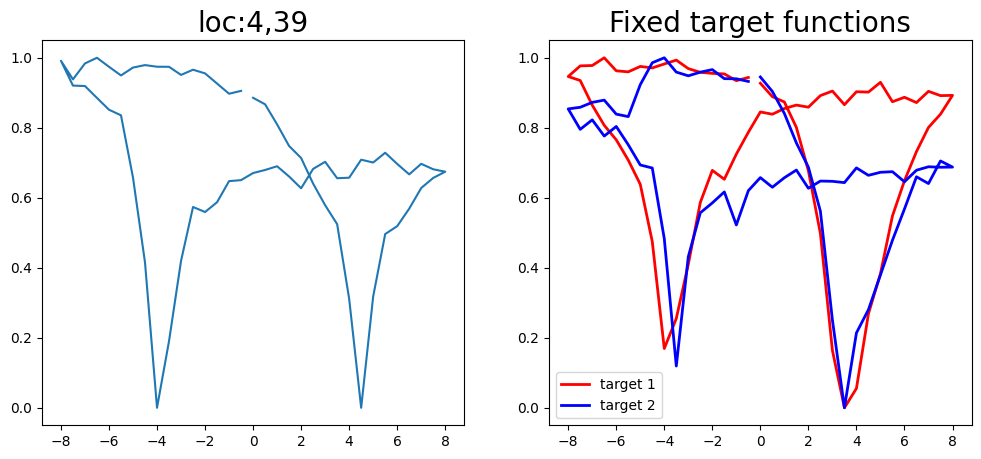

Epoch 1/200 ... Training loss: 4.2413
Epoch 10/200 ... Training loss: 4.2046
Epoch 20/200 ... Training loss: 3.7241
Epoch 30/200 ... Training loss: 3.3033
Epoch 40/200 ... Training loss: 2.8174
Epoch 50/200 ... Training loss: 2.366
Epoch 60/200 ... Training loss: 2.0778
Epoch 70/200 ... Training loss: 1.8394
Epoch 80/200 ... Training loss: 1.7336
Epoch 90/200 ... Training loss: 1.667
Epoch 100/200 ... Training loss: 1.6145
Epoch 110/200 ... Training loss: 1.5637
Epoch 120/200 ... Training loss: 1.5146
Epoch 130/200 ... Training loss: 1.4705
Epoch 140/200 ... Training loss: 1.4299
Epoch 150/200 ... Training loss: 1.3914
Epoch 160/200 ... Training loss: 1.3548
Epoch 170/200 ... Training loss: 1.3288
Epoch 180/200 ... Training loss: 1.2865
Epoch 190/200 ... Training loss: 1.2577
Epoch 200/200 ... Training loss: 1.2214
Epoch 1/200 ... Training loss: 3.4084
Epoch 10/200 ... Training loss: 3.5886
Epoch 20/200 ... Training loss: 2.8734
Epoch 30/200 ... Training loss: 2.4702
Epoch 40/200 ... T

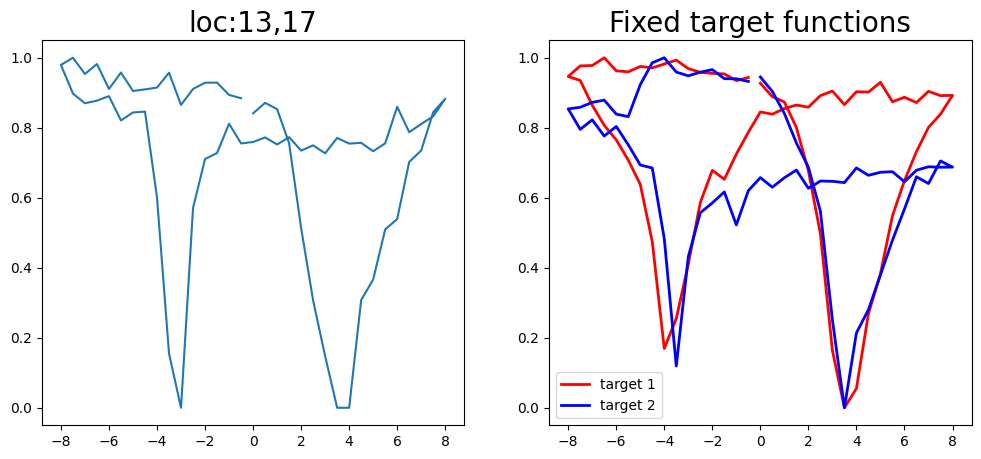

Epoch 1/200 ... Training loss: 4.1232
Epoch 10/200 ... Training loss: 3.3829
Epoch 20/200 ... Training loss: 2.6356
Epoch 30/200 ... Training loss: 2.1898
Epoch 40/200 ... Training loss: 2.0102
Epoch 50/200 ... Training loss: 1.8868
Epoch 60/200 ... Training loss: 1.7803
Epoch 70/200 ... Training loss: 1.6891
Epoch 80/200 ... Training loss: 1.61
Epoch 90/200 ... Training loss: 1.537
Epoch 100/200 ... Training loss: 1.4708
Epoch 110/200 ... Training loss: 1.4093
Epoch 120/200 ... Training loss: 1.3505
Epoch 130/200 ... Training loss: 1.2965
Epoch 140/200 ... Training loss: 1.2447
Epoch 150/200 ... Training loss: 1.1903
Epoch 160/200 ... Training loss: 1.1402
Epoch 170/200 ... Training loss: 1.1042
Epoch 180/200 ... Training loss: 1.0601
Epoch 190/200 ... Training loss: 1.0047
Epoch 200/200 ... Training loss: 0.9568
Epoch 1/200 ... Training loss: 3.3256
Epoch 10/200 ... Training loss: 2.8005
Epoch 20/200 ... Training loss: 2.4168
Epoch 30/200 ... Training loss: 2.1292
Epoch 40/200 ... Tr

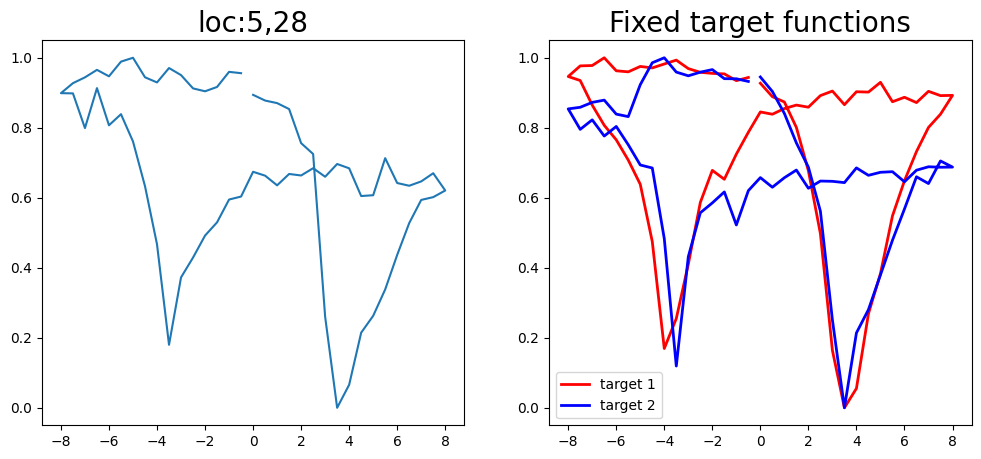

Epoch 1/200 ... Training loss: 4.0266
Epoch 10/200 ... Training loss: 3.7389
Epoch 20/200 ... Training loss: 2.6852
Epoch 30/200 ... Training loss: 2.2976
Epoch 40/200 ... Training loss: 2.0072
Epoch 50/200 ... Training loss: 1.8569
Epoch 60/200 ... Training loss: 1.7583
Epoch 70/200 ... Training loss: 1.6749
Epoch 80/200 ... Training loss: 1.605
Epoch 90/200 ... Training loss: 1.5359
Epoch 100/200 ... Training loss: 1.4723
Epoch 110/200 ... Training loss: 1.4273
Epoch 120/200 ... Training loss: 1.3962
Epoch 130/200 ... Training loss: 1.319
Epoch 140/200 ... Training loss: 1.2636
Epoch 150/200 ... Training loss: 1.2146
Epoch 160/200 ... Training loss: 1.1675
Epoch 170/200 ... Training loss: 1.1218
Epoch 180/200 ... Training loss: 1.0913
Epoch 190/200 ... Training loss: 1.0403
Epoch 200/200 ... Training loss: 0.9911
Epoch 1/200 ... Training loss: 3.2525
Epoch 10/200 ... Training loss: 2.8989
Epoch 20/200 ... Training loss: 2.5386
Epoch 30/200 ... Training loss: 2.2299
Epoch 40/200 ... T

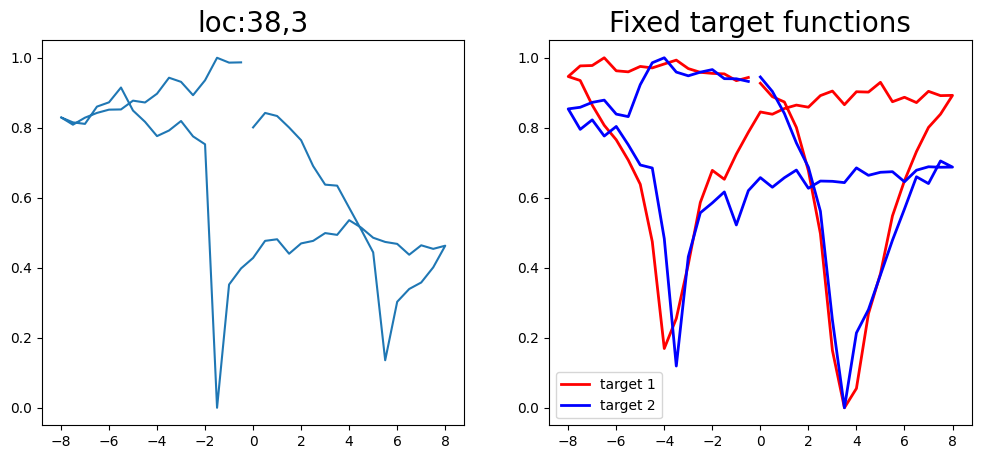

Epoch 1/200 ... Training loss: 4.0913
Epoch 10/200 ... Training loss: 3.0424
Epoch 20/200 ... Training loss: 2.6335
Epoch 30/200 ... Training loss: 2.1572
Epoch 40/200 ... Training loss: 1.9315
Epoch 50/200 ... Training loss: 1.8045
Epoch 60/200 ... Training loss: 1.7079
Epoch 70/200 ... Training loss: 1.6235
Epoch 80/200 ... Training loss: 1.5466
Epoch 90/200 ... Training loss: 1.4825
Epoch 100/200 ... Training loss: 1.4141
Epoch 110/200 ... Training loss: 1.3526
Epoch 120/200 ... Training loss: 1.2944
Epoch 130/200 ... Training loss: 1.2389
Epoch 140/200 ... Training loss: 1.1877
Epoch 150/200 ... Training loss: 1.1365
Epoch 160/200 ... Training loss: 1.094
Epoch 170/200 ... Training loss: 1.0345
Epoch 180/200 ... Training loss: 0.9927
Epoch 190/200 ... Training loss: 0.9384
Epoch 200/200 ... Training loss: 0.8997
Epoch 1/200 ... Training loss: 3.3185
Epoch 10/200 ... Training loss: 2.6881
Epoch 20/200 ... Training loss: 2.2883
Epoch 30/200 ... Training loss: 2.015
Epoch 40/200 ... T

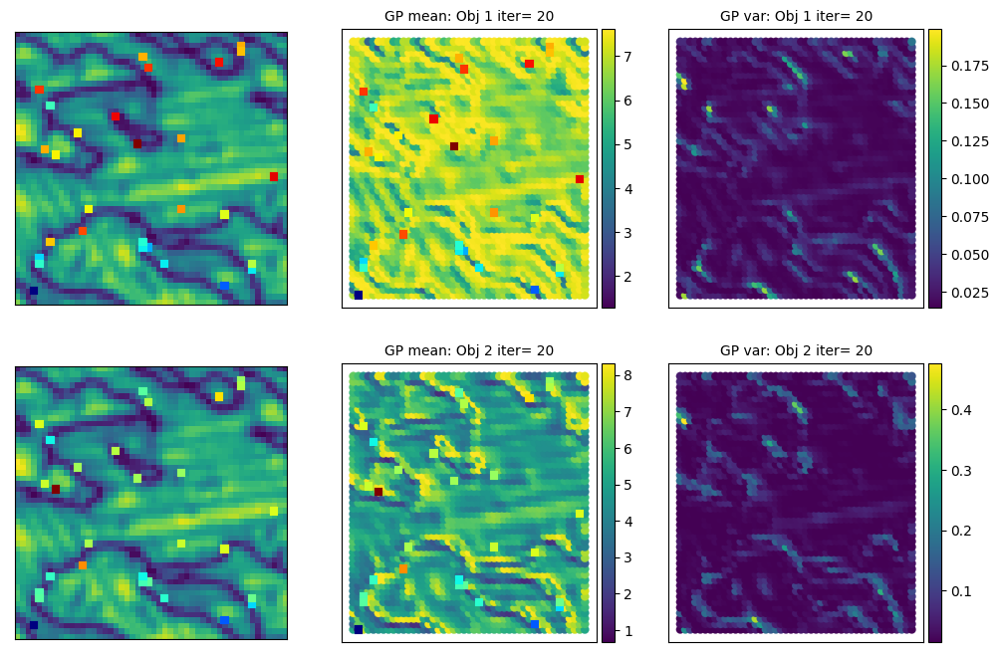

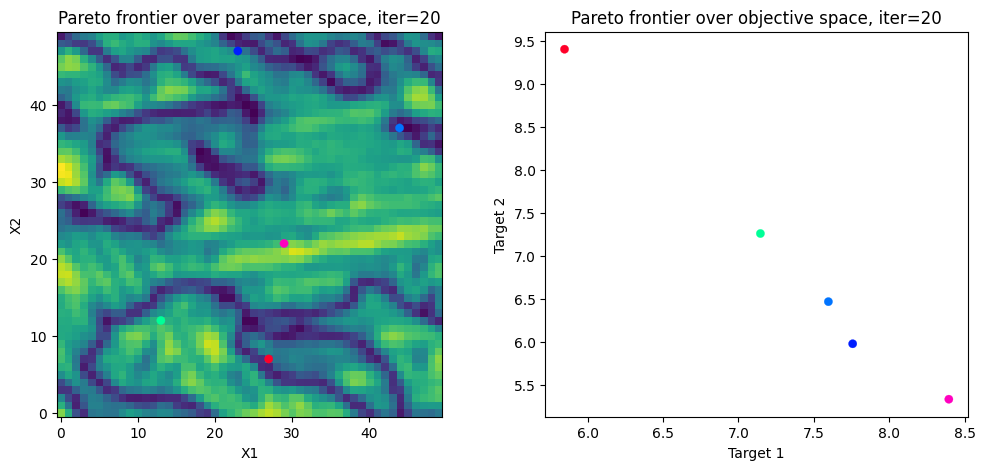

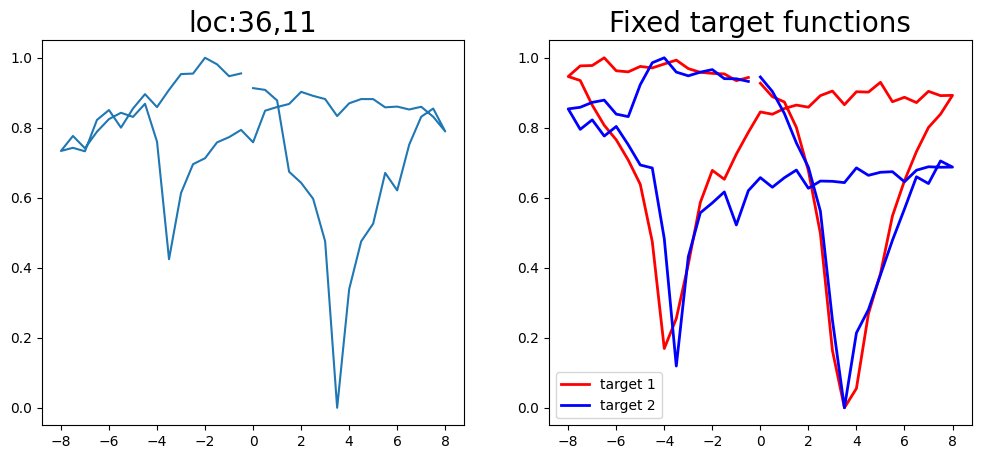

Epoch 1/200 ... Training loss: 3.9839
Epoch 10/200 ... Training loss: 2.9177
Epoch 20/200 ... Training loss: 2.476
Epoch 30/200 ... Training loss: 2.2312
Epoch 40/200 ... Training loss: 1.9399
Epoch 50/200 ... Training loss: 1.7785
Epoch 60/200 ... Training loss: 1.6789
Epoch 70/200 ... Training loss: 1.5943
Epoch 80/200 ... Training loss: 1.5202
Epoch 90/200 ... Training loss: 1.4519
Epoch 100/200 ... Training loss: 1.3868
Epoch 110/200 ... Training loss: 1.3436
Epoch 120/200 ... Training loss: 1.2704
Epoch 130/200 ... Training loss: 1.2159
Epoch 140/200 ... Training loss: 1.1601
Epoch 150/200 ... Training loss: 1.107
Epoch 160/200 ... Training loss: 1.0563
Epoch 170/200 ... Training loss: 1.0083
Epoch 180/200 ... Training loss: 0.967
Epoch 190/200 ... Training loss: 0.9098
Epoch 200/200 ... Training loss: 0.8663
Epoch 1/200 ... Training loss: 3.2347
Epoch 10/200 ... Training loss: 2.6571
Epoch 20/200 ... Training loss: 2.3498
Epoch 30/200 ... Training loss: 2.0159
Epoch 40/200 ... Tr

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


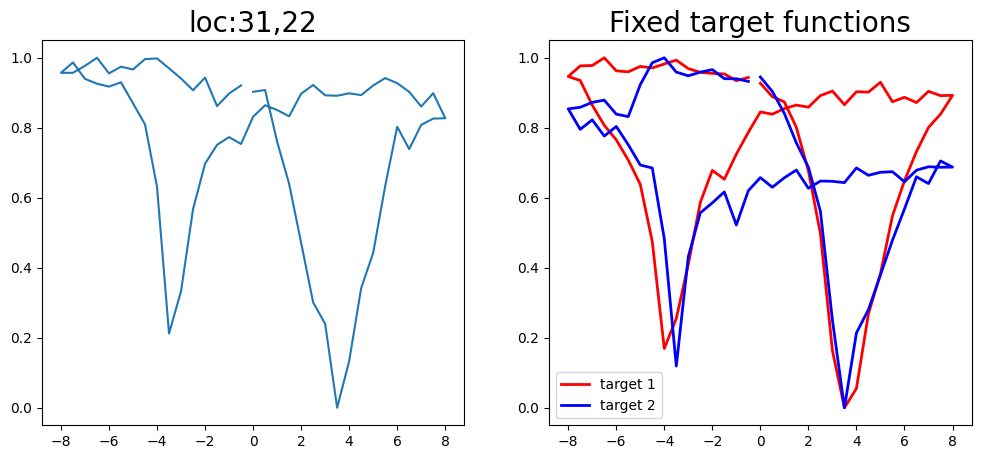

Epoch 1/200 ... Training loss: 3.9458
Epoch 10/200 ... Training loss: 3.7833
Epoch 20/200 ... Training loss: 2.6659
Epoch 30/200 ... Training loss: 2.1687
Epoch 40/200 ... Training loss: 1.9119
Epoch 50/200 ... Training loss: 1.7716
Epoch 60/200 ... Training loss: 1.6776
Epoch 70/200 ... Training loss: 1.5977
Epoch 80/200 ... Training loss: 1.5264
Epoch 90/200 ... Training loss: 1.4657
Epoch 100/200 ... Training loss: 1.4077
Epoch 110/200 ... Training loss: 1.3543
Epoch 120/200 ... Training loss: 1.3039
Epoch 130/200 ... Training loss: 1.2612
Epoch 140/200 ... Training loss: 1.2122
Epoch 150/200 ... Training loss: 1.1667
Epoch 160/200 ... Training loss: 1.1232
Epoch 170/200 ... Training loss: 1.0804
Epoch 180/200 ... Training loss: 1.0393
Epoch 190/200 ... Training loss: 0.9954
Epoch 200/200 ... Training loss: 0.9584
Epoch 1/200 ... Training loss: 3.1818
Epoch 10/200 ... Training loss: 2.82
Epoch 20/200 ... Training loss: 2.3615
Epoch 30/200 ... Training loss: 2.0826
Epoch 40/200 ... T

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


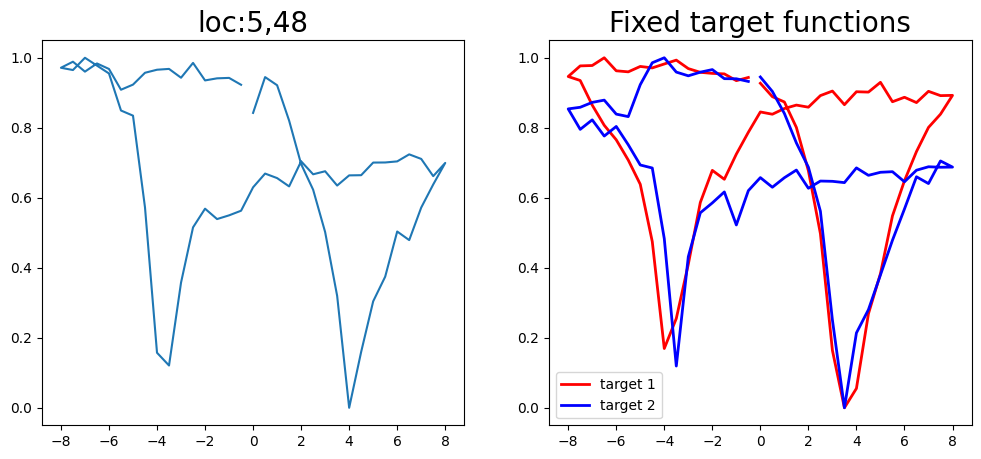

Epoch 1/200 ... Training loss: 3.9074
Epoch 10/200 ... Training loss: 3.3616
Epoch 20/200 ... Training loss: 2.7369
Epoch 30/200 ... Training loss: 2.312
Epoch 40/200 ... Training loss: 1.9607
Epoch 50/200 ... Training loss: 1.7791
Epoch 60/200 ... Training loss: 1.6647
Epoch 70/200 ... Training loss: 1.5809
Epoch 80/200 ... Training loss: 1.5126
Epoch 90/200 ... Training loss: 1.4506
Epoch 100/200 ... Training loss: 1.3939
Epoch 110/200 ... Training loss: 1.3453
Epoch 120/200 ... Training loss: 1.2981
Epoch 130/200 ... Training loss: 1.2465
Epoch 140/200 ... Training loss: 1.1981
Epoch 150/200 ... Training loss: 1.1529
Epoch 160/200 ... Training loss: 1.1087
Epoch 170/200 ... Training loss: 1.0694
Epoch 180/200 ... Training loss: 1.0259
Epoch 190/200 ... Training loss: 1.0082
Epoch 200/200 ... Training loss: 0.9524
Epoch 1/200 ... Training loss: 3.1353
Epoch 10/200 ... Training loss: 3.2133
Epoch 20/200 ... Training loss: 2.7274
Epoch 30/200 ... Training loss: 2.3262
Epoch 40/200 ... 

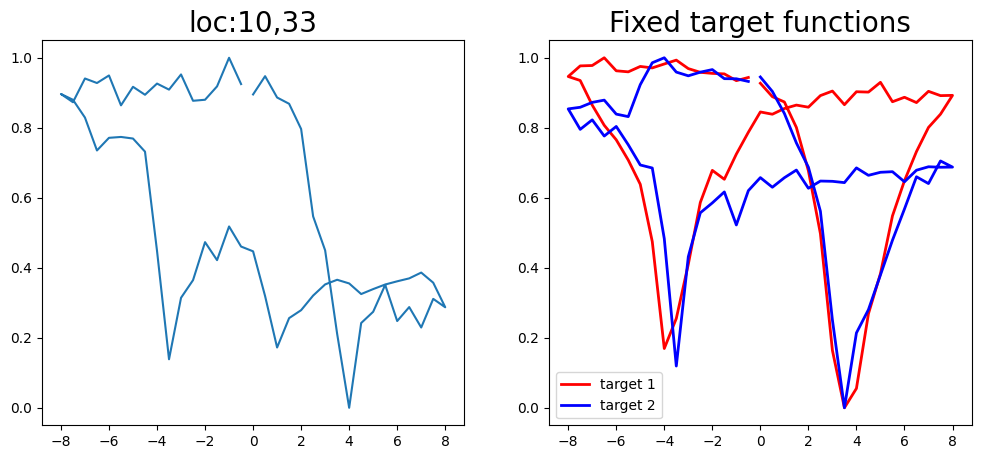

Epoch 1/200 ... Training loss: 3.8344
Epoch 10/200 ... Training loss: 3.3643
Epoch 20/200 ... Training loss: 2.6244
Epoch 30/200 ... Training loss: 2.2302
Epoch 40/200 ... Training loss: 1.9119
Epoch 50/200 ... Training loss: 1.7208
Epoch 60/200 ... Training loss: 1.6246
Epoch 70/200 ... Training loss: 1.5452
Epoch 80/200 ... Training loss: 1.4787
Epoch 90/200 ... Training loss: 1.4153
Epoch 100/200 ... Training loss: 1.3552
Epoch 110/200 ... Training loss: 1.3027
Epoch 120/200 ... Training loss: 1.2602
Epoch 130/200 ... Training loss: 1.2057
Epoch 140/200 ... Training loss: 1.1615
Epoch 150/200 ... Training loss: 1.1067
Epoch 160/200 ... Training loss: 1.0909
Epoch 170/200 ... Training loss: 1.0228
Epoch 180/200 ... Training loss: 0.9711
Epoch 190/200 ... Training loss: 0.9253
Epoch 200/200 ... Training loss: 0.8816
Epoch 1/200 ... Training loss: 3.0696
Epoch 10/200 ... Training loss: 2.5059
Epoch 20/200 ... Training loss: 2.1929
Epoch 30/200 ... Training loss: 1.9007
Epoch 40/200 ...

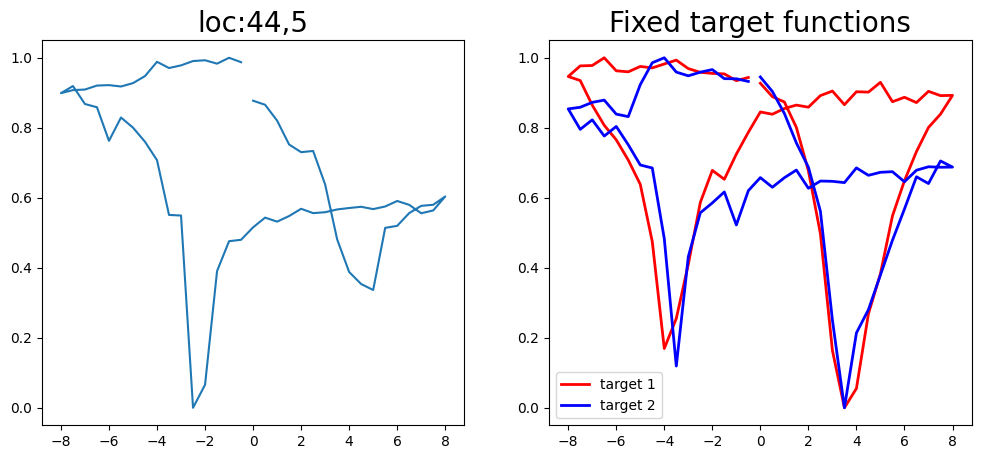

Epoch 1/200 ... Training loss: 3.7523
Epoch 10/200 ... Training loss: 3.2531
Epoch 20/200 ... Training loss: 2.5176
Epoch 30/200 ... Training loss: 2.1754
Epoch 40/200 ... Training loss: 1.8867
Epoch 50/200 ... Training loss: 1.6853
Epoch 60/200 ... Training loss: 1.5956
Epoch 70/200 ... Training loss: 1.5197
Epoch 80/200 ... Training loss: 1.4475
Epoch 90/200 ... Training loss: 1.3842
Epoch 100/200 ... Training loss: 1.3256
Epoch 110/200 ... Training loss: 1.2702
Epoch 120/200 ... Training loss: 1.2233
Epoch 130/200 ... Training loss: 1.1786
Epoch 140/200 ... Training loss: 1.1215
Epoch 150/200 ... Training loss: 1.072
Epoch 160/200 ... Training loss: 1.0235
Epoch 170/200 ... Training loss: 1.0113
Epoch 180/200 ... Training loss: 0.9402
Epoch 190/200 ... Training loss: 0.8889
Epoch 200/200 ... Training loss: 0.8457
Epoch 1/200 ... Training loss: 3.0028
Epoch 10/200 ... Training loss: 2.647
Epoch 20/200 ... Training loss: 2.3557
Epoch 30/200 ... Training loss: 1.9413
Epoch 40/200 ... T

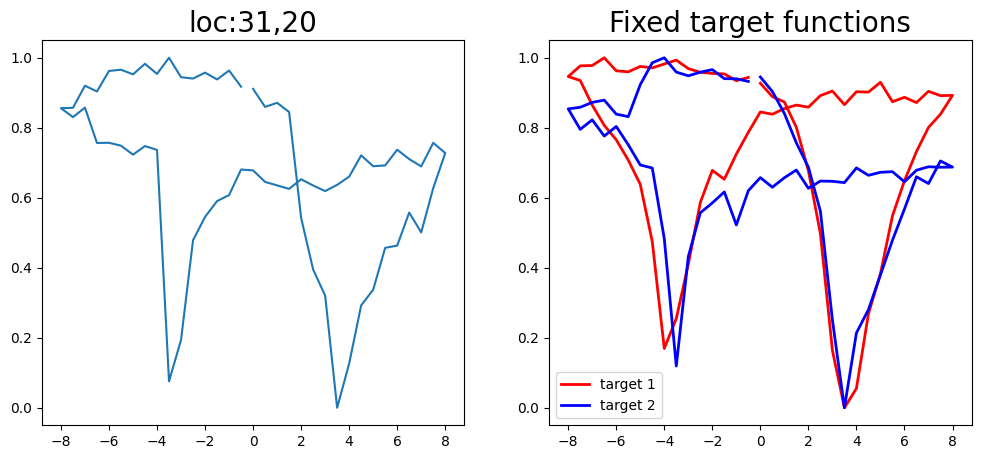

Epoch 1/200 ... Training loss: 3.672
Epoch 10/200 ... Training loss: 3.1136
Epoch 20/200 ... Training loss: 2.6987
Epoch 30/200 ... Training loss: 2.1318
Epoch 40/200 ... Training loss: 1.8447
Epoch 50/200 ... Training loss: 1.6932
Epoch 60/200 ... Training loss: 1.6
Epoch 70/200 ... Training loss: 1.5235
Epoch 80/200 ... Training loss: 1.4588
Epoch 90/200 ... Training loss: 1.5152
Epoch 100/200 ... Training loss: 1.3771
Epoch 110/200 ... Training loss: 1.2964
Epoch 120/200 ... Training loss: 1.2403
Epoch 130/200 ... Training loss: 1.1952
Epoch 140/200 ... Training loss: 1.1442
Epoch 150/200 ... Training loss: 1.0976
Epoch 160/200 ... Training loss: 1.0488
Epoch 170/200 ... Training loss: 1.003
Epoch 180/200 ... Training loss: 0.9666
Epoch 190/200 ... Training loss: 0.9093
Epoch 200/200 ... Training loss: 0.8644
Epoch 1/200 ... Training loss: 2.9683
Epoch 10/200 ... Training loss: 3.0305
Epoch 20/200 ... Training loss: 2.5691
Epoch 30/200 ... Training loss: 2.2782
Epoch 40/200 ... Trai

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


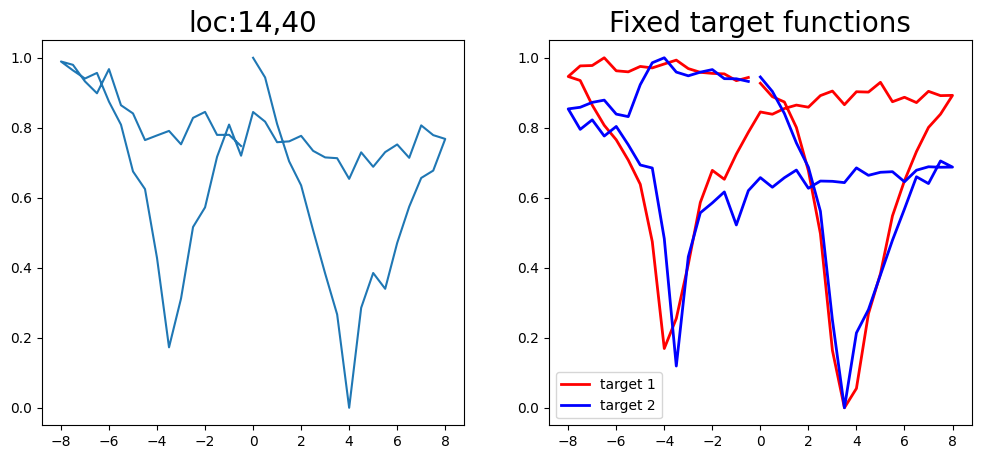

Epoch 1/200 ... Training loss: 3.5947
Epoch 10/200 ... Training loss: 3.1746
Epoch 20/200 ... Training loss: 2.3927
Epoch 30/200 ... Training loss: 2.2105
Epoch 40/200 ... Training loss: 1.8645
Epoch 50/200 ... Training loss: 1.6689
Epoch 60/200 ... Training loss: 1.5602
Epoch 70/200 ... Training loss: 1.4801
Epoch 80/200 ... Training loss: 1.4171
Epoch 90/200 ... Training loss: 1.3558
Epoch 100/200 ... Training loss: 1.2934
Epoch 110/200 ... Training loss: 1.2382
Epoch 120/200 ... Training loss: 1.1849
Epoch 130/200 ... Training loss: 1.1386
Epoch 140/200 ... Training loss: 1.0835
Epoch 150/200 ... Training loss: 1.0487
Epoch 160/200 ... Training loss: 1.0158
Epoch 170/200 ... Training loss: 0.9465
Epoch 180/200 ... Training loss: 0.9019
Epoch 190/200 ... Training loss: 0.851
Epoch 200/200 ... Training loss: 0.7979
Epoch 1/200 ... Training loss: 2.9301
Epoch 10/200 ... Training loss: 2.6587
Epoch 20/200 ... Training loss: 2.344
Epoch 30/200 ... Training loss: 2.0301
Epoch 40/200 ... T

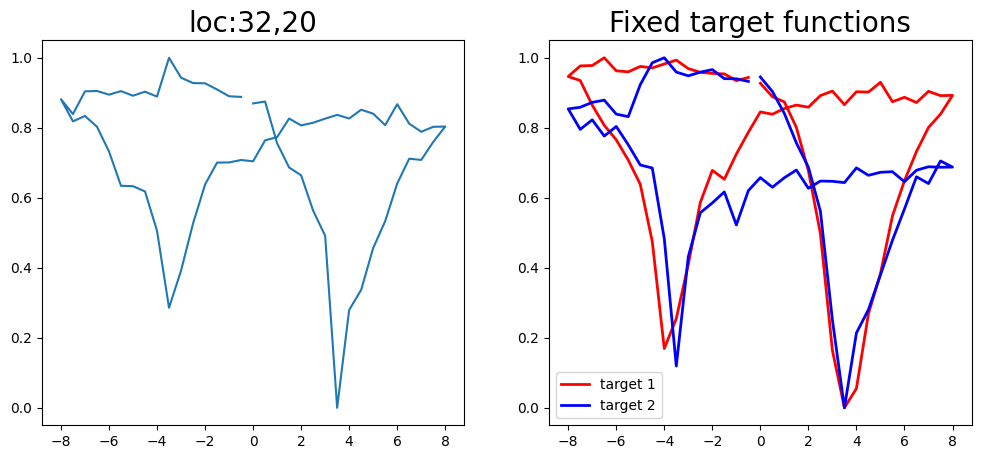

Epoch 1/200 ... Training loss: 3.5891
Epoch 10/200 ... Training loss: 2.9899
Epoch 20/200 ... Training loss: 2.4281
Epoch 30/200 ... Training loss: 2.1108
Epoch 40/200 ... Training loss: 1.8711
Epoch 50/200 ... Training loss: 1.6967
Epoch 60/200 ... Training loss: 1.5756
Epoch 70/200 ... Training loss: 1.4981
Epoch 80/200 ... Training loss: 1.433
Epoch 90/200 ... Training loss: 1.3694
Epoch 100/200 ... Training loss: 1.3147
Epoch 110/200 ... Training loss: 1.2507
Epoch 120/200 ... Training loss: 1.2071
Epoch 130/200 ... Training loss: 1.1554
Epoch 140/200 ... Training loss: 1.1093
Epoch 150/200 ... Training loss: 1.0486
Epoch 160/200 ... Training loss: 1.0256
Epoch 170/200 ... Training loss: 0.9537
Epoch 180/200 ... Training loss: 0.8945
Epoch 190/200 ... Training loss: 0.8406
Epoch 200/200 ... Training loss: 0.7996
Epoch 1/200 ... Training loss: 2.9005
Epoch 10/200 ... Training loss: 2.8542
Epoch 20/200 ... Training loss: 2.2427
Epoch 30/200 ... Training loss: 1.9325
Epoch 40/200 ... 

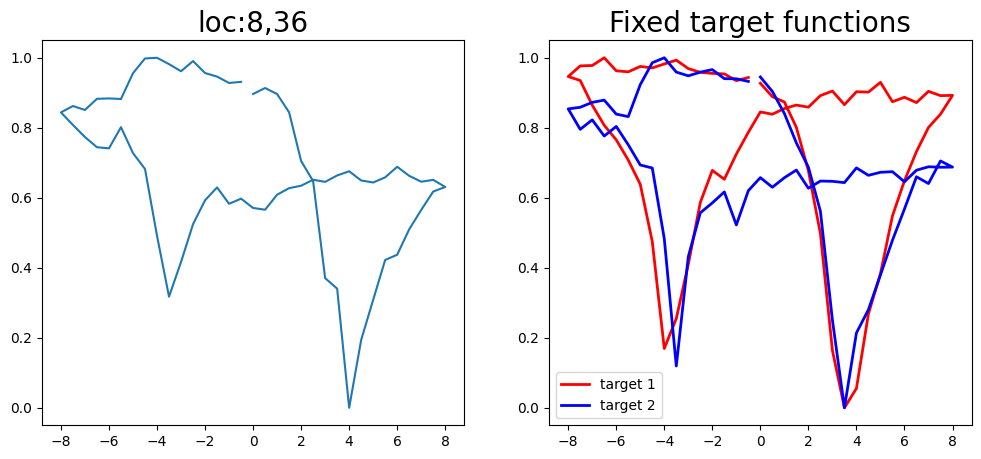

Epoch 1/200 ... Training loss: 3.5297
Epoch 10/200 ... Training loss: 3.1999
Epoch 20/200 ... Training loss: 2.4345
Epoch 30/200 ... Training loss: 2.1512
Epoch 40/200 ... Training loss: 1.8678
Epoch 50/200 ... Training loss: 1.6534
Epoch 60/200 ... Training loss: 1.5506
Epoch 70/200 ... Training loss: 1.4816
Epoch 80/200 ... Training loss: 1.4162
Epoch 90/200 ... Training loss: 1.3545
Epoch 100/200 ... Training loss: 1.3035
Epoch 110/200 ... Training loss: 1.2447
Epoch 120/200 ... Training loss: 1.189
Epoch 130/200 ... Training loss: 1.1388
Epoch 140/200 ... Training loss: 1.098
Epoch 150/200 ... Training loss: 1.0511
Epoch 160/200 ... Training loss: 0.9885
Epoch 170/200 ... Training loss: 0.9941
Epoch 180/200 ... Training loss: 0.9152
Epoch 190/200 ... Training loss: 0.8662
Epoch 200/200 ... Training loss: 0.8096
Epoch 1/200 ... Training loss: 2.9363
Epoch 10/200 ... Training loss: 2.6181
Epoch 20/200 ... Training loss: 2.2224
Epoch 30/200 ... Training loss: 1.9601
Epoch 40/200 ... T

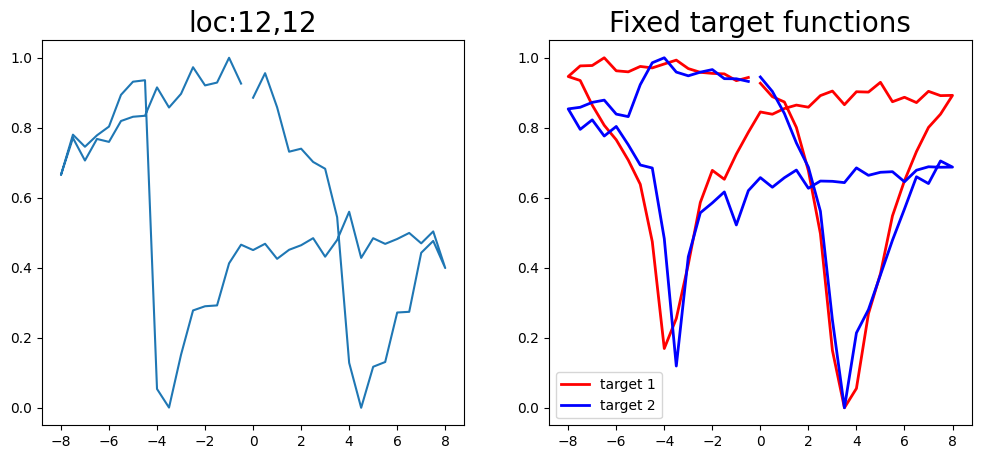

Epoch 1/200 ... Training loss: 3.5631
Epoch 10/200 ... Training loss: 2.7934
Epoch 20/200 ... Training loss: 2.2697
Epoch 30/200 ... Training loss: 1.871
Epoch 40/200 ... Training loss: 1.6768
Epoch 50/200 ... Training loss: 1.5738
Epoch 60/200 ... Training loss: 1.4934
Epoch 70/200 ... Training loss: 1.4529
Epoch 80/200 ... Training loss: 1.3635
Epoch 90/200 ... Training loss: 1.2944
Epoch 100/200 ... Training loss: 1.2399
Epoch 110/200 ... Training loss: 1.1857
Epoch 120/200 ... Training loss: 1.1279
Epoch 130/200 ... Training loss: 1.085
Epoch 140/200 ... Training loss: 1.0296
Epoch 150/200 ... Training loss: 0.9728
Epoch 160/200 ... Training loss: 1.1571
Epoch 170/200 ... Training loss: 0.9503
Epoch 180/200 ... Training loss: 0.8448
Epoch 190/200 ... Training loss: 0.8004
Epoch 200/200 ... Training loss: 0.7525
Epoch 1/200 ... Training loss: 2.9146
Epoch 10/200 ... Training loss: 2.7221
Epoch 20/200 ... Training loss: 2.5847
Epoch 30/200 ... Training loss: 2.1946
Epoch 40/200 ... T

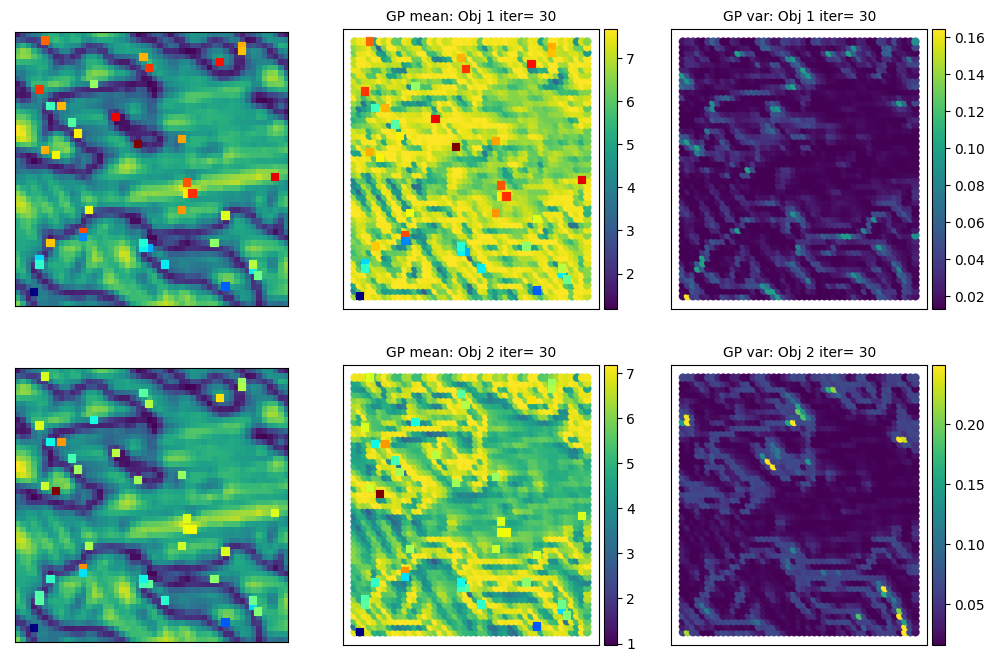

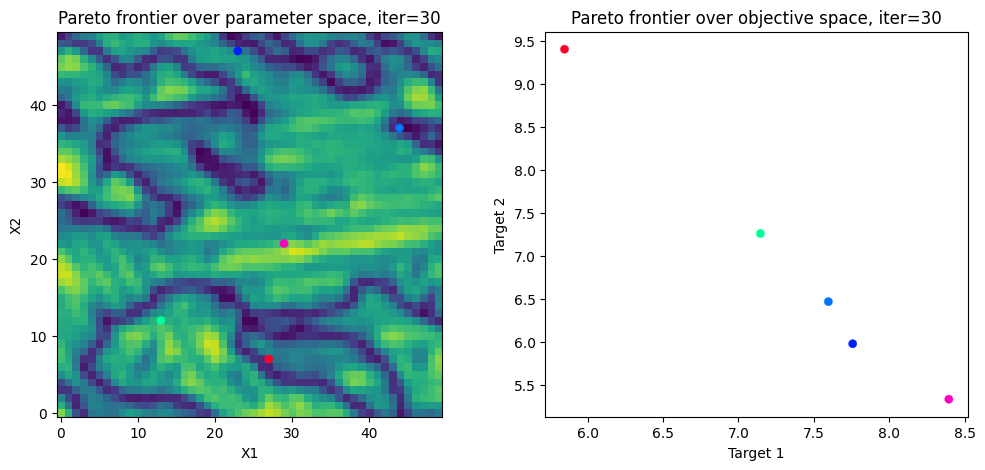

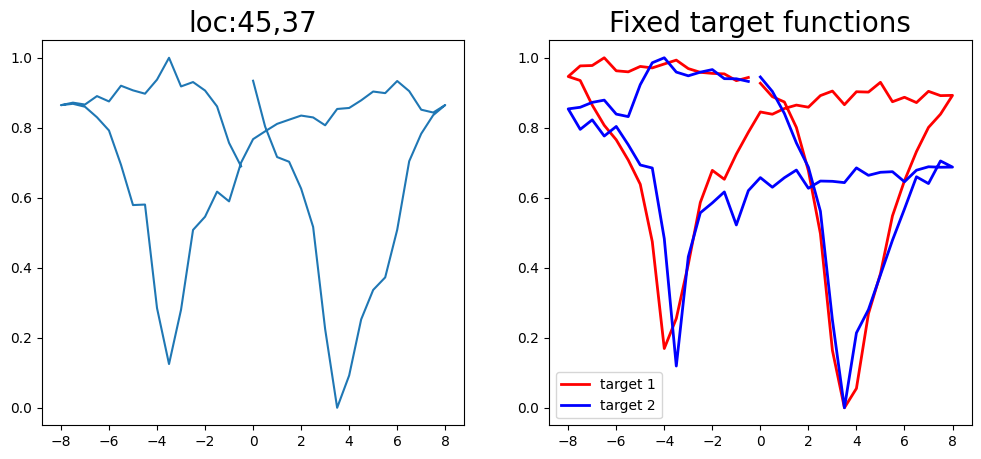

Epoch 1/200 ... Training loss: 3.5699
Epoch 10/200 ... Training loss: 3.7053
Epoch 20/200 ... Training loss: 3.1281
Epoch 30/200 ... Training loss: 2.516
Epoch 40/200 ... Training loss: 2.2521
Epoch 50/200 ... Training loss: 2.1085
Epoch 60/200 ... Training loss: 1.7248
Epoch 70/200 ... Training loss: 1.558
Epoch 80/200 ... Training loss: 1.4769
Epoch 90/200 ... Training loss: 1.4198
Epoch 100/200 ... Training loss: 1.3685
Epoch 110/200 ... Training loss: 1.3232
Epoch 120/200 ... Training loss: 1.2786
Epoch 130/200 ... Training loss: 1.2388
Epoch 140/200 ... Training loss: 1.2044
Epoch 150/200 ... Training loss: 1.1663
Epoch 160/200 ... Training loss: 1.134
Epoch 170/200 ... Training loss: 1.0825
Epoch 180/200 ... Training loss: 1.0457
Epoch 190/200 ... Training loss: 1.0512
Epoch 200/200 ... Training loss: 0.9879
Epoch 1/200 ... Training loss: 2.8933
Epoch 10/200 ... Training loss: 2.3781
Epoch 20/200 ... Training loss: 2.2771
Epoch 30/200 ... Training loss: 1.8589
Epoch 40/200 ... Tr

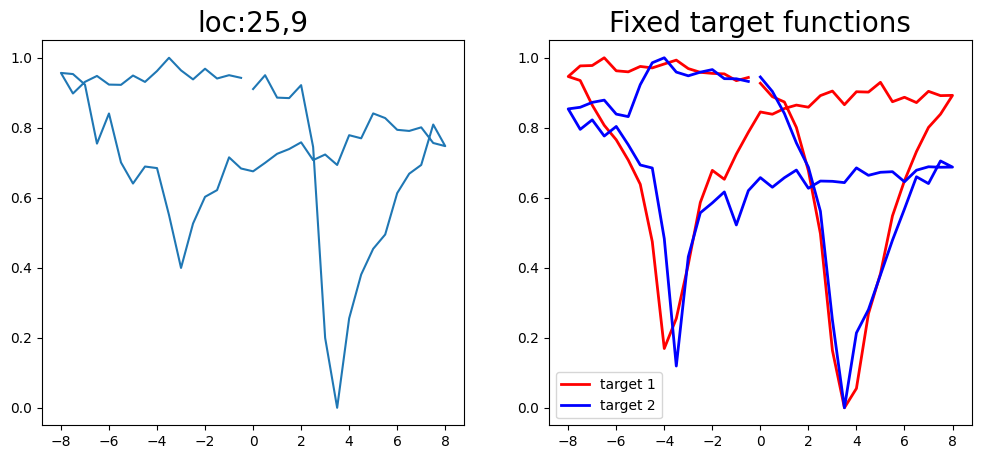

Epoch 1/200 ... Training loss: 3.5295
Epoch 10/200 ... Training loss: 2.9139
Epoch 20/200 ... Training loss: 2.3993
Epoch 30/200 ... Training loss: 2.0892
Epoch 40/200 ... Training loss: 1.7526
Epoch 50/200 ... Training loss: 1.5839
Epoch 60/200 ... Training loss: 1.4959
Epoch 70/200 ... Training loss: 1.4474
Epoch 80/200 ... Training loss: 1.3666
Epoch 90/200 ... Training loss: 1.3055
Epoch 100/200 ... Training loss: 1.244
Epoch 110/200 ... Training loss: 1.2665
Epoch 120/200 ... Training loss: 1.1729
Epoch 130/200 ... Training loss: 1.1005
Epoch 140/200 ... Training loss: 1.048
Epoch 150/200 ... Training loss: 1.0334
Epoch 160/200 ... Training loss: 0.9558
Epoch 170/200 ... Training loss: 0.9148
Epoch 180/200 ... Training loss: 0.8702
Epoch 190/200 ... Training loss: 0.8116
Epoch 200/200 ... Training loss: 0.7685
Epoch 1/200 ... Training loss: 2.8584
Epoch 10/200 ... Training loss: 2.5308
Epoch 20/200 ... Training loss: 2.1726
Epoch 30/200 ... Training loss: 2.0333
Epoch 40/200 ... T

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


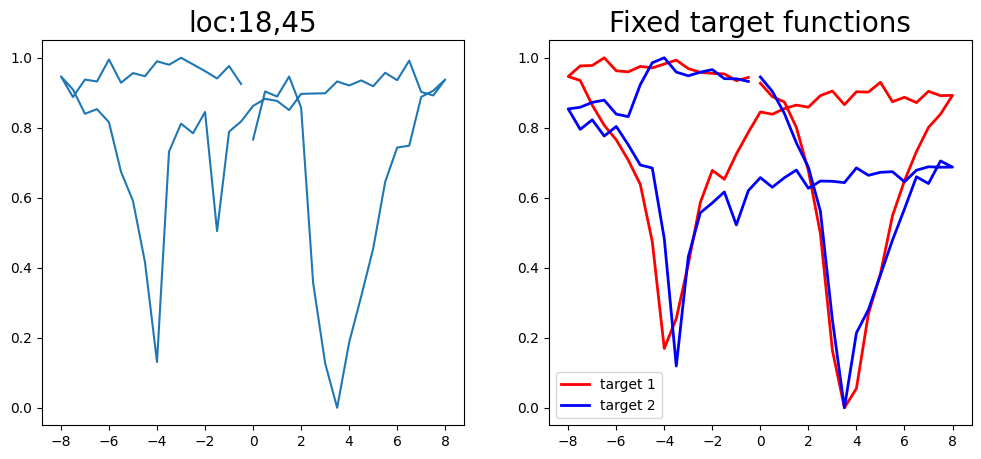

Epoch 1/200 ... Training loss: 3.4828
Epoch 10/200 ... Training loss: 3.1558
Epoch 20/200 ... Training loss: 2.4467
Epoch 30/200 ... Training loss: 2.0269
Epoch 40/200 ... Training loss: 1.7266
Epoch 50/200 ... Training loss: 1.5603
Epoch 60/200 ... Training loss: 1.4834
Epoch 70/200 ... Training loss: 1.4136
Epoch 80/200 ... Training loss: 1.3549
Epoch 90/200 ... Training loss: 1.3067
Epoch 100/200 ... Training loss: 1.2446
Epoch 110/200 ... Training loss: 1.1942
Epoch 120/200 ... Training loss: 1.1595
Epoch 130/200 ... Training loss: 1.1031
Epoch 140/200 ... Training loss: 1.0505
Epoch 150/200 ... Training loss: 1.0026
Epoch 160/200 ... Training loss: 0.985
Epoch 170/200 ... Training loss: 0.9507
Epoch 180/200 ... Training loss: 0.8743
Epoch 190/200 ... Training loss: 0.8233
Epoch 200/200 ... Training loss: 0.8241
Epoch 1/200 ... Training loss: 2.809
Epoch 10/200 ... Training loss: 2.4884
Epoch 20/200 ... Training loss: 2.2996
Epoch 30/200 ... Training loss: 1.8389
Epoch 40/200 ... T

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


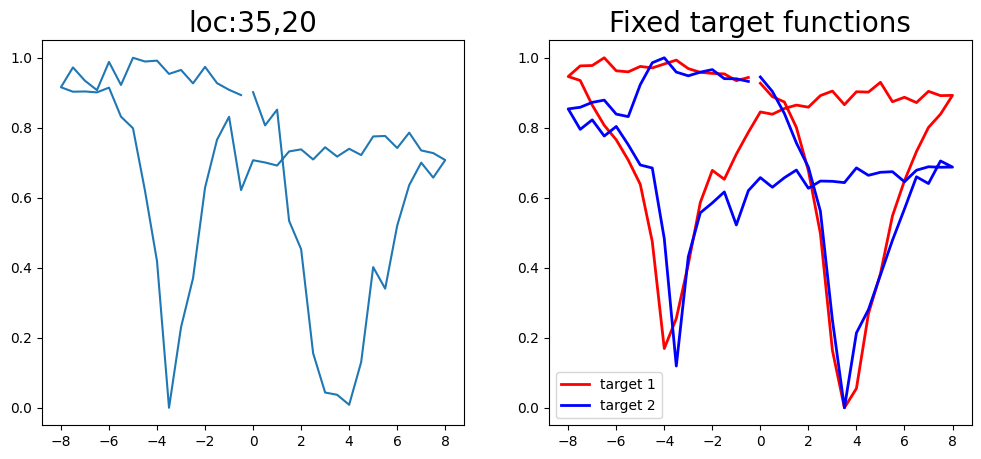

Epoch 1/200 ... Training loss: 3.4234
Epoch 10/200 ... Training loss: 3.4221
Epoch 20/200 ... Training loss: 2.4667
Epoch 30/200 ... Training loss: 2.2767
Epoch 40/200 ... Training loss: 1.8992
Epoch 50/200 ... Training loss: 1.6381
Epoch 60/200 ... Training loss: 1.5354
Epoch 70/200 ... Training loss: 1.4272
Epoch 80/200 ... Training loss: 1.3685
Epoch 90/200 ... Training loss: 1.3148
Epoch 100/200 ... Training loss: 1.2728
Epoch 110/200 ... Training loss: 1.2138
Epoch 120/200 ... Training loss: 1.1767
Epoch 130/200 ... Training loss: 1.1693
Epoch 140/200 ... Training loss: 1.1083
Epoch 150/200 ... Training loss: 1.0485
Epoch 160/200 ... Training loss: 1.0139
Epoch 170/200 ... Training loss: 0.9692
Epoch 180/200 ... Training loss: 0.9186
Epoch 190/200 ... Training loss: 0.8954
Epoch 200/200 ... Training loss: 0.8346
Epoch 1/200 ... Training loss: 2.7751
Epoch 10/200 ... Training loss: 2.4146
Epoch 20/200 ... Training loss: 2.3101
Epoch 30/200 ... Training loss: 1.8292
Epoch 40/200 ...

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


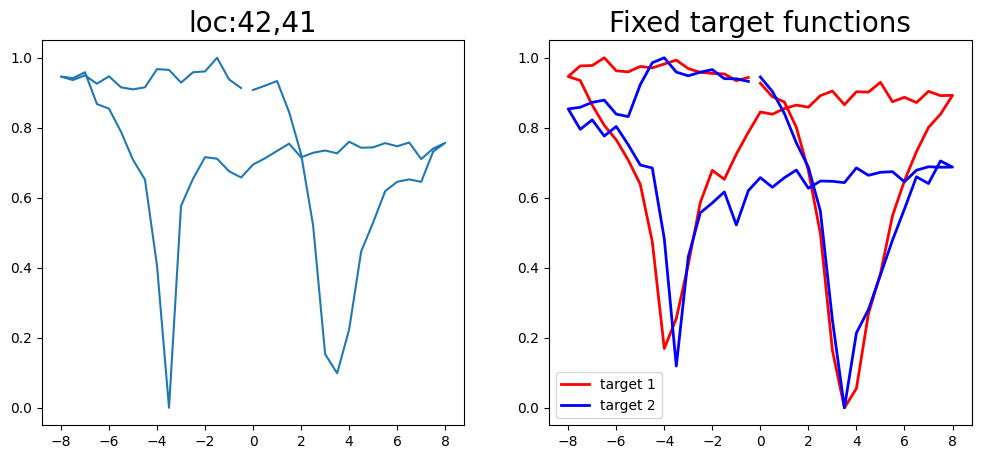

Epoch 1/200 ... Training loss: 3.4016
Epoch 10/200 ... Training loss: 2.6939
Epoch 20/200 ... Training loss: 2.105
Epoch 30/200 ... Training loss: 1.818
Epoch 40/200 ... Training loss: 1.6167
Epoch 50/200 ... Training loss: 1.5046
Epoch 60/200 ... Training loss: 1.465
Epoch 70/200 ... Training loss: 1.3558
Epoch 80/200 ... Training loss: 1.2905
Epoch 90/200 ... Training loss: 1.221
Epoch 100/200 ... Training loss: 1.1579
Epoch 110/200 ... Training loss: 1.1782
Epoch 120/200 ... Training loss: 1.0587
Epoch 130/200 ... Training loss: 1.003
Epoch 140/200 ... Training loss: 0.9403
Epoch 150/200 ... Training loss: 0.9198
Epoch 160/200 ... Training loss: 0.9177
Epoch 170/200 ... Training loss: 0.8181
Epoch 180/200 ... Training loss: 0.7715
Epoch 190/200 ... Training loss: 0.7232
Epoch 200/200 ... Training loss: 0.6363
Epoch 1/200 ... Training loss: 2.8199
Epoch 10/200 ... Training loss: 2.4891
Epoch 20/200 ... Training loss: 2.4961
Epoch 30/200 ... Training loss: 2.2241
Epoch 40/200 ... Trai

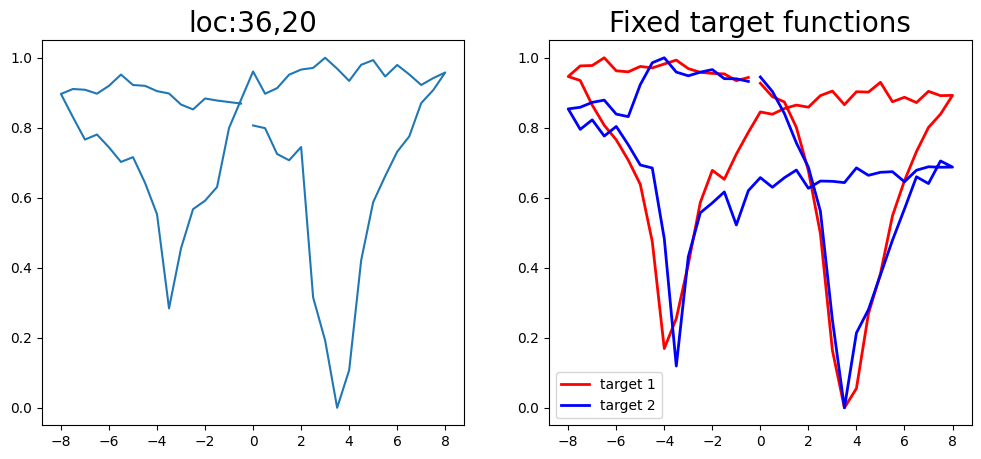

Epoch 1/200 ... Training loss: 3.405
Epoch 10/200 ... Training loss: 2.9071
Epoch 20/200 ... Training loss: 2.188
Epoch 30/200 ... Training loss: 1.798
Epoch 40/200 ... Training loss: 1.684
Epoch 50/200 ... Training loss: 1.6403
Epoch 60/200 ... Training loss: 1.5059
Epoch 70/200 ... Training loss: 1.4078
Epoch 80/200 ... Training loss: 1.3327
Epoch 90/200 ... Training loss: 1.2645
Epoch 100/200 ... Training loss: 1.2815
Epoch 110/200 ... Training loss: 1.2006
Epoch 120/200 ... Training loss: 1.1322
Epoch 130/200 ... Training loss: 1.065
Epoch 140/200 ... Training loss: 1.1724
Epoch 150/200 ... Training loss: 0.9968
Epoch 160/200 ... Training loss: 0.9243
Epoch 170/200 ... Training loss: 0.8884
Epoch 180/200 ... Training loss: 0.8876
Epoch 190/200 ... Training loss: 0.785
Epoch 200/200 ... Training loss: 0.723
Epoch 1/200 ... Training loss: 2.7771
Epoch 10/200 ... Training loss: 2.4948
Epoch 20/200 ... Training loss: 2.1675
Epoch 30/200 ... Training loss: 1.8988
Epoch 40/200 ... Traini

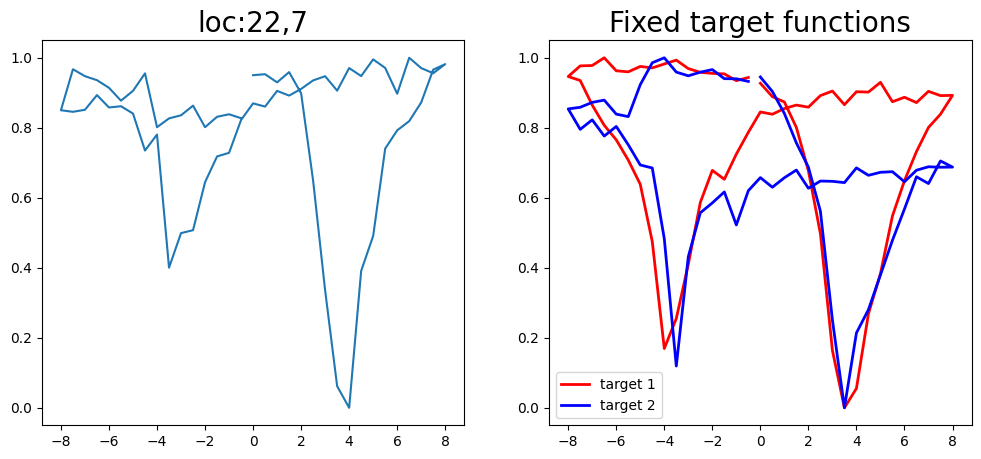

Epoch 1/200 ... Training loss: 3.3587
Epoch 10/200 ... Training loss: 3.1502
Epoch 20/200 ... Training loss: 2.289
Epoch 30/200 ... Training loss: 1.9694
Epoch 40/200 ... Training loss: 1.673
Epoch 50/200 ... Training loss: 1.5331
Epoch 60/200 ... Training loss: 1.4531
Epoch 70/200 ... Training loss: 1.3884
Epoch 80/200 ... Training loss: 1.3304
Epoch 90/200 ... Training loss: 1.2759
Epoch 100/200 ... Training loss: 1.2373
Epoch 110/200 ... Training loss: 1.2106
Epoch 120/200 ... Training loss: 1.1487
Epoch 130/200 ... Training loss: 1.087
Epoch 140/200 ... Training loss: 1.0305
Epoch 150/200 ... Training loss: 0.9828
Epoch 160/200 ... Training loss: 0.9419
Epoch 170/200 ... Training loss: 0.8966
Epoch 180/200 ... Training loss: 0.8483
Epoch 190/200 ... Training loss: 0.838
Epoch 200/200 ... Training loss: 0.7879
Epoch 1/200 ... Training loss: 2.7472
Epoch 10/200 ... Training loss: 2.4097
Epoch 20/200 ... Training loss: 2.011
Epoch 30/200 ... Training loss: 1.7424
Epoch 40/200 ... Trai

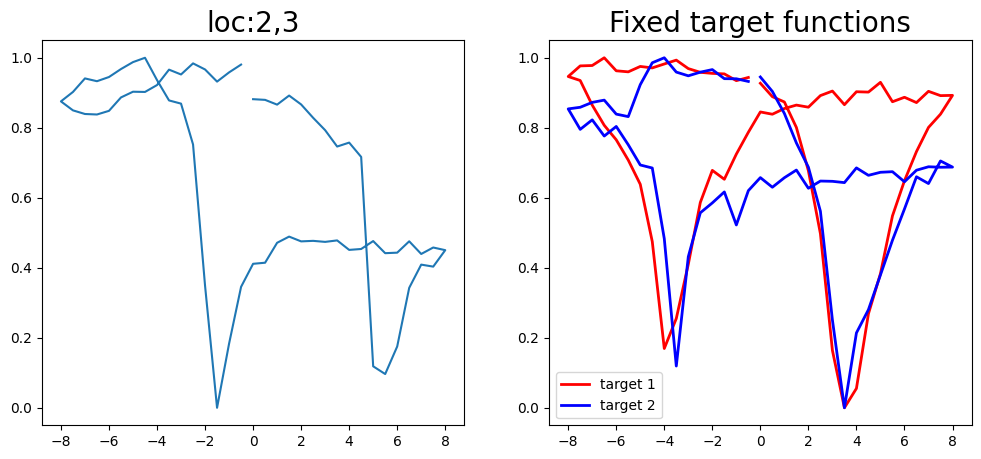

Epoch 1/200 ... Training loss: 3.5413
Epoch 10/200 ... Training loss: 2.6098
Epoch 20/200 ... Training loss: 2.1392
Epoch 30/200 ... Training loss: 1.9758
Epoch 40/200 ... Training loss: 1.6999
Epoch 50/200 ... Training loss: 1.5135
Epoch 60/200 ... Training loss: 1.4309
Epoch 70/200 ... Training loss: 1.3635
Epoch 80/200 ... Training loss: 1.2994
Epoch 90/200 ... Training loss: 1.2444
Epoch 100/200 ... Training loss: 1.1935
Epoch 110/200 ... Training loss: 1.1584
Epoch 120/200 ... Training loss: 1.0788
Epoch 130/200 ... Training loss: 1.0339
Epoch 140/200 ... Training loss: 1.0069
Epoch 150/200 ... Training loss: 1.0056
Epoch 160/200 ... Training loss: 0.9137
Epoch 170/200 ... Training loss: 0.8481
Epoch 180/200 ... Training loss: 0.7971
Epoch 190/200 ... Training loss: 0.7611
Epoch 200/200 ... Training loss: 0.9079
Epoch 1/200 ... Training loss: 2.8404
Epoch 10/200 ... Training loss: 2.2817
Epoch 20/200 ... Training loss: 2.0381
Epoch 30/200 ... Training loss: 1.7332
Epoch 40/200 ...

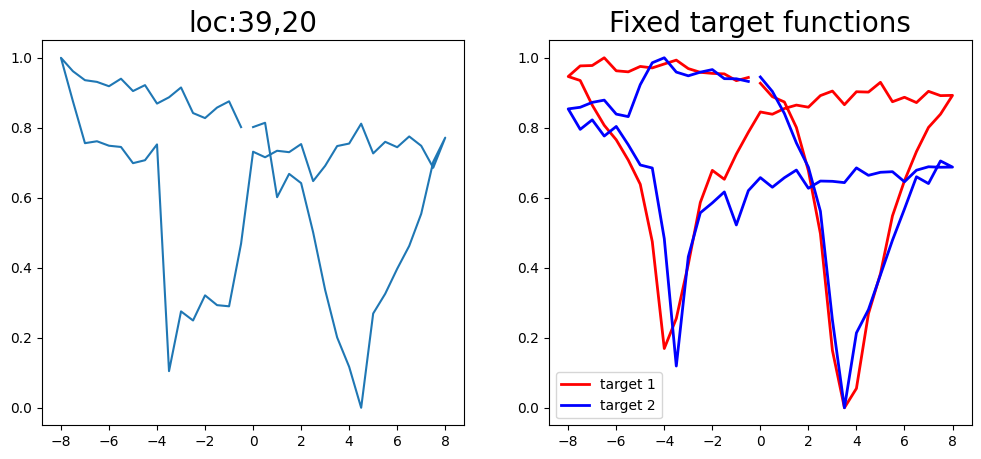

Epoch 1/200 ... Training loss: 3.4922
Epoch 10/200 ... Training loss: 2.4614
Epoch 20/200 ... Training loss: 2.4848
Epoch 30/200 ... Training loss: 1.9688
Epoch 40/200 ... Training loss: 1.6756
Epoch 50/200 ... Training loss: 1.5397
Epoch 60/200 ... Training loss: 1.4441
Epoch 70/200 ... Training loss: 1.3741
Epoch 80/200 ... Training loss: 1.3138
Epoch 90/200 ... Training loss: 1.2861
Epoch 100/200 ... Training loss: 1.2178
Epoch 110/200 ... Training loss: 1.1593
Epoch 120/200 ... Training loss: 1.1109
Epoch 130/200 ... Training loss: 1.0845
Epoch 140/200 ... Training loss: 1.0221
Epoch 150/200 ... Training loss: 0.9694
Epoch 160/200 ... Training loss: 0.9219
Epoch 170/200 ... Training loss: 0.9085
Epoch 180/200 ... Training loss: 0.8516
Epoch 190/200 ... Training loss: 0.7964
Epoch 200/200 ... Training loss: 0.7483
Epoch 1/200 ... Training loss: 2.8019
Epoch 10/200 ... Training loss: 2.252
Epoch 20/200 ... Training loss: 1.9435
Epoch 30/200 ... Training loss: 1.6792
Epoch 40/200 ... 

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


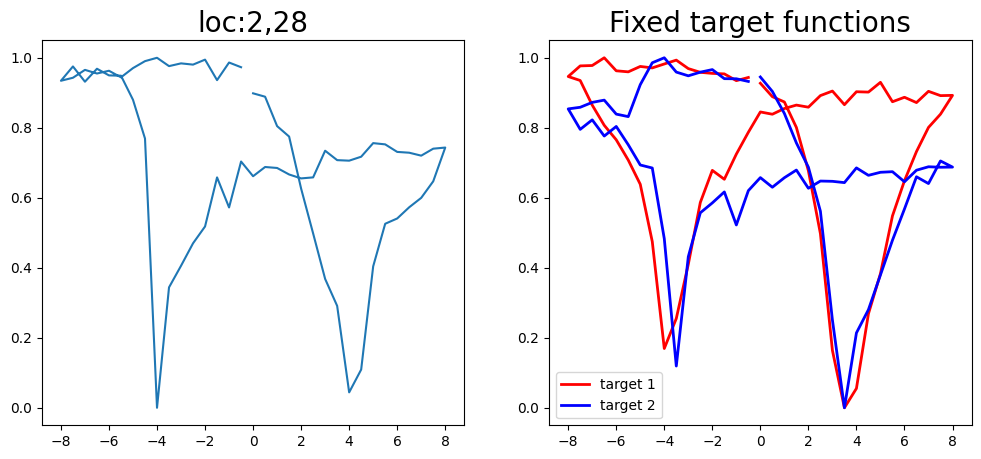

Epoch 1/200 ... Training loss: 3.4647
Epoch 10/200 ... Training loss: 2.5006
Epoch 20/200 ... Training loss: 2.2487
Epoch 30/200 ... Training loss: 1.8433
Epoch 40/200 ... Training loss: 1.6051
Epoch 50/200 ... Training loss: 1.5185
Epoch 60/200 ... Training loss: 1.4094
Epoch 70/200 ... Training loss: 1.3598
Epoch 80/200 ... Training loss: 1.2932
Epoch 90/200 ... Training loss: 1.2303
Epoch 100/200 ... Training loss: 1.1672
Epoch 110/200 ... Training loss: 1.1686
Epoch 120/200 ... Training loss: 1.1016
Epoch 130/200 ... Training loss: 1.0885
Epoch 140/200 ... Training loss: 0.9799
Epoch 150/200 ... Training loss: 0.9283
Epoch 160/200 ... Training loss: 0.8966
Epoch 170/200 ... Training loss: 0.8301
Epoch 180/200 ... Training loss: 0.8608
Epoch 190/200 ... Training loss: 0.7839
Epoch 200/200 ... Training loss: 0.7114
Epoch 1/200 ... Training loss: 2.7786
Epoch 10/200 ... Training loss: 2.6059
Epoch 20/200 ... Training loss: 2.1045
Epoch 30/200 ... Training loss: 1.8342
Epoch 40/200 ...

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(
C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(
C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(
C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. T

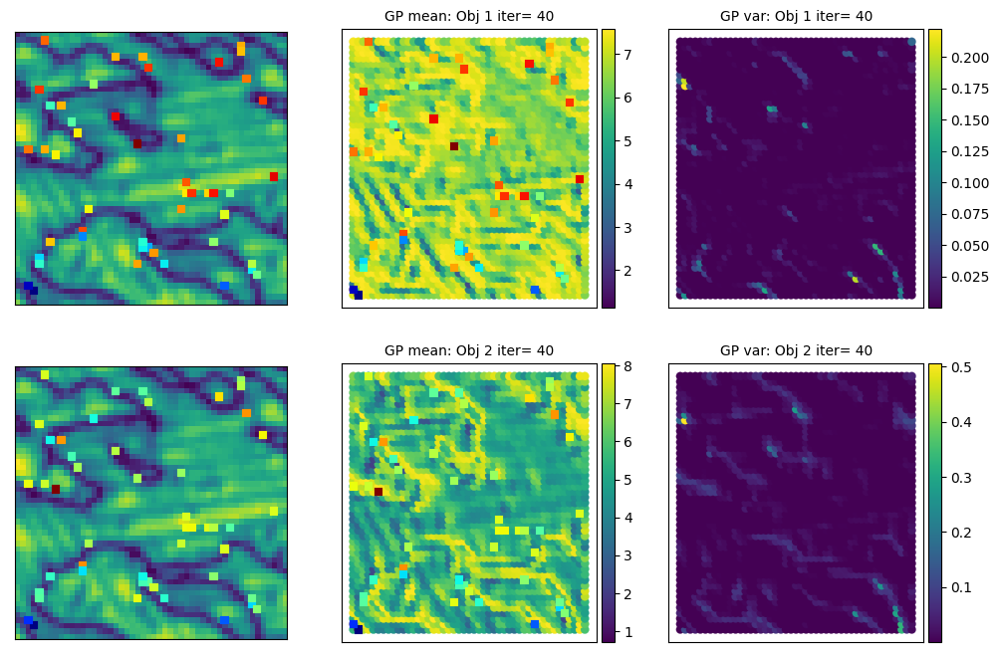

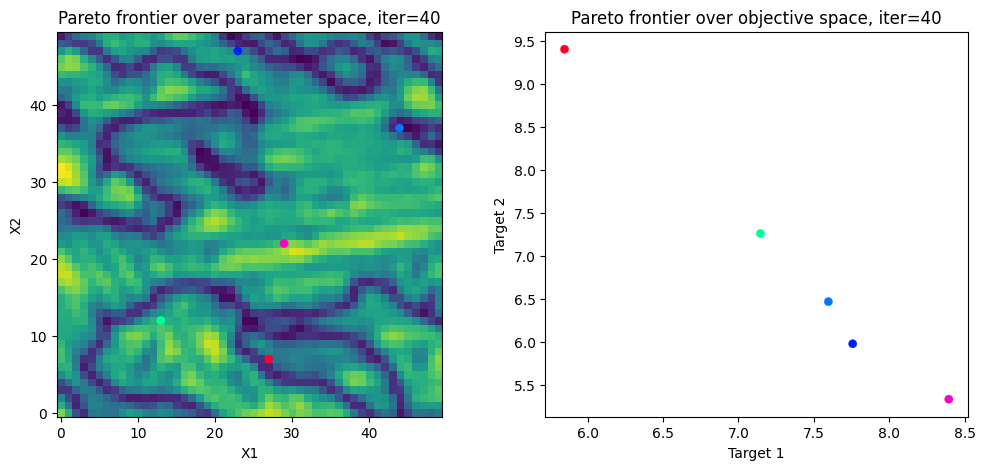

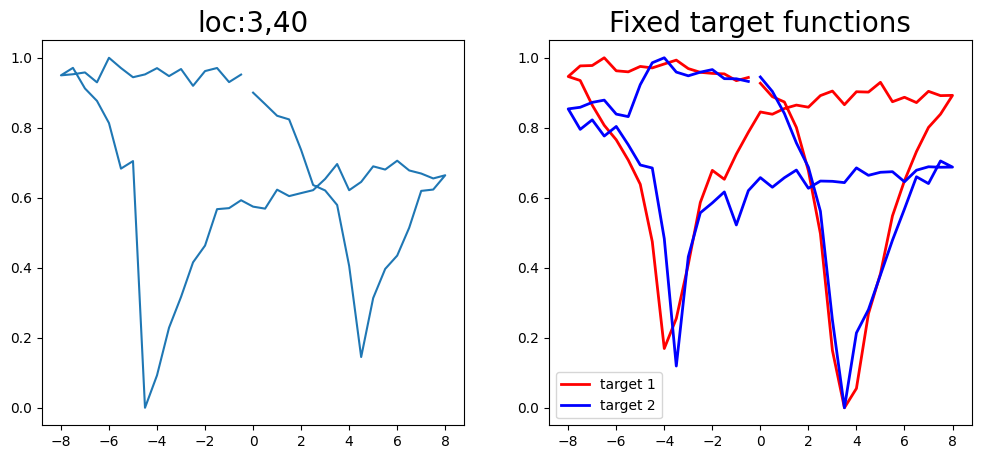

Epoch 1/200 ... Training loss: 3.4107
Epoch 10/200 ... Training loss: 2.6451
Epoch 20/200 ... Training loss: 2.2345
Epoch 30/200 ... Training loss: 1.9109
Epoch 40/200 ... Training loss: 1.6193
Epoch 50/200 ... Training loss: 1.4967
Epoch 60/200 ... Training loss: 1.4306
Epoch 70/200 ... Training loss: 1.3536
Epoch 80/200 ... Training loss: 1.291
Epoch 90/200 ... Training loss: 1.2303
Epoch 100/200 ... Training loss: 1.1715
Epoch 110/200 ... Training loss: 1.1834
Epoch 120/200 ... Training loss: 1.1322
Epoch 130/200 ... Training loss: 1.0424
Epoch 140/200 ... Training loss: 0.9885
Epoch 150/200 ... Training loss: 1.0059
Epoch 160/200 ... Training loss: 0.9209
Epoch 170/200 ... Training loss: 0.8614
Epoch 180/200 ... Training loss: 0.803
Epoch 190/200 ... Training loss: 0.8459
Epoch 200/200 ... Training loss: 0.7519
Epoch 1/200 ... Training loss: 2.7581
Epoch 10/200 ... Training loss: 2.5637
Epoch 20/200 ... Training loss: 2.0531
Epoch 30/200 ... Training loss: 1.778
Epoch 40/200 ... Tr

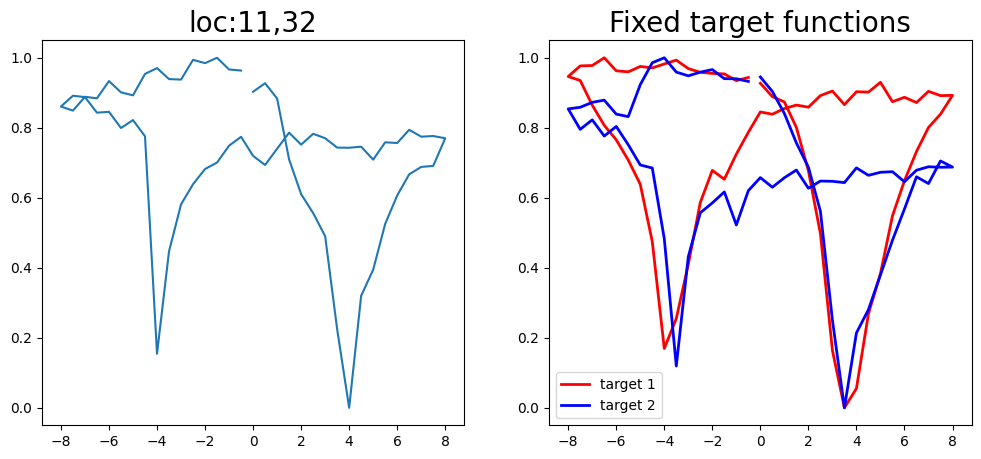

Epoch 1/200 ... Training loss: 3.3585
Epoch 10/200 ... Training loss: 3.2009
Epoch 20/200 ... Training loss: 2.7022
Epoch 30/200 ... Training loss: 2.2311
Epoch 40/200 ... Training loss: 1.9707
Epoch 50/200 ... Training loss: 1.6761
Epoch 60/200 ... Training loss: 1.4809
Epoch 70/200 ... Training loss: 1.4079
Epoch 80/200 ... Training loss: 1.3981
Epoch 90/200 ... Training loss: 1.3014
Epoch 100/200 ... Training loss: 1.2441
Epoch 110/200 ... Training loss: 1.196
Epoch 120/200 ... Training loss: 1.1731
Epoch 130/200 ... Training loss: 1.1289
Epoch 140/200 ... Training loss: 1.0786
Epoch 150/200 ... Training loss: 1.0738
Epoch 160/200 ... Training loss: 1.0098
Epoch 170/200 ... Training loss: 1.0053
Epoch 180/200 ... Training loss: 0.9315
Epoch 190/200 ... Training loss: 0.8928
Epoch 200/200 ... Training loss: 0.8643
Epoch 1/200 ... Training loss: 2.7266
Epoch 10/200 ... Training loss: 2.4673
Epoch 20/200 ... Training loss: 2.1435
Epoch 30/200 ... Training loss: 1.8875
Epoch 40/200 ... 

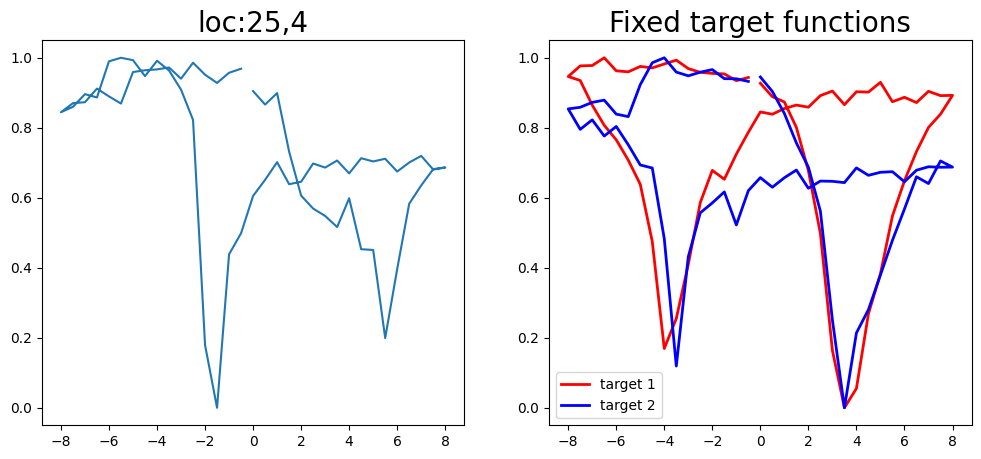

Epoch 1/200 ... Training loss: 3.4017
Epoch 10/200 ... Training loss: 3.2204
Epoch 20/200 ... Training loss: 2.3929
Epoch 30/200 ... Training loss: 2.043
Epoch 40/200 ... Training loss: 1.7201
Epoch 50/200 ... Training loss: 1.557
Epoch 60/200 ... Training loss: 1.4507
Epoch 70/200 ... Training loss: 1.3583
Epoch 80/200 ... Training loss: 1.2894
Epoch 90/200 ... Training loss: 1.2423
Epoch 100/200 ... Training loss: 1.1922
Epoch 110/200 ... Training loss: 1.1498
Epoch 120/200 ... Training loss: 1.1306
Epoch 130/200 ... Training loss: 1.0667
Epoch 140/200 ... Training loss: 1.0262
Epoch 150/200 ... Training loss: 0.9874
Epoch 160/200 ... Training loss: 1.0342
Epoch 170/200 ... Training loss: 0.9454
Epoch 180/200 ... Training loss: 0.8915
Epoch 190/200 ... Training loss: 0.8475
Epoch 200/200 ... Training loss: 0.9079
Epoch 1/200 ... Training loss: 2.7226
Epoch 10/200 ... Training loss: 2.2566
Epoch 20/200 ... Training loss: 2.0475
Epoch 30/200 ... Training loss: 1.6998
Epoch 40/200 ... T

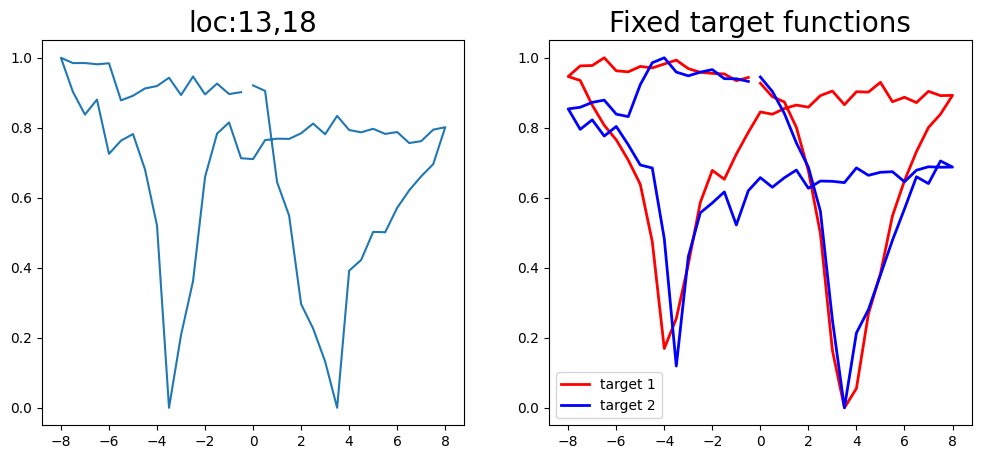

Epoch 1/200 ... Training loss: 3.3644
Epoch 10/200 ... Training loss: 3.1741
Epoch 20/200 ... Training loss: 2.4619
Epoch 30/200 ... Training loss: 2.1298
Epoch 40/200 ... Training loss: 1.8061
Epoch 50/200 ... Training loss: 1.5737
Epoch 60/200 ... Training loss: 1.4641
Epoch 70/200 ... Training loss: 1.3636
Epoch 80/200 ... Training loss: 1.3199
Epoch 90/200 ... Training loss: 1.2603
Epoch 100/200 ... Training loss: 1.2052
Epoch 110/200 ... Training loss: 1.1873
Epoch 120/200 ... Training loss: 1.1236
Epoch 130/200 ... Training loss: 1.101
Epoch 140/200 ... Training loss: 1.054
Epoch 150/200 ... Training loss: 1.0126
Epoch 160/200 ... Training loss: 0.9871
Epoch 170/200 ... Training loss: 0.9495
Epoch 180/200 ... Training loss: 0.8951
Epoch 190/200 ... Training loss: 0.8656
Epoch 200/200 ... Training loss: 0.8189
Epoch 1/200 ... Training loss: 2.6855
Epoch 10/200 ... Training loss: 2.2099
Epoch 20/200 ... Training loss: 2.0082
Epoch 30/200 ... Training loss: 1.6677
Epoch 40/200 ... T

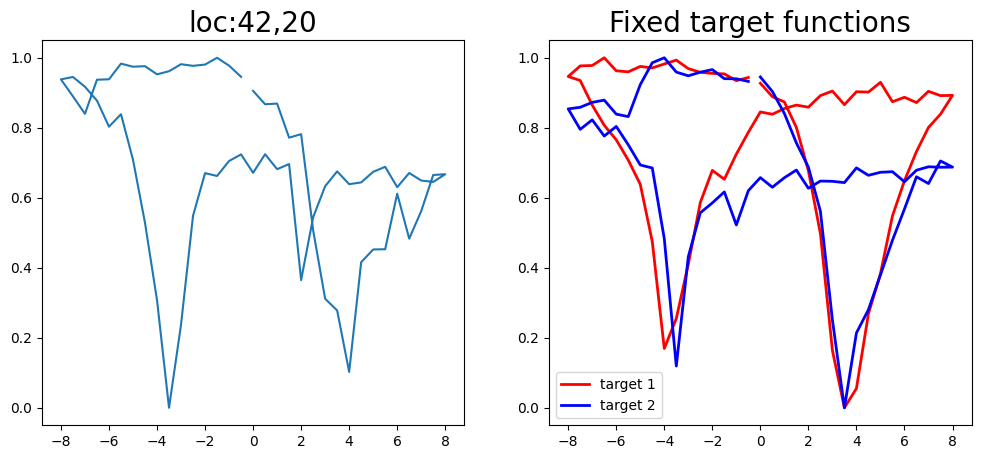

Epoch 1/200 ... Training loss: 3.3168
Epoch 10/200 ... Training loss: 3.1469
Epoch 20/200 ... Training loss: 2.3974
Epoch 30/200 ... Training loss: 2.0477
Epoch 40/200 ... Training loss: 1.7517
Epoch 50/200 ... Training loss: 1.5118
Epoch 60/200 ... Training loss: 1.386
Epoch 70/200 ... Training loss: 1.3383
Epoch 80/200 ... Training loss: 1.2779
Epoch 90/200 ... Training loss: 1.2261
Epoch 100/200 ... Training loss: 1.1975
Epoch 110/200 ... Training loss: 1.1615
Epoch 120/200 ... Training loss: 1.1236
Epoch 130/200 ... Training loss: 1.0653
Epoch 140/200 ... Training loss: 1.0182
Epoch 150/200 ... Training loss: 1.1077
Epoch 160/200 ... Training loss: 0.9842
Epoch 170/200 ... Training loss: 0.9353
Epoch 180/200 ... Training loss: 0.8785
Epoch 190/200 ... Training loss: 0.8495
Epoch 200/200 ... Training loss: 0.804
Epoch 1/200 ... Training loss: 2.6499
Epoch 10/200 ... Training loss: 2.1481
Epoch 20/200 ... Training loss: 1.9589
Epoch 30/200 ... Training loss: 1.6488
Epoch 40/200 ... T

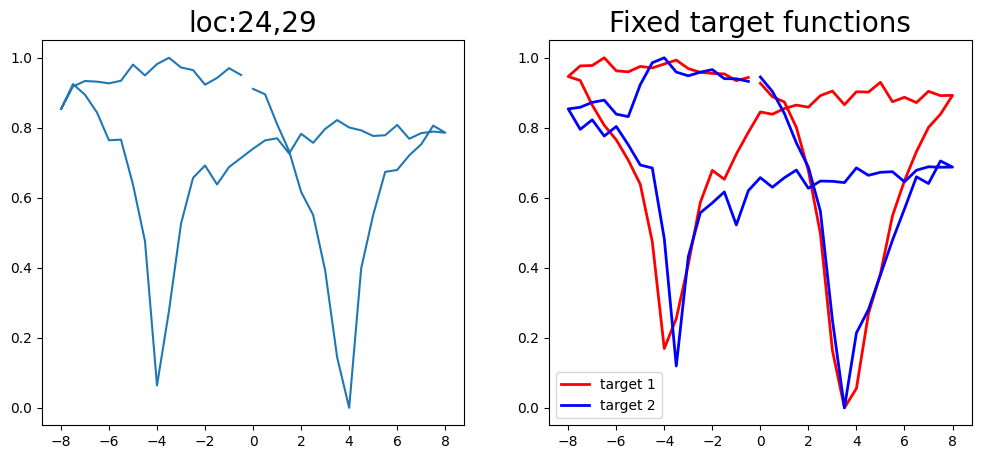

Epoch 1/200 ... Training loss: 3.3242
Epoch 10/200 ... Training loss: 3.0263
Epoch 20/200 ... Training loss: 2.5776
Epoch 30/200 ... Training loss: 1.9477
Epoch 40/200 ... Training loss: 1.6824
Epoch 50/200 ... Training loss: 1.5979
Epoch 60/200 ... Training loss: 2.0447
Epoch 70/200 ... Training loss: 1.7634
Epoch 80/200 ... Training loss: 1.4421
Epoch 90/200 ... Training loss: 1.332
Epoch 100/200 ... Training loss: 1.313
Epoch 110/200 ... Training loss: 1.347
Epoch 120/200 ... Training loss: 1.2503
Epoch 130/200 ... Training loss: 1.1683
Epoch 140/200 ... Training loss: 1.1222
Epoch 150/200 ... Training loss: 1.079
Epoch 160/200 ... Training loss: 1.0391
Epoch 170/200 ... Training loss: 0.9984
Epoch 180/200 ... Training loss: 0.9572
Epoch 190/200 ... Training loss: 0.9185
Epoch 200/200 ... Training loss: 0.8678
Epoch 1/200 ... Training loss: 2.6303
Epoch 10/200 ... Training loss: 2.219
Epoch 20/200 ... Training loss: 2.0636
Epoch 30/200 ... Training loss: 1.72
Epoch 40/200 ... Traini

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(
C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


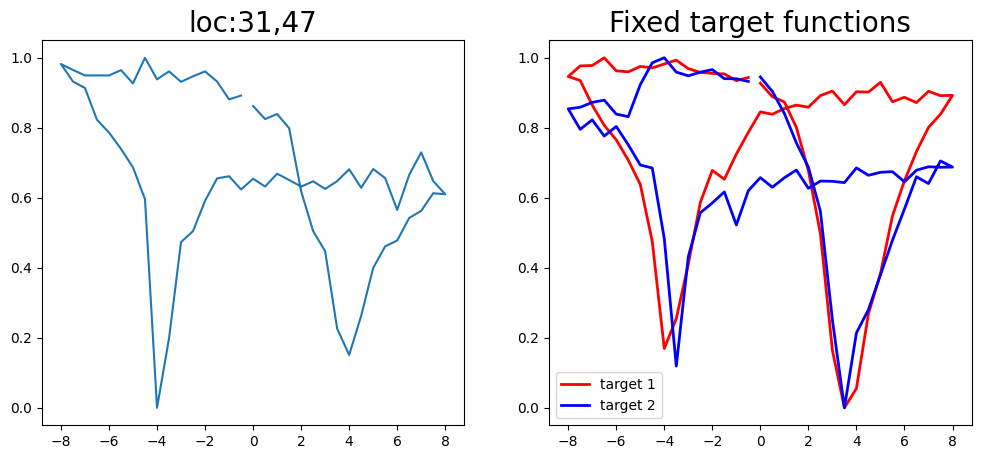

Epoch 1/200 ... Training loss: 3.2986
Epoch 10/200 ... Training loss: 2.4629
Epoch 20/200 ... Training loss: 2.0874
Epoch 30/200 ... Training loss: 1.6716
Epoch 40/200 ... Training loss: 1.4999
Epoch 50/200 ... Training loss: 1.4158
Epoch 60/200 ... Training loss: 1.3532
Epoch 70/200 ... Training loss: 1.2907
Epoch 80/200 ... Training loss: 1.2211
Epoch 90/200 ... Training loss: 1.1756
Epoch 100/200 ... Training loss: 1.129
Epoch 110/200 ... Training loss: 1.0776
Epoch 120/200 ... Training loss: 1.0102
Epoch 130/200 ... Training loss: 1.2358
Epoch 140/200 ... Training loss: 0.9911
Epoch 150/200 ... Training loss: 0.9134
Epoch 160/200 ... Training loss: 0.84
Epoch 170/200 ... Training loss: 0.8044
Epoch 180/200 ... Training loss: 0.7985
Epoch 190/200 ... Training loss: 0.7398
Epoch 200/200 ... Training loss: 0.6627
Epoch 1/200 ... Training loss: 2.6298
Epoch 10/200 ... Training loss: 2.1338
Epoch 20/200 ... Training loss: 1.9024
Epoch 30/200 ... Training loss: 1.6067
Epoch 40/200 ... Tr

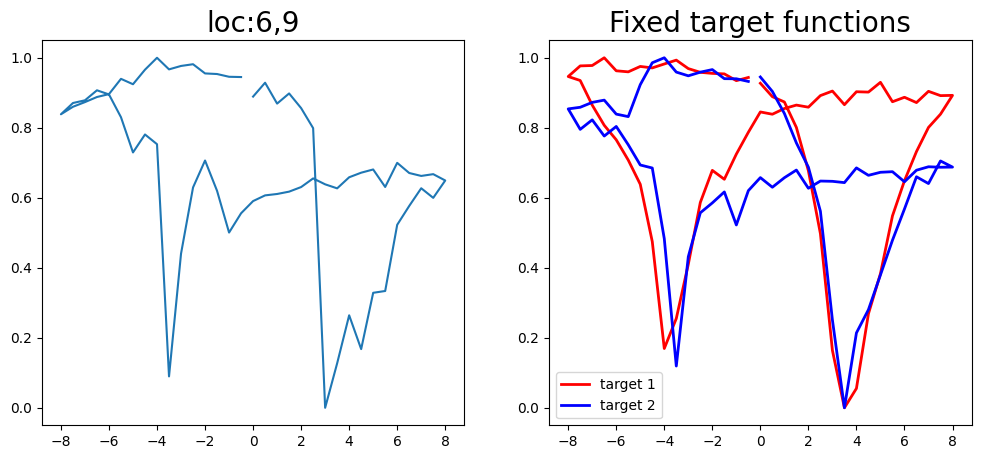

Epoch 1/200 ... Training loss: 3.2559
Epoch 10/200 ... Training loss: 2.3664
Epoch 20/200 ... Training loss: 2.0697
Epoch 30/200 ... Training loss: 1.6103
Epoch 40/200 ... Training loss: 1.5585
Epoch 50/200 ... Training loss: 1.4212
Epoch 60/200 ... Training loss: 1.3411
Epoch 70/200 ... Training loss: 1.2727
Epoch 80/200 ... Training loss: 1.2183
Epoch 90/200 ... Training loss: 1.1654
Epoch 100/200 ... Training loss: 1.1202
Epoch 110/200 ... Training loss: 1.1488
Epoch 120/200 ... Training loss: 1.0771
Epoch 130/200 ... Training loss: 0.9835
Epoch 140/200 ... Training loss: 0.9218
Epoch 150/200 ... Training loss: 0.8856
Epoch 160/200 ... Training loss: 0.8194
Epoch 170/200 ... Training loss: 0.762
Epoch 180/200 ... Training loss: 0.7086
Epoch 190/200 ... Training loss: 0.7134
Epoch 200/200 ... Training loss: 0.7309
Epoch 1/200 ... Training loss: 2.6235
Epoch 10/200 ... Training loss: 2.312
Epoch 20/200 ... Training loss: 2.0365
Epoch 30/200 ... Training loss: 1.8367
Epoch 40/200 ... T

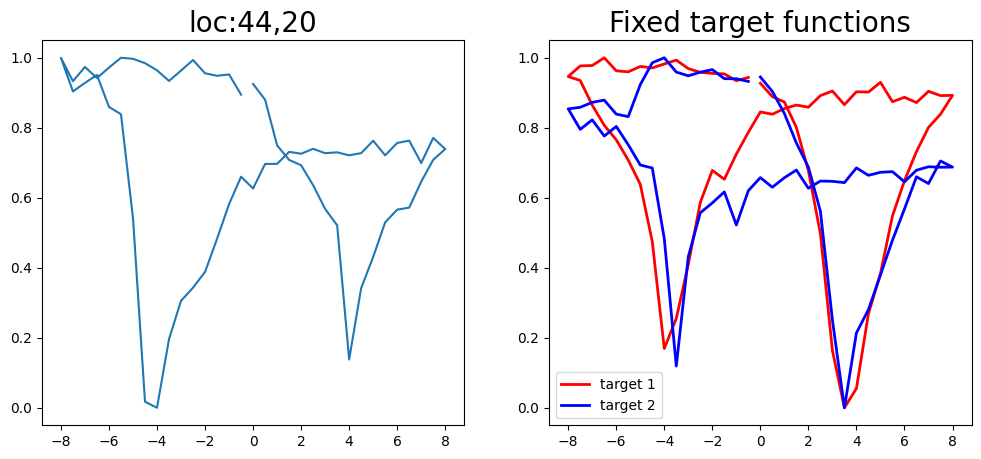

Epoch 1/200 ... Training loss: 3.2162
Epoch 10/200 ... Training loss: 2.656
Epoch 20/200 ... Training loss: 2.1245
Epoch 30/200 ... Training loss: 1.7357
Epoch 40/200 ... Training loss: 1.5268
Epoch 50/200 ... Training loss: 1.4083
Epoch 60/200 ... Training loss: 1.3243
Epoch 70/200 ... Training loss: 1.2646
Epoch 80/200 ... Training loss: 1.2094
Epoch 90/200 ... Training loss: 1.1935
Epoch 100/200 ... Training loss: 1.1163
Epoch 110/200 ... Training loss: 1.0616
Epoch 120/200 ... Training loss: 1.0144
Epoch 130/200 ... Training loss: 0.9932
Epoch 140/200 ... Training loss: 0.9344
Epoch 150/200 ... Training loss: 0.8719
Epoch 160/200 ... Training loss: 1.1086
Epoch 170/200 ... Training loss: 0.828
Epoch 180/200 ... Training loss: 0.7638
Epoch 190/200 ... Training loss: 0.7046
Epoch 200/200 ... Training loss: 0.679
Epoch 1/200 ... Training loss: 2.5925
Epoch 10/200 ... Training loss: 2.3699
Epoch 20/200 ... Training loss: 1.9849
Epoch 30/200 ... Training loss: 1.7763
Epoch 40/200 ... Tr

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


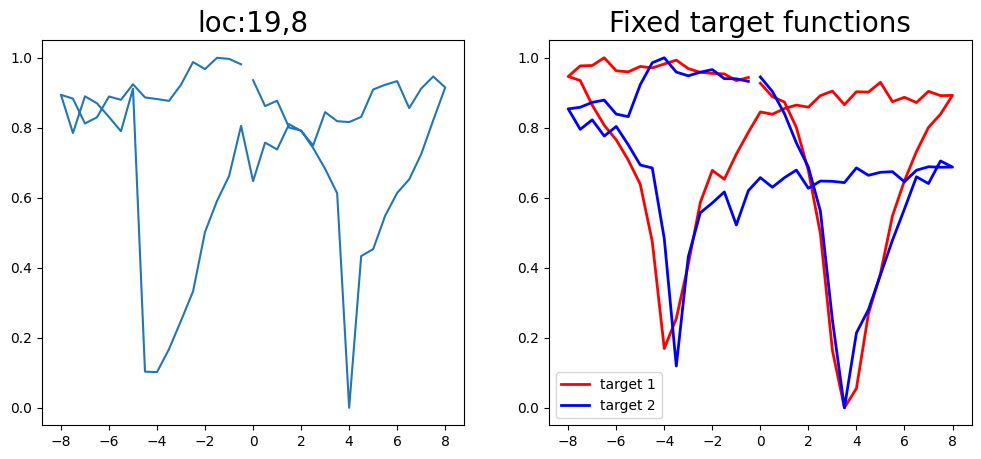

Epoch 1/200 ... Training loss: 3.1858
Epoch 10/200 ... Training loss: 2.5894
Epoch 20/200 ... Training loss: 2.0676
Epoch 30/200 ... Training loss: 1.6692
Epoch 40/200 ... Training loss: 1.5763
Epoch 50/200 ... Training loss: 1.4575
Epoch 60/200 ... Training loss: 1.3719
Epoch 70/200 ... Training loss: 1.2927
Epoch 80/200 ... Training loss: 1.2486
Epoch 90/200 ... Training loss: 1.1745
Epoch 100/200 ... Training loss: 1.11
Epoch 110/200 ... Training loss: 1.0802
Epoch 120/200 ... Training loss: 1.1805
Epoch 130/200 ... Training loss: 1.0387
Epoch 140/200 ... Training loss: 0.9573
Epoch 150/200 ... Training loss: 0.9144
Epoch 160/200 ... Training loss: 0.854
Epoch 170/200 ... Training loss: 0.8379
Epoch 180/200 ... Training loss: 0.7644
Epoch 190/200 ... Training loss: 0.7042
Epoch 200/200 ... Training loss: 0.6533
Epoch 1/200 ... Training loss: 2.5864
Epoch 10/200 ... Training loss: 2.1655
Epoch 20/200 ... Training loss: 2.3211
Epoch 30/200 ... Training loss: 1.796
Epoch 40/200 ... Tra

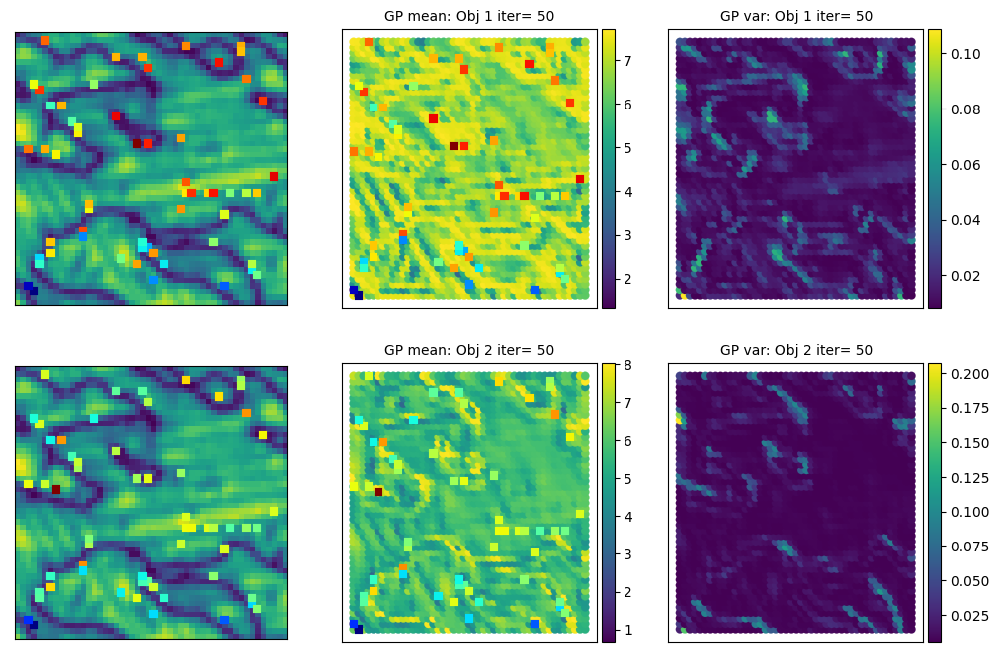

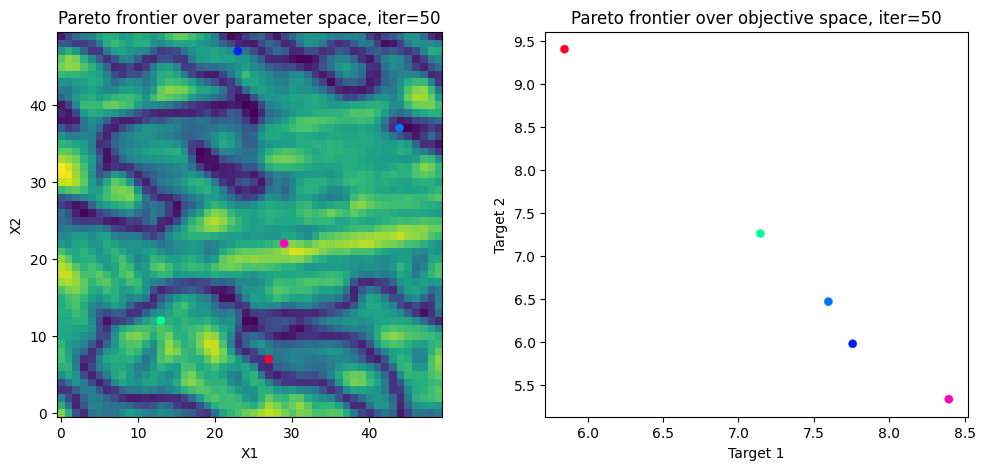

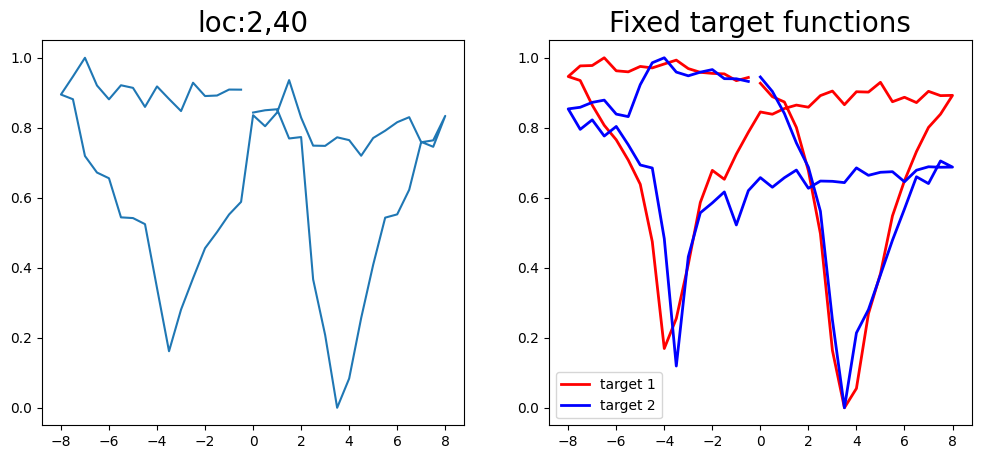

Epoch 1/200 ... Training loss: 3.1474
Epoch 10/200 ... Training loss: 2.3284
Epoch 20/200 ... Training loss: 1.8931
Epoch 30/200 ... Training loss: 1.5707
Epoch 40/200 ... Training loss: 1.5641
Epoch 50/200 ... Training loss: 1.5237
Epoch 60/200 ... Training loss: 1.3307
Epoch 70/200 ... Training loss: 1.254
Epoch 80/200 ... Training loss: 1.1898
Epoch 90/200 ... Training loss: 1.1253
Epoch 100/200 ... Training loss: 1.0659
Epoch 110/200 ... Training loss: 1.0155
Epoch 120/200 ... Training loss: 0.9733
Epoch 130/200 ... Training loss: 0.9195
Epoch 140/200 ... Training loss: 0.8744
Epoch 150/200 ... Training loss: 0.845
Epoch 160/200 ... Training loss: 0.9515
Epoch 170/200 ... Training loss: 0.746
Epoch 180/200 ... Training loss: 0.7073
Epoch 190/200 ... Training loss: 0.6279
Epoch 200/200 ... Training loss: 0.6272
Epoch 1/200 ... Training loss: 2.5568
Epoch 10/200 ... Training loss: 2.204
Epoch 20/200 ... Training loss: 2.5412
Epoch 30/200 ... Training loss: 1.8704
Epoch 40/200 ... Tra

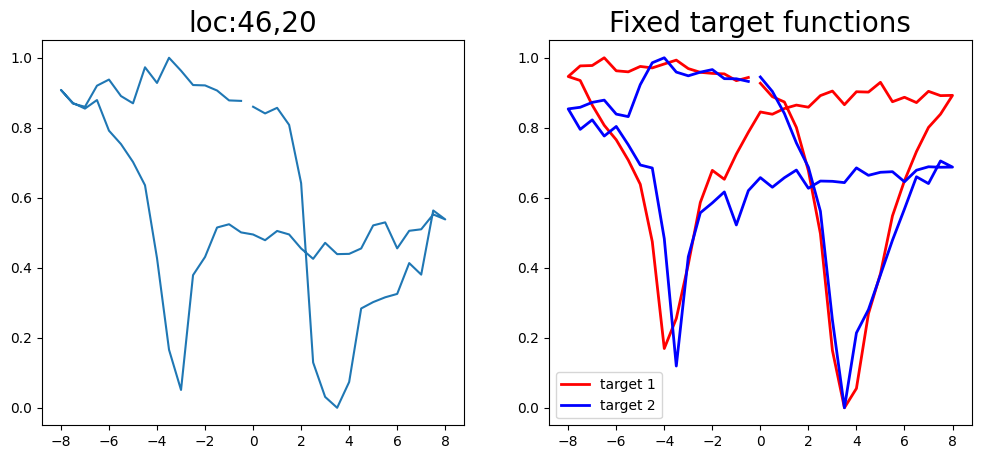

Epoch 1/200 ... Training loss: 3.1096
Epoch 10/200 ... Training loss: 2.4692
Epoch 20/200 ... Training loss: 1.9546
Epoch 30/200 ... Training loss: 1.6055
Epoch 40/200 ... Training loss: 1.5872
Epoch 50/200 ... Training loss: 1.4168
Epoch 60/200 ... Training loss: 1.3148
Epoch 70/200 ... Training loss: 1.2477
Epoch 80/200 ... Training loss: 1.2067
Epoch 90/200 ... Training loss: 1.13
Epoch 100/200 ... Training loss: 1.0855
Epoch 110/200 ... Training loss: 1.028
Epoch 120/200 ... Training loss: 0.98
Epoch 130/200 ... Training loss: 0.9149
Epoch 140/200 ... Training loss: 0.8709
Epoch 150/200 ... Training loss: 0.809
Epoch 160/200 ... Training loss: 0.9289
Epoch 170/200 ... Training loss: 0.7852
Epoch 180/200 ... Training loss: 0.7037
Epoch 190/200 ... Training loss: 0.6242
Epoch 200/200 ... Training loss: 0.6666
Epoch 1/200 ... Training loss: 2.5375
Epoch 10/200 ... Training loss: 2.6379
Epoch 20/200 ... Training loss: 2.4317
Epoch 30/200 ... Training loss: 2.305
Epoch 40/200 ... Traini

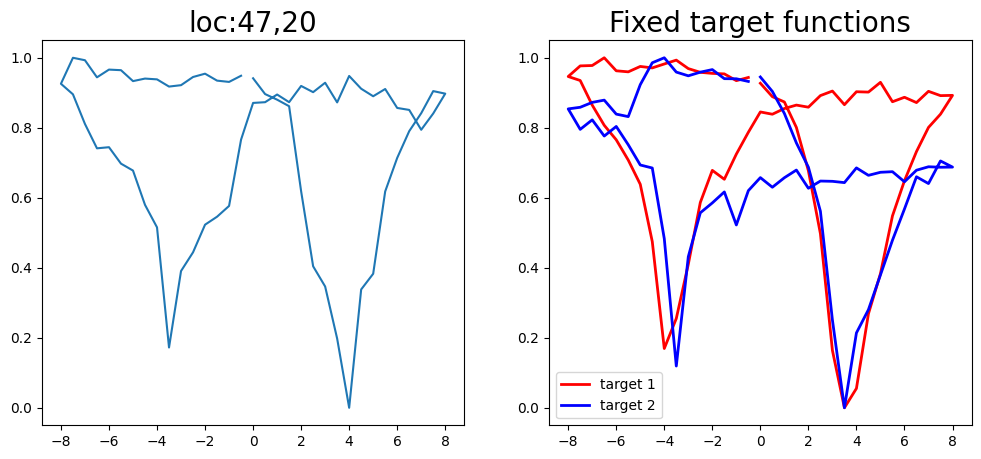

Epoch 1/200 ... Training loss: 3.0899
Epoch 10/200 ... Training loss: 2.1953
Epoch 20/200 ... Training loss: 1.8969
Epoch 30/200 ... Training loss: 1.58
Epoch 40/200 ... Training loss: 1.4849
Epoch 50/200 ... Training loss: 1.3685
Epoch 60/200 ... Training loss: 1.2737
Epoch 70/200 ... Training loss: 1.2019
Epoch 80/200 ... Training loss: 1.1682
Epoch 90/200 ... Training loss: 1.1064
Epoch 100/200 ... Training loss: 1.0372
Epoch 110/200 ... Training loss: 1.0116
Epoch 120/200 ... Training loss: 0.9283
Epoch 130/200 ... Training loss: 0.8658
Epoch 140/200 ... Training loss: 0.8181
Epoch 150/200 ... Training loss: 0.7799
Epoch 160/200 ... Training loss: 0.7117
Epoch 170/200 ... Training loss: 0.7955
Epoch 180/200 ... Training loss: 0.6488
Epoch 190/200 ... Training loss: 0.5848
Epoch 200/200 ... Training loss: 0.5228
Epoch 1/200 ... Training loss: 2.515
Epoch 10/200 ... Training loss: 2.2385
Epoch 20/200 ... Training loss: 1.9643
Epoch 30/200 ... Training loss: 1.936
Epoch 40/200 ... Tra

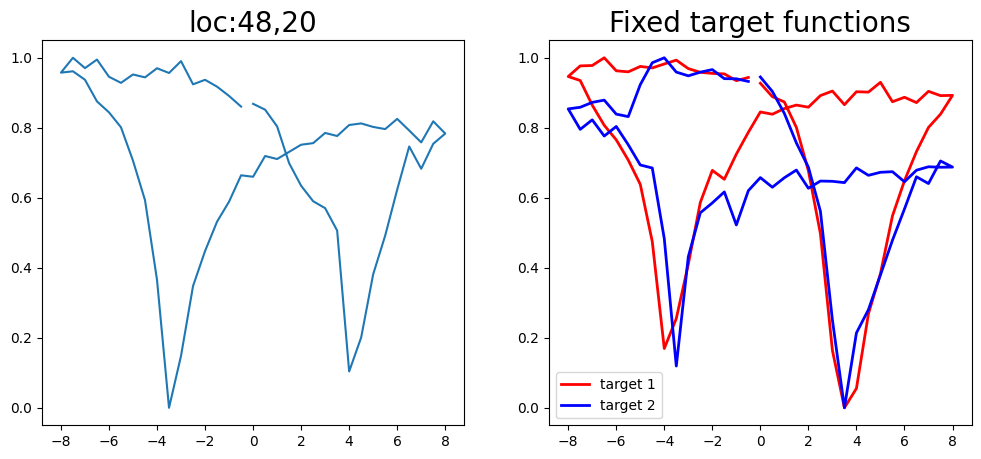

Epoch 1/200 ... Training loss: 3.0953
Epoch 10/200 ... Training loss: 2.4531
Epoch 20/200 ... Training loss: 1.998
Epoch 30/200 ... Training loss: 1.6575
Epoch 40/200 ... Training loss: 1.5026
Epoch 50/200 ... Training loss: 1.3958
Epoch 60/200 ... Training loss: 1.3566
Epoch 70/200 ... Training loss: 1.2434
Epoch 80/200 ... Training loss: 1.1666
Epoch 90/200 ... Training loss: 1.1039
Epoch 100/200 ... Training loss: 1.0736
Epoch 110/200 ... Training loss: 1.009
Epoch 120/200 ... Training loss: 0.9488
Epoch 130/200 ... Training loss: 0.9246
Epoch 140/200 ... Training loss: 0.8809
Epoch 150/200 ... Training loss: 0.8097
Epoch 160/200 ... Training loss: 0.7691
Epoch 170/200 ... Training loss: 0.7311
Epoch 180/200 ... Training loss: 0.6554
Epoch 190/200 ... Training loss: 0.7772
Epoch 200/200 ... Training loss: 0.6365
Epoch 1/200 ... Training loss: 2.4958
Epoch 10/200 ... Training loss: 2.3557
Epoch 20/200 ... Training loss: 2.0554
Epoch 30/200 ... Training loss: 1.9464
Epoch 40/200 ... T

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


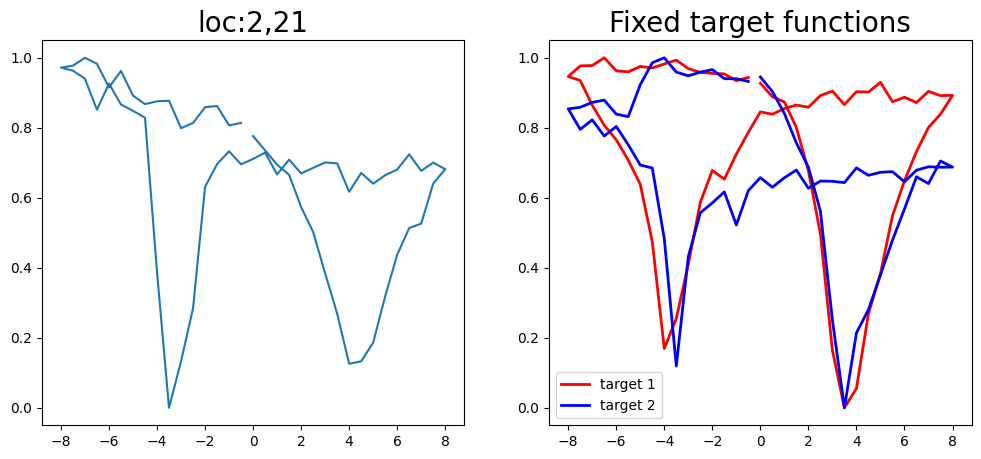

Epoch 1/200 ... Training loss: 3.0607
Epoch 10/200 ... Training loss: 2.4597
Epoch 20/200 ... Training loss: 2.0184
Epoch 30/200 ... Training loss: 1.5942
Epoch 40/200 ... Training loss: 1.4586
Epoch 50/200 ... Training loss: 1.4119
Epoch 60/200 ... Training loss: 1.2956
Epoch 70/200 ... Training loss: 1.2359
Epoch 80/200 ... Training loss: 1.1769
Epoch 90/200 ... Training loss: 1.1647
Epoch 100/200 ... Training loss: 1.0863
Epoch 110/200 ... Training loss: 1.0173
Epoch 120/200 ... Training loss: 0.9609
Epoch 130/200 ... Training loss: 0.9181
Epoch 140/200 ... Training loss: 0.9101
Epoch 150/200 ... Training loss: 0.8226
Epoch 160/200 ... Training loss: 0.7686
Epoch 170/200 ... Training loss: 0.7677
Epoch 180/200 ... Training loss: 0.6963
Epoch 190/200 ... Training loss: 0.6477
Epoch 200/200 ... Training loss: 0.5884
Epoch 1/200 ... Training loss: 2.4708
Epoch 10/200 ... Training loss: 2.0815
Epoch 20/200 ... Training loss: 1.9406
Epoch 30/200 ... Training loss: 1.709
Epoch 40/200 ... 

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


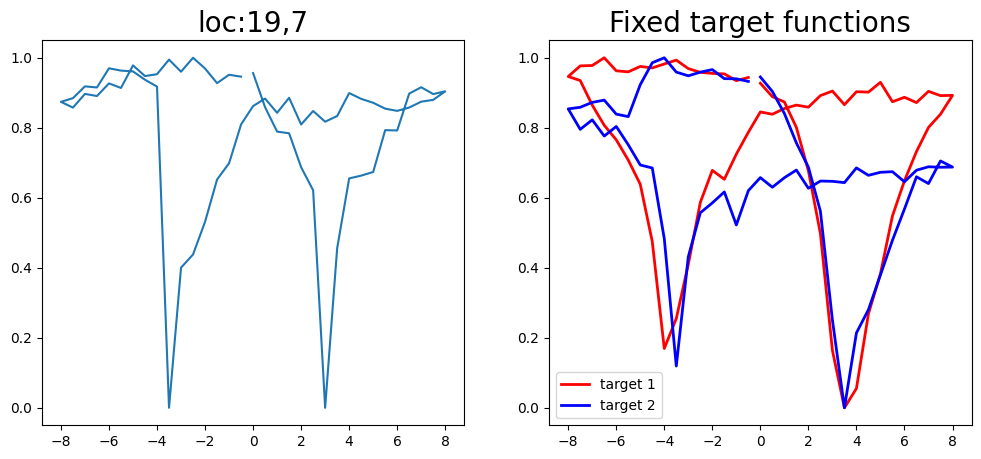

Epoch 1/200 ... Training loss: 3.0406
Epoch 10/200 ... Training loss: 2.3196
Epoch 20/200 ... Training loss: 1.9821
Epoch 30/200 ... Training loss: 1.6756
Epoch 40/200 ... Training loss: 1.5207
Epoch 50/200 ... Training loss: 1.4092
Epoch 60/200 ... Training loss: 1.3169
Epoch 70/200 ... Training loss: 1.2543
Epoch 80/200 ... Training loss: 1.1856
Epoch 90/200 ... Training loss: 1.1672
Epoch 100/200 ... Training loss: 1.0869
Epoch 110/200 ... Training loss: 1.0133
Epoch 120/200 ... Training loss: 1.0345
Epoch 130/200 ... Training loss: 0.9222
Epoch 140/200 ... Training loss: 0.8632
Epoch 150/200 ... Training loss: 0.7986
Epoch 160/200 ... Training loss: 0.7699
Epoch 170/200 ... Training loss: 0.6995
Epoch 180/200 ... Training loss: 0.676
Epoch 190/200 ... Training loss: 0.6586
Epoch 200/200 ... Training loss: 0.6262
Epoch 1/200 ... Training loss: 2.4473
Epoch 10/200 ... Training loss: 2.2064
Epoch 20/200 ... Training loss: 2.2177
Epoch 30/200 ... Training loss: 1.9212
Epoch 40/200 ... 

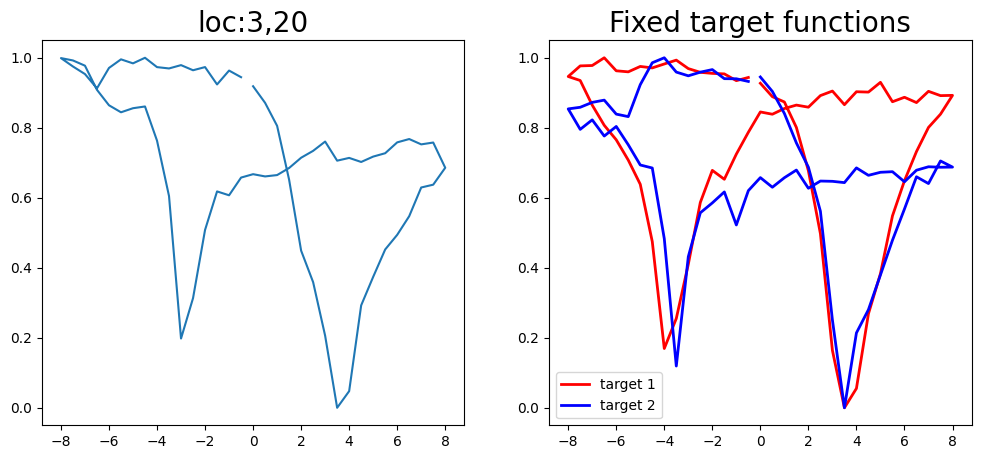

Epoch 1/200 ... Training loss: 3.006
Epoch 10/200 ... Training loss: 2.4894
Epoch 20/200 ... Training loss: 1.9172
Epoch 30/200 ... Training loss: 1.6293
Epoch 40/200 ... Training loss: 1.5114
Epoch 50/200 ... Training loss: 1.4053
Epoch 60/200 ... Training loss: 1.3143
Epoch 70/200 ... Training loss: 1.2329
Epoch 80/200 ... Training loss: 1.3559
Epoch 90/200 ... Training loss: 1.1781
Epoch 100/200 ... Training loss: 1.0789
Epoch 110/200 ... Training loss: 1.0179
Epoch 120/200 ... Training loss: 0.9619
Epoch 130/200 ... Training loss: 0.9159
Epoch 140/200 ... Training loss: 0.8662
Epoch 150/200 ... Training loss: 0.9891
Epoch 160/200 ... Training loss: 0.8623
Epoch 170/200 ... Training loss: 0.8388
Epoch 180/200 ... Training loss: 0.7481
Epoch 190/200 ... Training loss: 0.6776
Epoch 200/200 ... Training loss: 0.652
Epoch 1/200 ... Training loss: 2.4216
Epoch 10/200 ... Training loss: 2.2202
Epoch 20/200 ... Training loss: 1.8643
Epoch 30/200 ... Training loss: 1.6961
Epoch 40/200 ... T

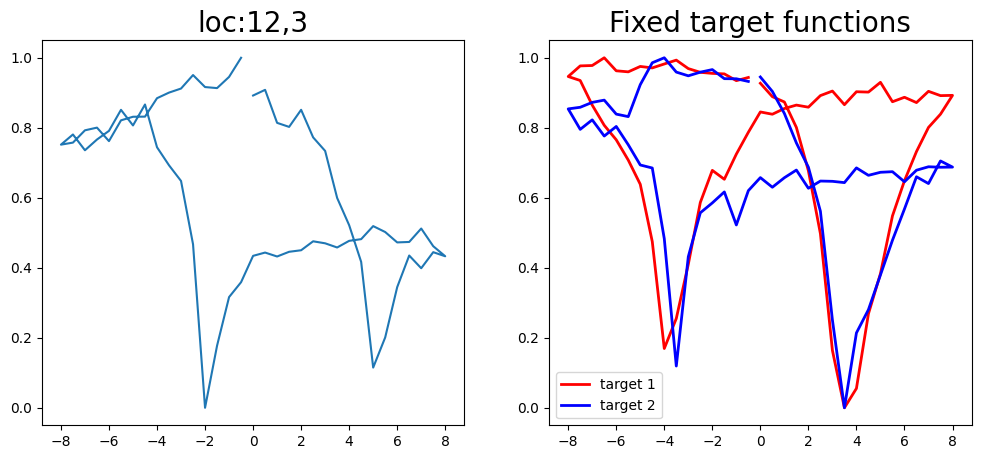

Epoch 1/200 ... Training loss: 3.0512
Epoch 10/200 ... Training loss: 2.5225
Epoch 20/200 ... Training loss: 1.8171
Epoch 30/200 ... Training loss: 1.6415
Epoch 40/200 ... Training loss: 1.4766
Epoch 50/200 ... Training loss: 1.3742
Epoch 60/200 ... Training loss: 1.2997
Epoch 70/200 ... Training loss: 1.2731
Epoch 80/200 ... Training loss: 1.1717
Epoch 90/200 ... Training loss: 1.1357
Epoch 100/200 ... Training loss: 1.0502
Epoch 110/200 ... Training loss: 1.0365
Epoch 120/200 ... Training loss: 0.9834
Epoch 130/200 ... Training loss: 0.9263
Epoch 140/200 ... Training loss: 0.8703
Epoch 150/200 ... Training loss: 0.8126
Epoch 160/200 ... Training loss: 0.7585
Epoch 170/200 ... Training loss: 0.8057
Epoch 180/200 ... Training loss: 0.7239
Epoch 190/200 ... Training loss: 0.6413
Epoch 200/200 ... Training loss: 0.5853
Epoch 1/200 ... Training loss: 2.4323
Epoch 10/200 ... Training loss: 2.0964
Epoch 20/200 ... Training loss: 2.0974
Epoch 30/200 ... Training loss: 1.8476
Epoch 40/200 ...

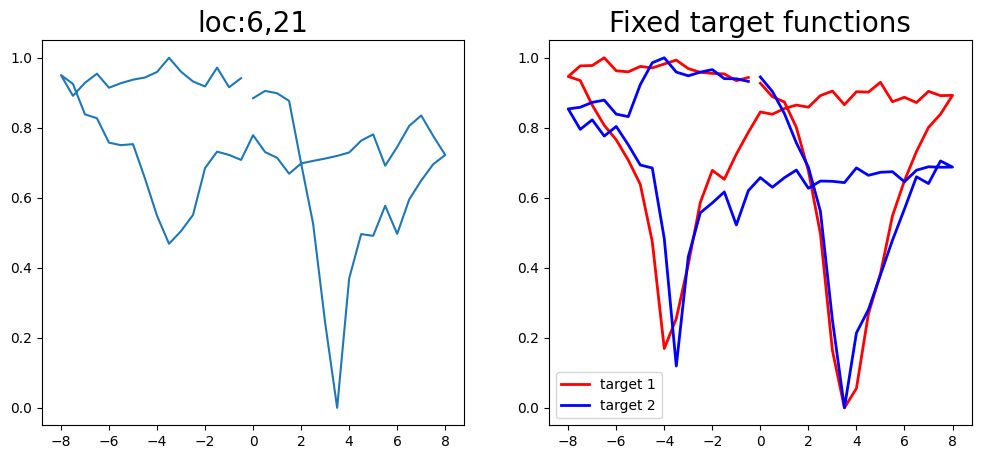

Epoch 1/200 ... Training loss: 3.0356
Epoch 10/200 ... Training loss: 2.4879
Epoch 20/200 ... Training loss: 1.9625
Epoch 30/200 ... Training loss: 1.6017
Epoch 40/200 ... Training loss: 1.4225
Epoch 50/200 ... Training loss: 1.389
Epoch 60/200 ... Training loss: 1.2739
Epoch 70/200 ... Training loss: 1.1979
Epoch 80/200 ... Training loss: 1.1419
Epoch 90/200 ... Training loss: 1.097
Epoch 100/200 ... Training loss: 1.0275
Epoch 110/200 ... Training loss: 1.0822
Epoch 120/200 ... Training loss: 0.9554
Epoch 130/200 ... Training loss: 0.8866
Epoch 140/200 ... Training loss: 0.8758
Epoch 150/200 ... Training loss: 0.782
Epoch 160/200 ... Training loss: 0.749
Epoch 170/200 ... Training loss: 0.7205
Epoch 180/200 ... Training loss: 0.6292
Epoch 190/200 ... Training loss: 0.612
Epoch 200/200 ... Training loss: 0.6241
Epoch 1/200 ... Training loss: 2.4123
Epoch 10/200 ... Training loss: 2.1456
Epoch 20/200 ... Training loss: 1.9678
Epoch 30/200 ... Training loss: 1.8366
Epoch 40/200 ... Trai

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


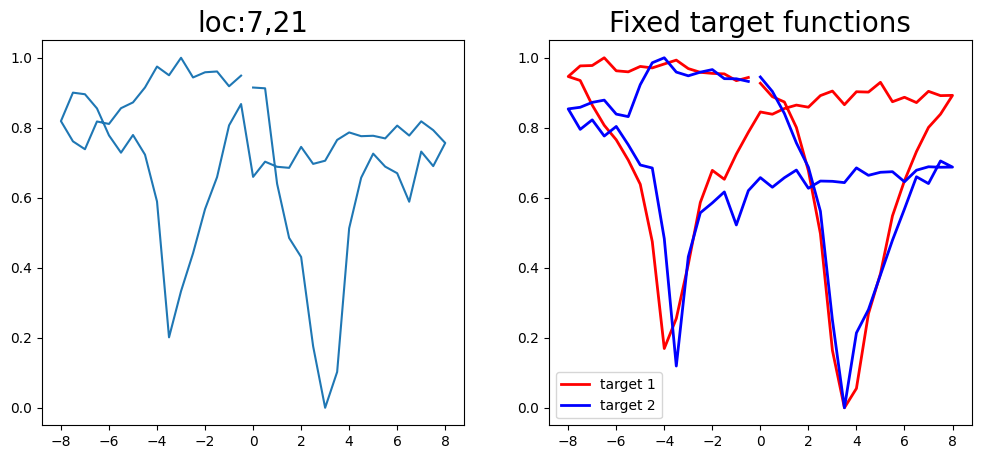

Epoch 1/200 ... Training loss: 3.0291
Epoch 10/200 ... Training loss: 2.381
Epoch 20/200 ... Training loss: 1.8772
Epoch 30/200 ... Training loss: 1.5321
Epoch 40/200 ... Training loss: 1.5135
Epoch 50/200 ... Training loss: 1.3466
Epoch 60/200 ... Training loss: 1.2486
Epoch 70/200 ... Training loss: 1.1776
Epoch 80/200 ... Training loss: 1.1352
Epoch 90/200 ... Training loss: 1.086
Epoch 100/200 ... Training loss: 1.0454
Epoch 110/200 ... Training loss: 1.0049
Epoch 120/200 ... Training loss: 0.9148
Epoch 130/200 ... Training loss: 0.8676
Epoch 140/200 ... Training loss: 0.8361
Epoch 150/200 ... Training loss: 0.8844
Epoch 160/200 ... Training loss: 0.9256
Epoch 170/200 ... Training loss: 0.7781
Epoch 180/200 ... Training loss: 0.6866
Epoch 190/200 ... Training loss: 0.6445
Epoch 200/200 ... Training loss: 0.5479
Epoch 1/200 ... Training loss: 2.4005
Epoch 10/200 ... Training loss: 2.3998
Epoch 20/200 ... Training loss: 2.2934
Epoch 30/200 ... Training loss: 2.1438
Epoch 40/200 ... T

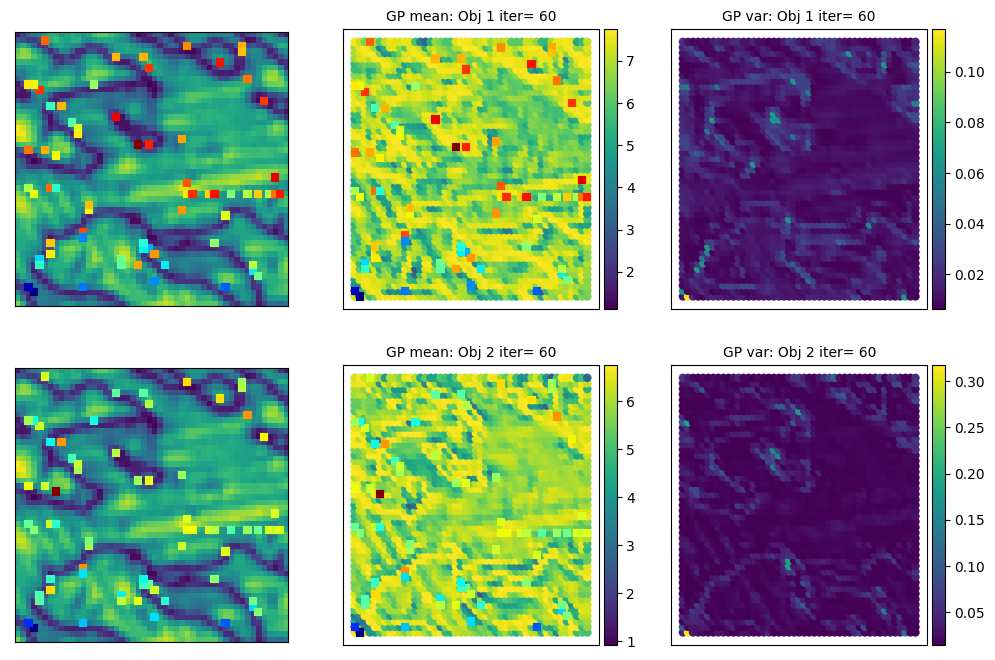

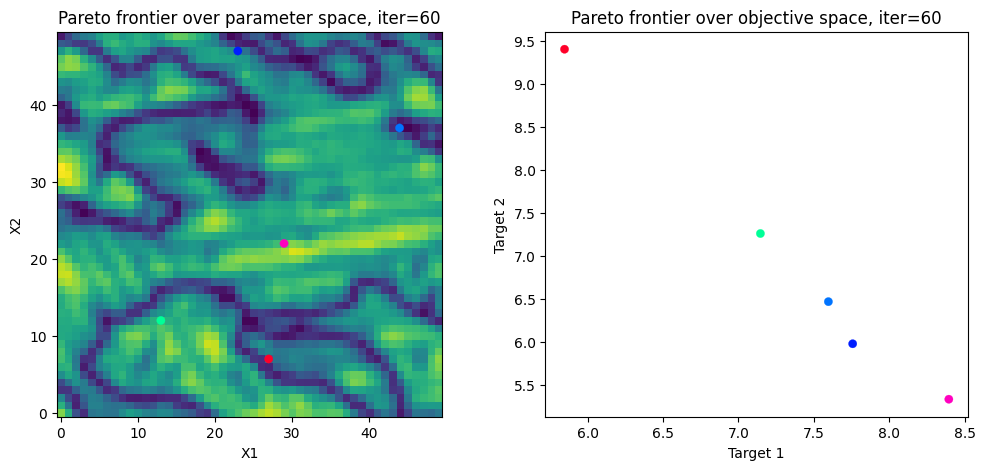

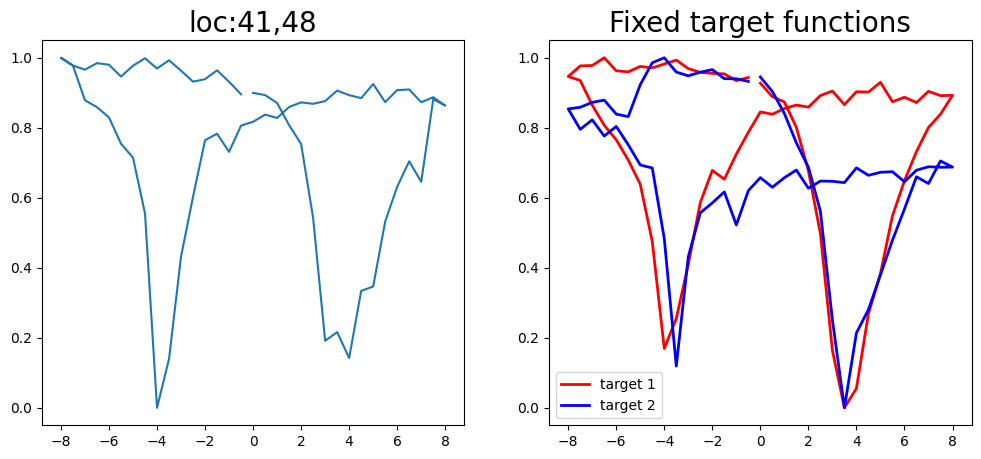

Epoch 1/200 ... Training loss: 3.0707
Epoch 10/200 ... Training loss: 2.5273
Epoch 20/200 ... Training loss: 1.9948
Epoch 30/200 ... Training loss: 1.6105
Epoch 40/200 ... Training loss: 1.4652
Epoch 50/200 ... Training loss: 1.3832
Epoch 60/200 ... Training loss: 1.284
Epoch 70/200 ... Training loss: 1.3119
Epoch 80/200 ... Training loss: 1.2143
Epoch 90/200 ... Training loss: 1.127
Epoch 100/200 ... Training loss: 1.0633
Epoch 110/200 ... Training loss: 1.0684
Epoch 120/200 ... Training loss: 1.0224
Epoch 130/200 ... Training loss: 0.924
Epoch 140/200 ... Training loss: 0.8867
Epoch 150/200 ... Training loss: 0.8202
Epoch 160/200 ... Training loss: 0.8229
Epoch 170/200 ... Training loss: 0.758
Epoch 180/200 ... Training loss: 0.6806
Epoch 190/200 ... Training loss: 0.6773
Epoch 200/200 ... Training loss: 0.5996
Epoch 1/200 ... Training loss: 2.3937
Epoch 10/200 ... Training loss: 2.2658
Epoch 20/200 ... Training loss: 1.9163
Epoch 30/200 ... Training loss: 1.7213
Epoch 40/200 ... Tra

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


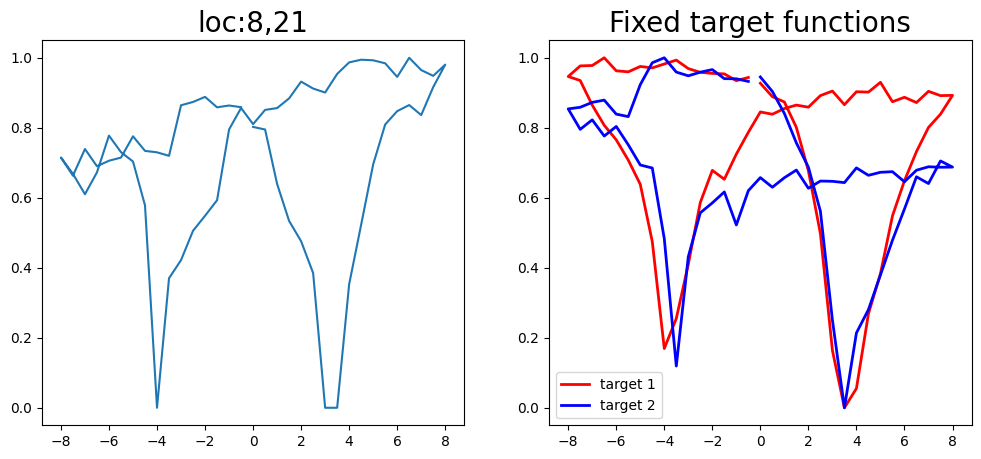

Epoch 1/200 ... Training loss: 3.0381
Epoch 10/200 ... Training loss: 2.2802
Epoch 20/200 ... Training loss: 1.8982
Epoch 30/200 ... Training loss: 1.545
Epoch 40/200 ... Training loss: 1.5137
Epoch 50/200 ... Training loss: 1.3723
Epoch 60/200 ... Training loss: 1.2676
Epoch 70/200 ... Training loss: 1.1943
Epoch 80/200 ... Training loss: 1.1435
Epoch 90/200 ... Training loss: 1.0891
Epoch 100/200 ... Training loss: 1.0736
Epoch 110/200 ... Training loss: 1.2761
Epoch 120/200 ... Training loss: 1.1332
Epoch 130/200 ... Training loss: 0.9792
Epoch 140/200 ... Training loss: 0.9167
Epoch 150/200 ... Training loss: 0.8402
Epoch 160/200 ... Training loss: 0.7774
Epoch 170/200 ... Training loss: 0.7372
Epoch 180/200 ... Training loss: 0.7348
Epoch 190/200 ... Training loss: 0.6398
Epoch 200/200 ... Training loss: 0.5836
Epoch 1/200 ... Training loss: 2.3714
Epoch 10/200 ... Training loss: 2.1189
Epoch 20/200 ... Training loss: 1.8954
Epoch 30/200 ... Training loss: 1.813
Epoch 40/200 ... T

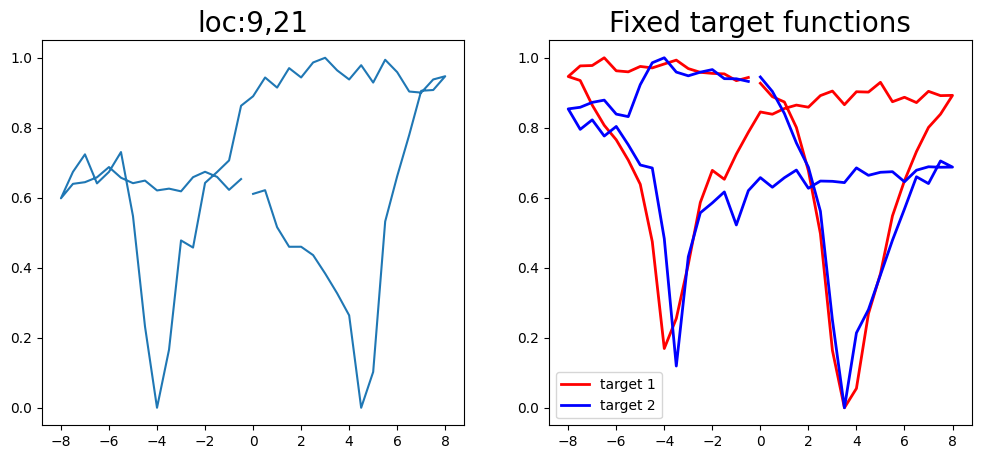

Epoch 1/200 ... Training loss: 3.0063
Epoch 10/200 ... Training loss: 2.5093
Epoch 20/200 ... Training loss: 1.9909
Epoch 30/200 ... Training loss: 1.6196
Epoch 40/200 ... Training loss: 1.4798
Epoch 50/200 ... Training loss: 1.3627
Epoch 60/200 ... Training loss: 1.3306
Epoch 70/200 ... Training loss: 1.2393
Epoch 80/200 ... Training loss: 1.1678
Epoch 90/200 ... Training loss: 1.1937
Epoch 100/200 ... Training loss: 1.0989
Epoch 110/200 ... Training loss: 1.0202
Epoch 120/200 ... Training loss: 0.9553
Epoch 130/200 ... Training loss: 1.0033
Epoch 140/200 ... Training loss: 0.8902
Epoch 150/200 ... Training loss: 0.8313
Epoch 160/200 ... Training loss: 0.7722
Epoch 170/200 ... Training loss: 0.7174
Epoch 180/200 ... Training loss: 0.7118
Epoch 190/200 ... Training loss: 0.648
Epoch 200/200 ... Training loss: 0.5682
Epoch 1/200 ... Training loss: 2.372
Epoch 10/200 ... Training loss: 2.2169
Epoch 20/200 ... Training loss: 1.9226
Epoch 30/200 ... Training loss: 1.7459
Epoch 40/200 ... T

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


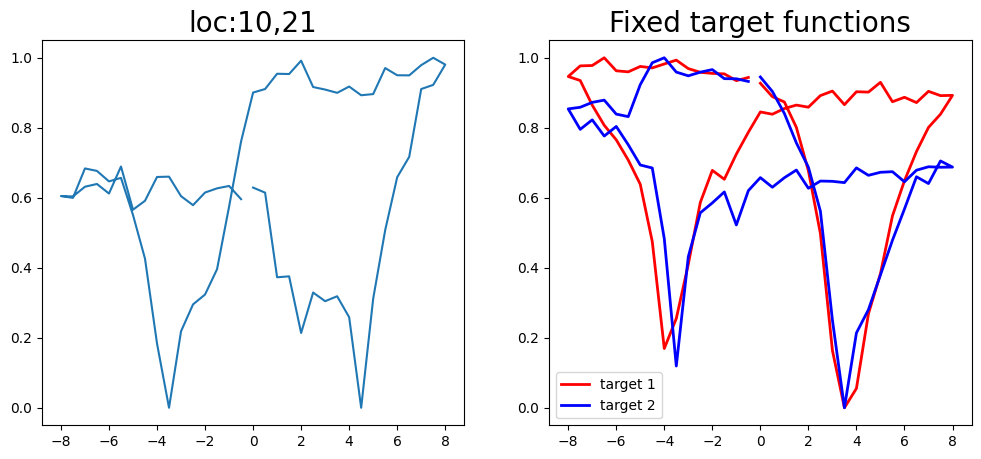

Epoch 1/200 ... Training loss: 2.9884
Epoch 10/200 ... Training loss: 2.6907
Epoch 20/200 ... Training loss: 2.0784
Epoch 30/200 ... Training loss: 1.7128
Epoch 40/200 ... Training loss: 1.5019
Epoch 50/200 ... Training loss: 1.4791
Epoch 60/200 ... Training loss: 1.328
Epoch 70/200 ... Training loss: 1.2361
Epoch 80/200 ... Training loss: 1.254
Epoch 90/200 ... Training loss: 1.1254
Epoch 100/200 ... Training loss: 1.1897
Epoch 110/200 ... Training loss: 1.0467
Epoch 120/200 ... Training loss: 0.9741
Epoch 130/200 ... Training loss: 0.9223
Epoch 140/200 ... Training loss: 0.8903
Epoch 150/200 ... Training loss: 0.8276
Epoch 160/200 ... Training loss: 0.783
Epoch 170/200 ... Training loss: 0.7762
Epoch 180/200 ... Training loss: 0.7426
Epoch 190/200 ... Training loss: 0.6642
Epoch 200/200 ... Training loss: 0.6214
Epoch 1/200 ... Training loss: 2.3611
Epoch 10/200 ... Training loss: 2.0362
Epoch 20/200 ... Training loss: 1.8941
Epoch 30/200 ... Training loss: 1.6682
Epoch 40/200 ... Tr

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


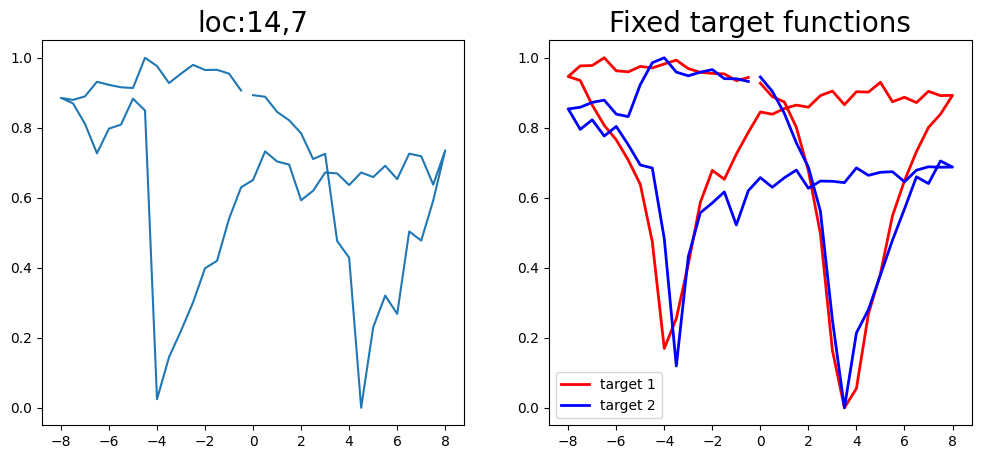

Epoch 1/200 ... Training loss: 2.9629
Epoch 10/200 ... Training loss: 2.5133
Epoch 20/200 ... Training loss: 1.9735
Epoch 30/200 ... Training loss: 1.6176
Epoch 40/200 ... Training loss: 1.47
Epoch 50/200 ... Training loss: 1.368
Epoch 60/200 ... Training loss: 1.2963
Epoch 70/200 ... Training loss: 1.2326
Epoch 80/200 ... Training loss: 1.1457
Epoch 90/200 ... Training loss: 1.128
Epoch 100/200 ... Training loss: 1.0462
Epoch 110/200 ... Training loss: 0.9691
Epoch 120/200 ... Training loss: 0.9348
Epoch 130/200 ... Training loss: 0.8958
Epoch 140/200 ... Training loss: 0.8308
Epoch 150/200 ... Training loss: 0.9317
Epoch 160/200 ... Training loss: 0.7737
Epoch 170/200 ... Training loss: 0.7039
Epoch 180/200 ... Training loss: 0.6973
Epoch 190/200 ... Training loss: 0.7363
Epoch 200/200 ... Training loss: 0.565
Epoch 1/200 ... Training loss: 2.3396
Epoch 10/200 ... Training loss: 2.1508
Epoch 20/200 ... Training loss: 1.8635
Epoch 30/200 ... Training loss: 1.7132
Epoch 40/200 ... Trai

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


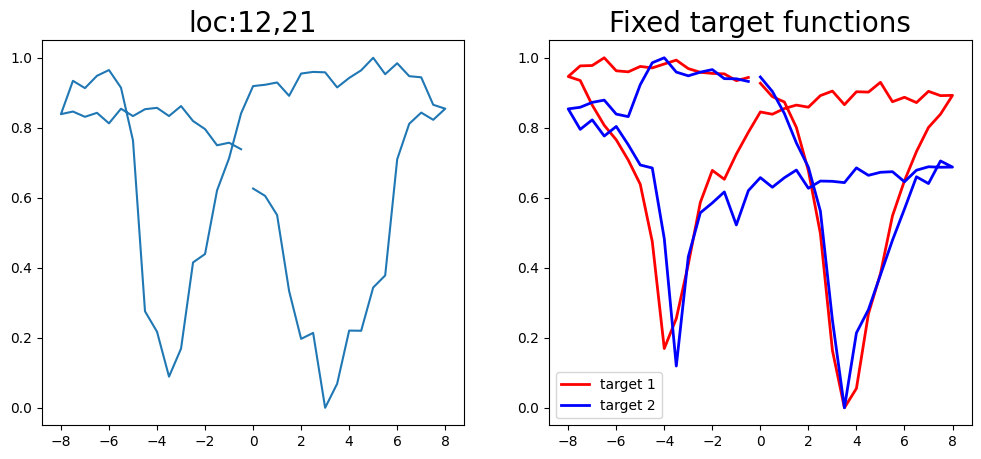

Epoch 1/200 ... Training loss: 2.937
Epoch 10/200 ... Training loss: 2.1815
Epoch 20/200 ... Training loss: 2.0522
Epoch 30/200 ... Training loss: 1.6272
Epoch 40/200 ... Training loss: 1.4954
Epoch 50/200 ... Training loss: 1.3908
Epoch 60/200 ... Training loss: 1.296
Epoch 70/200 ... Training loss: 1.2178
Epoch 80/200 ... Training loss: 1.2774
Epoch 90/200 ... Training loss: 1.3636
Epoch 100/200 ... Training loss: 1.1974
Epoch 110/200 ... Training loss: 1.0876
Epoch 120/200 ... Training loss: 1.05
Epoch 130/200 ... Training loss: 0.9453
Epoch 140/200 ... Training loss: 0.8698
Epoch 150/200 ... Training loss: 0.8532
Epoch 160/200 ... Training loss: 0.7725
Epoch 170/200 ... Training loss: 0.7304
Epoch 180/200 ... Training loss: 0.6592
Epoch 190/200 ... Training loss: 0.7226
Epoch 200/200 ... Training loss: 0.6747
Epoch 1/200 ... Training loss: 2.3305
Epoch 10/200 ... Training loss: 2.2166
Epoch 20/200 ... Training loss: 1.9374
Epoch 30/200 ... Training loss: 1.7431
Epoch 40/200 ... Tra

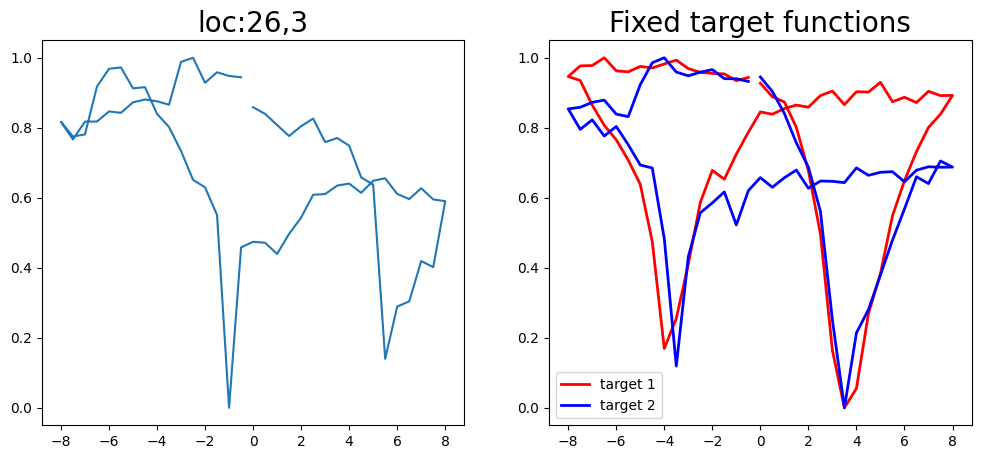

Epoch 1/200 ... Training loss: 3.1034
Epoch 10/200 ... Training loss: 2.9777
Epoch 20/200 ... Training loss: 2.6833
Epoch 30/200 ... Training loss: 2.2541
Epoch 40/200 ... Training loss: 1.923
Epoch 50/200 ... Training loss: 1.6255
Epoch 60/200 ... Training loss: 1.5299
Epoch 70/200 ... Training loss: 1.3833
Epoch 80/200 ... Training loss: 1.3222
Epoch 90/200 ... Training loss: 1.3064
Epoch 100/200 ... Training loss: 1.2261
Epoch 110/200 ... Training loss: 1.2292
Epoch 120/200 ... Training loss: 1.1738
Epoch 130/200 ... Training loss: 1.1119
Epoch 140/200 ... Training loss: 1.1265
Epoch 150/200 ... Training loss: 1.0493
Epoch 160/200 ... Training loss: 1.0729
Epoch 170/200 ... Training loss: 1.0479
Epoch 180/200 ... Training loss: 0.9516
Epoch 190/200 ... Training loss: 0.9434
Epoch 200/200 ... Training loss: 0.8869
Epoch 1/200 ... Training loss: 2.4155
Epoch 10/200 ... Training loss: 2.2783
Epoch 20/200 ... Training loss: 2.019
Epoch 30/200 ... Training loss: 1.6463
Epoch 40/200 ... T

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


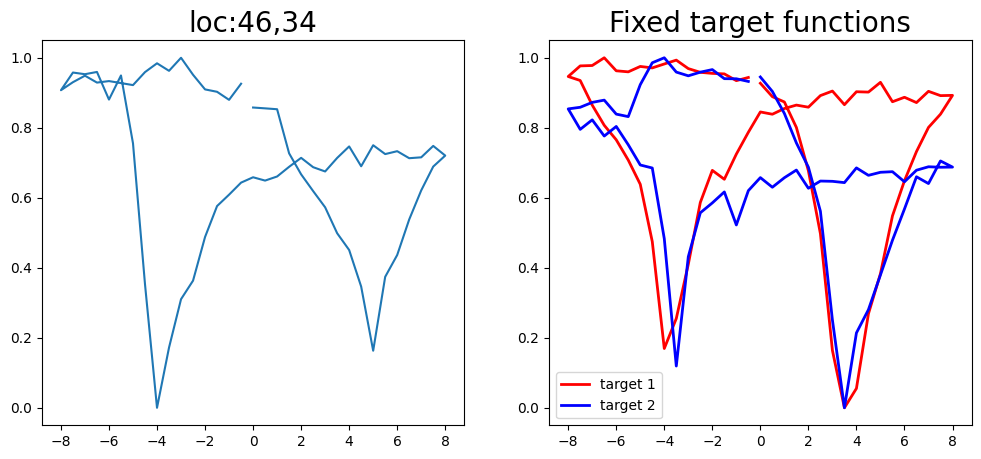

Epoch 1/200 ... Training loss: 3.0787
Epoch 10/200 ... Training loss: 2.565
Epoch 20/200 ... Training loss: 2.2821
Epoch 30/200 ... Training loss: 1.9145
Epoch 40/200 ... Training loss: 1.5829
Epoch 50/200 ... Training loss: 1.4518
Epoch 60/200 ... Training loss: 1.4157
Epoch 70/200 ... Training loss: 1.2928
Epoch 80/200 ... Training loss: 1.291
Epoch 90/200 ... Training loss: 1.1941
Epoch 100/200 ... Training loss: 1.1373
Epoch 110/200 ... Training loss: 1.1479
Epoch 120/200 ... Training loss: 1.0826
Epoch 130/200 ... Training loss: 1.0127
Epoch 140/200 ... Training loss: 0.9563
Epoch 150/200 ... Training loss: 0.904
Epoch 160/200 ... Training loss: 0.8796
Epoch 170/200 ... Training loss: 0.8504
Epoch 180/200 ... Training loss: 0.842
Epoch 190/200 ... Training loss: 0.7669
Epoch 200/200 ... Training loss: 0.7266
Epoch 1/200 ... Training loss: 2.3943
Epoch 10/200 ... Training loss: 2.2363
Epoch 20/200 ... Training loss: 1.9624
Epoch 30/200 ... Training loss: 1.6412
Epoch 40/200 ... Tra

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


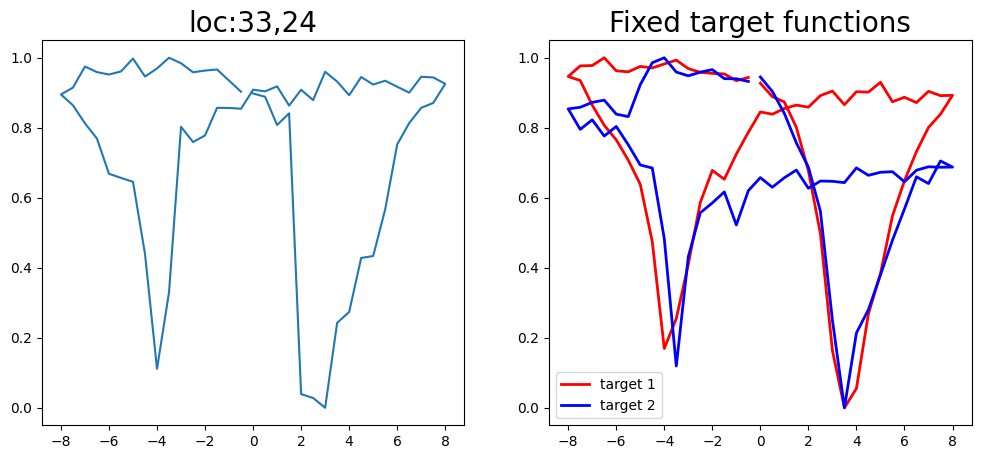

Epoch 1/200 ... Training loss: 3.0771
Epoch 10/200 ... Training loss: 2.5864
Epoch 20/200 ... Training loss: 2.1328
Epoch 30/200 ... Training loss: 1.8141
Epoch 40/200 ... Training loss: 1.5485
Epoch 50/200 ... Training loss: 1.4999
Epoch 60/200 ... Training loss: 1.3761
Epoch 70/200 ... Training loss: 1.2655
Epoch 80/200 ... Training loss: 1.2722
Epoch 90/200 ... Training loss: 1.1636
Epoch 100/200 ... Training loss: 1.1053
Epoch 110/200 ... Training loss: 1.0359
Epoch 120/200 ... Training loss: 1.0219
Epoch 130/200 ... Training loss: 0.9887
Epoch 140/200 ... Training loss: 0.9181
Epoch 150/200 ... Training loss: 0.8708
Epoch 160/200 ... Training loss: 0.8534
Epoch 170/200 ... Training loss: 0.7951
Epoch 180/200 ... Training loss: 0.7745
Epoch 190/200 ... Training loss: 0.6995
Epoch 200/200 ... Training loss: 0.6336
Epoch 1/200 ... Training loss: 2.3732
Epoch 10/200 ... Training loss: 2.1649
Epoch 20/200 ... Training loss: 1.8612
Epoch 30/200 ... Training loss: 1.6045
Epoch 40/200 ...

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


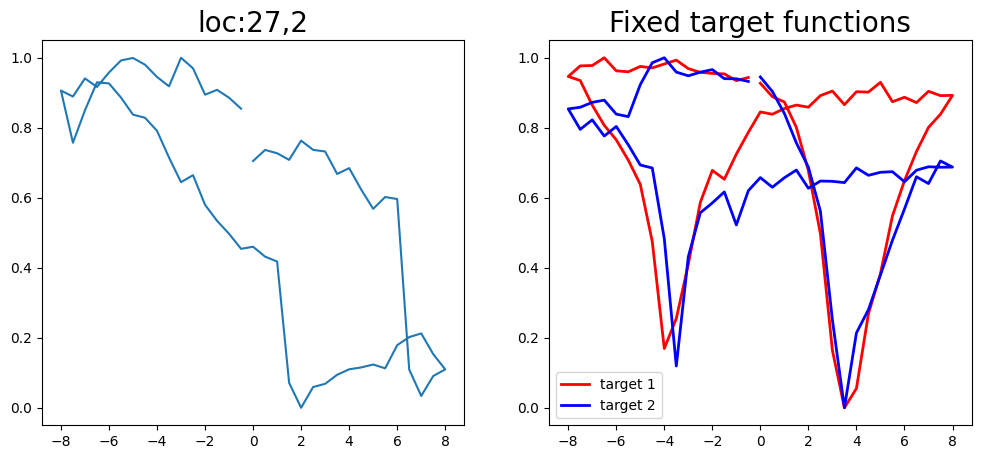

Epoch 1/200 ... Training loss: 3.3561
Epoch 10/200 ... Training loss: 2.9405
Epoch 20/200 ... Training loss: 2.6586
Epoch 30/200 ... Training loss: 2.2677
Epoch 40/200 ... Training loss: 1.7713
Epoch 50/200 ... Training loss: 1.8848
Epoch 60/200 ... Training loss: 1.7158
Epoch 70/200 ... Training loss: 1.4373
Epoch 80/200 ... Training loss: 1.3328
Epoch 90/200 ... Training loss: 1.2542
Epoch 100/200 ... Training loss: 1.2068
Epoch 110/200 ... Training loss: 1.2148
Epoch 120/200 ... Training loss: 1.1482
Epoch 130/200 ... Training loss: 1.1021
Epoch 140/200 ... Training loss: 1.0595
Epoch 150/200 ... Training loss: 1.2839
Epoch 160/200 ... Training loss: 1.1063
Epoch 170/200 ... Training loss: 1.0002
Epoch 180/200 ... Training loss: 0.9532
Epoch 190/200 ... Training loss: 0.9135
Epoch 200/200 ... Training loss: 0.8761
Epoch 1/200 ... Training loss: 2.5196
Epoch 10/200 ... Training loss: 2.3943
Epoch 20/200 ... Training loss: 2.1892
Epoch 30/200 ... Training loss: 1.9683
Epoch 40/200 ...

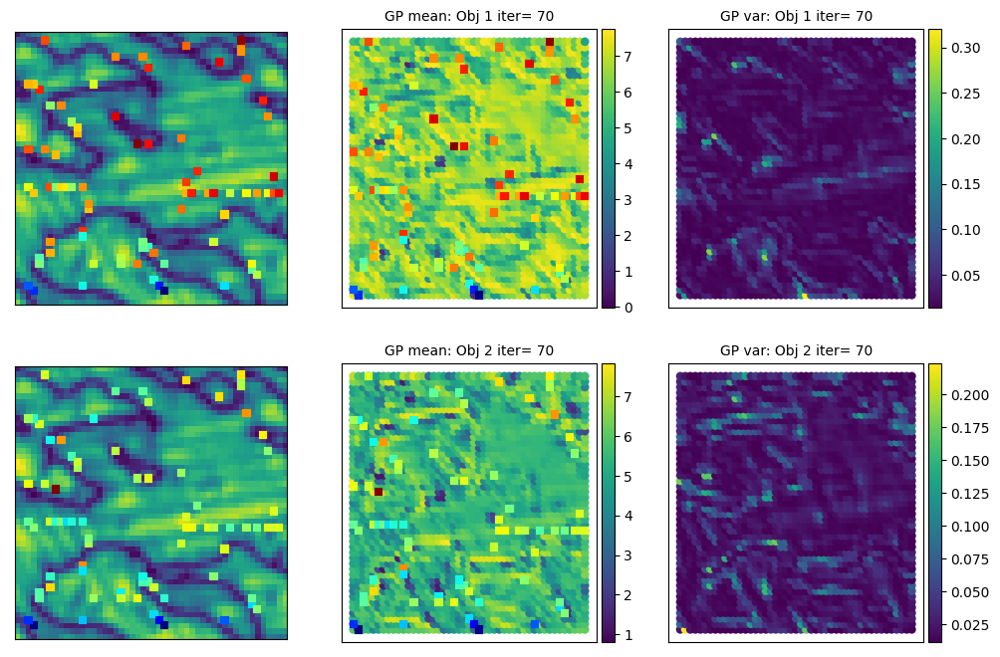

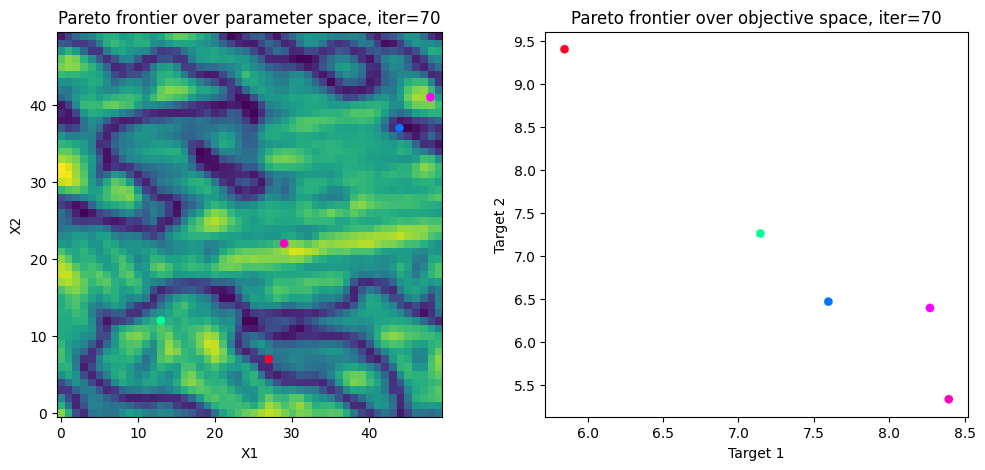

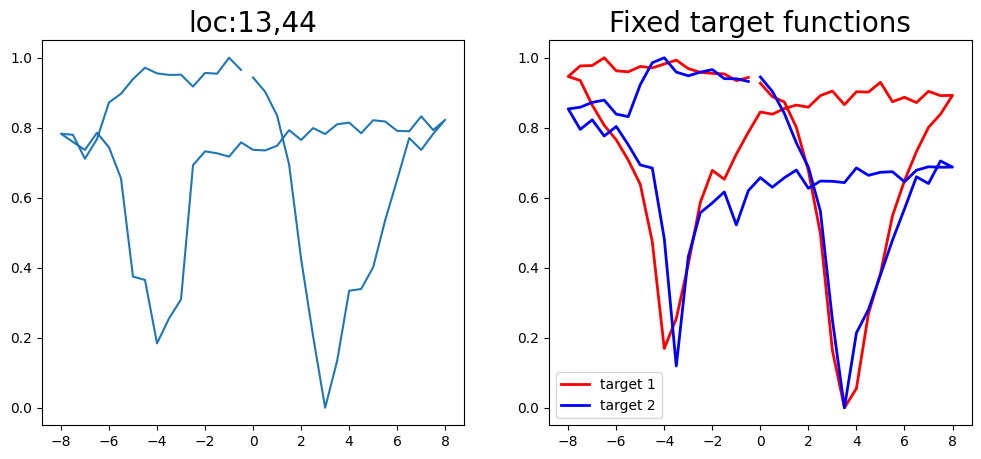

Epoch 1/200 ... Training loss: 3.3319
Epoch 10/200 ... Training loss: 2.8805
Epoch 20/200 ... Training loss: 2.5633
Epoch 30/200 ... Training loss: 2.1463
Epoch 40/200 ... Training loss: 1.7311
Epoch 50/200 ... Training loss: 1.4539
Epoch 60/200 ... Training loss: 1.4853
Epoch 70/200 ... Training loss: 1.4344
Epoch 80/200 ... Training loss: 1.2882
Epoch 90/200 ... Training loss: 1.2092
Epoch 100/200 ... Training loss: 1.1655
Epoch 110/200 ... Training loss: 1.1545
Epoch 120/200 ... Training loss: 1.1022
Epoch 130/200 ... Training loss: 1.0558
Epoch 140/200 ... Training loss: 1.2025
Epoch 150/200 ... Training loss: 1.0578
Epoch 160/200 ... Training loss: 0.9892
Epoch 170/200 ... Training loss: 0.944
Epoch 180/200 ... Training loss: 0.9072
Epoch 190/200 ... Training loss: 0.8899
Epoch 200/200 ... Training loss: 0.8522
Epoch 1/200 ... Training loss: 2.5183
Epoch 10/200 ... Training loss: 2.3496
Epoch 20/200 ... Training loss: 2.0169
Epoch 30/200 ... Training loss: 2.0113
Epoch 40/200 ... 

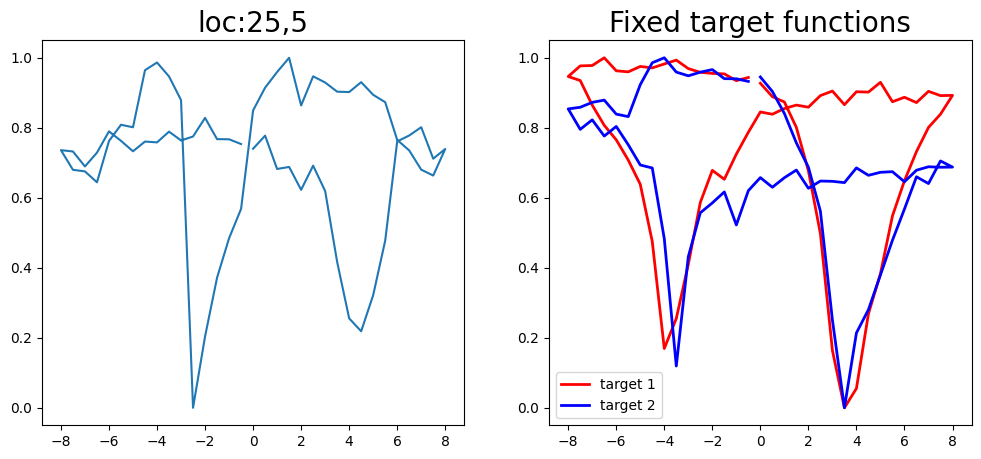

Epoch 1/200 ... Training loss: 3.3957
Epoch 10/200 ... Training loss: 3.1025
Epoch 20/200 ... Training loss: 2.7255
Epoch 30/200 ... Training loss: 2.19
Epoch 40/200 ... Training loss: 1.9308
Epoch 50/200 ... Training loss: 1.59
Epoch 60/200 ... Training loss: 1.4016
Epoch 70/200 ... Training loss: 1.8807
Epoch 80/200 ... Training loss: 1.429
Epoch 90/200 ... Training loss: 1.3053
Epoch 100/200 ... Training loss: 1.2279
Epoch 110/200 ... Training loss: 1.1793
Epoch 120/200 ... Training loss: 1.2308
Epoch 130/200 ... Training loss: 1.1263
Epoch 140/200 ... Training loss: 1.08
Epoch 150/200 ... Training loss: 1.0567
Epoch 160/200 ... Training loss: 1.027
Epoch 170/200 ... Training loss: 0.9878
Epoch 180/200 ... Training loss: 0.9798
Epoch 190/200 ... Training loss: 0.9417
Epoch 200/200 ... Training loss: 0.8992
Epoch 1/200 ... Training loss: 2.5598
Epoch 10/200 ... Training loss: 2.4156
Epoch 20/200 ... Training loss: 2.0746
Epoch 30/200 ... Training loss: 1.9012
Epoch 40/200 ... Trainin

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


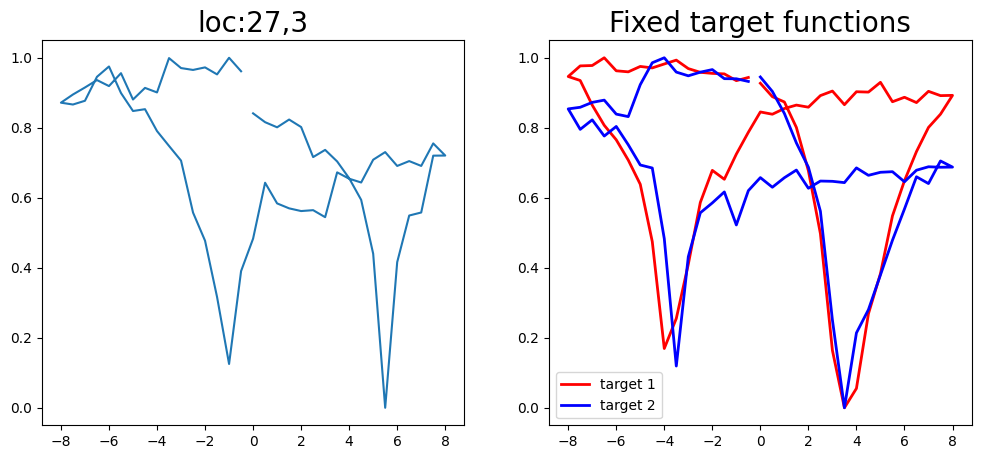

Epoch 1/200 ... Training loss: 3.4557
Epoch 10/200 ... Training loss: 3.2219
Epoch 20/200 ... Training loss: 2.8948
Epoch 30/200 ... Training loss: 2.5141
Epoch 40/200 ... Training loss: 1.9343
Epoch 50/200 ... Training loss: 1.6746
Epoch 60/200 ... Training loss: 1.5104
Epoch 70/200 ... Training loss: 1.4357
Epoch 80/200 ... Training loss: 1.3946
Epoch 90/200 ... Training loss: 1.2513
Epoch 100/200 ... Training loss: 1.249
Epoch 110/200 ... Training loss: 1.1922
Epoch 120/200 ... Training loss: 1.1315
Epoch 130/200 ... Training loss: 1.0941
Epoch 140/200 ... Training loss: 1.3077
Epoch 150/200 ... Training loss: 1.1429
Epoch 160/200 ... Training loss: 1.0468
Epoch 170/200 ... Training loss: 1.0055
Epoch 180/200 ... Training loss: 1.0362
Epoch 190/200 ... Training loss: 0.9417
Epoch 200/200 ... Training loss: 0.9476
Epoch 1/200 ... Training loss: 2.5854
Epoch 10/200 ... Training loss: 2.3297
Epoch 20/200 ... Training loss: 1.9875
Epoch 30/200 ... Training loss: 1.791
Epoch 40/200 ... T

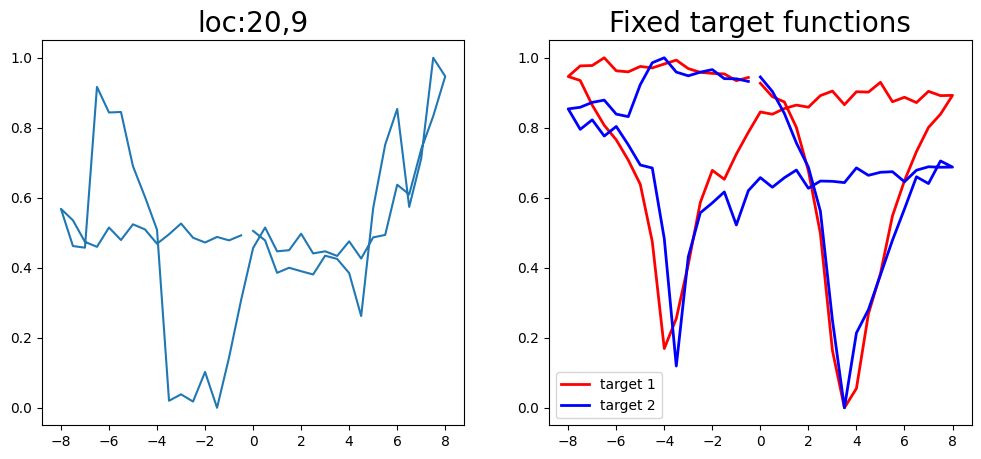

Epoch 1/200 ... Training loss: 3.4912
Epoch 10/200 ... Training loss: 2.9814
Epoch 20/200 ... Training loss: 2.5796
Epoch 30/200 ... Training loss: 2.1058
Epoch 40/200 ... Training loss: 1.7421
Epoch 50/200 ... Training loss: 1.9887
Epoch 60/200 ... Training loss: 1.5935
Epoch 70/200 ... Training loss: 1.4199
Epoch 80/200 ... Training loss: 1.2897
Epoch 90/200 ... Training loss: 1.5684
Epoch 100/200 ... Training loss: 1.4221
Epoch 110/200 ... Training loss: 1.2237
Epoch 120/200 ... Training loss: 1.158
Epoch 130/200 ... Training loss: 1.1003
Epoch 140/200 ... Training loss: 1.1678
Epoch 150/200 ... Training loss: 1.0656
Epoch 160/200 ... Training loss: 1.0121
Epoch 170/200 ... Training loss: 0.973
Epoch 180/200 ... Training loss: 0.943
Epoch 190/200 ... Training loss: 1.0616
Epoch 200/200 ... Training loss: 0.9173
Epoch 1/200 ... Training loss: 2.5975
Epoch 10/200 ... Training loss: 2.5236
Epoch 20/200 ... Training loss: 2.2959
Epoch 30/200 ... Training loss: 2.0883
Epoch 40/200 ... Tr

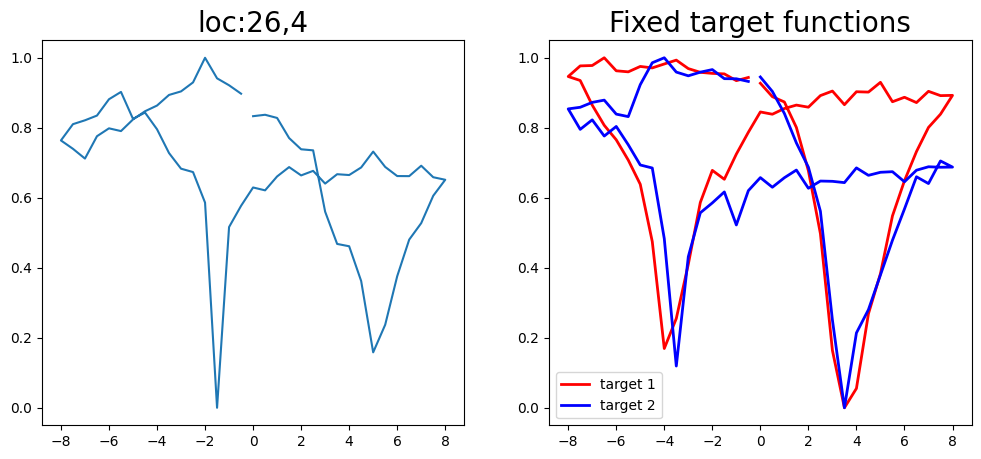

Epoch 1/200 ... Training loss: 3.4931
Epoch 10/200 ... Training loss: 3.0672
Epoch 20/200 ... Training loss: 2.2581
Epoch 30/200 ... Training loss: 1.9049
Epoch 40/200 ... Training loss: 2.3352
Epoch 50/200 ... Training loss: 1.8356
Epoch 60/200 ... Training loss: 1.6402
Epoch 70/200 ... Training loss: 1.4541
Epoch 80/200 ... Training loss: 1.3095
Epoch 90/200 ... Training loss: 1.2225
Epoch 100/200 ... Training loss: 1.1787
Epoch 110/200 ... Training loss: 1.1317
Epoch 120/200 ... Training loss: 1.0908
Epoch 130/200 ... Training loss: 1.0634
Epoch 140/200 ... Training loss: 1.0277
Epoch 150/200 ... Training loss: 0.9949
Epoch 160/200 ... Training loss: 0.9785
Epoch 170/200 ... Training loss: 0.9346
Epoch 180/200 ... Training loss: 0.9136
Epoch 190/200 ... Training loss: 0.8744
Epoch 200/200 ... Training loss: 0.8501
Epoch 1/200 ... Training loss: 2.5872
Epoch 10/200 ... Training loss: 2.3796
Epoch 20/200 ... Training loss: 2.2098
Epoch 30/200 ... Training loss: 1.98
Epoch 40/200 ... T

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


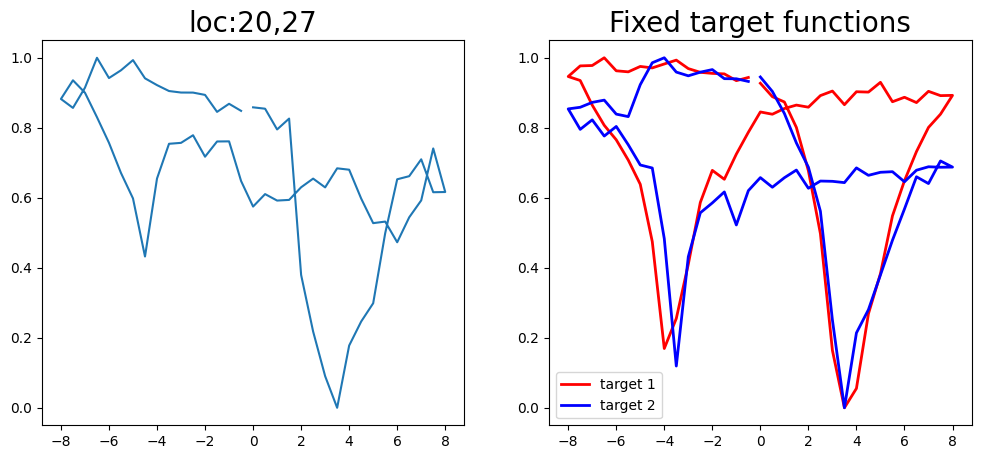

Epoch 1/200 ... Training loss: 3.4818
Epoch 10/200 ... Training loss: 3.0639
Epoch 20/200 ... Training loss: 2.3286
Epoch 30/200 ... Training loss: 2.0373
Epoch 40/200 ... Training loss: 1.6691
Epoch 50/200 ... Training loss: 1.5958
Epoch 60/200 ... Training loss: 1.4304
Epoch 70/200 ... Training loss: 1.2903
Epoch 80/200 ... Training loss: 1.1974
Epoch 90/200 ... Training loss: 1.2363
Epoch 100/200 ... Training loss: 1.3664
Epoch 110/200 ... Training loss: 1.1847
Epoch 120/200 ... Training loss: 1.0916
Epoch 130/200 ... Training loss: 1.0776
Epoch 140/200 ... Training loss: 1.0115
Epoch 150/200 ... Training loss: 0.9508
Epoch 160/200 ... Training loss: 0.9188
Epoch 170/200 ... Training loss: 0.8871
Epoch 180/200 ... Training loss: 0.8363
Epoch 190/200 ... Training loss: 0.7982
Epoch 200/200 ... Training loss: 0.8638
Epoch 1/200 ... Training loss: 2.6021
Epoch 10/200 ... Training loss: 2.5525
Epoch 20/200 ... Training loss: 2.1535
Epoch 30/200 ... Training loss: 1.9635
Epoch 40/200 ...

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


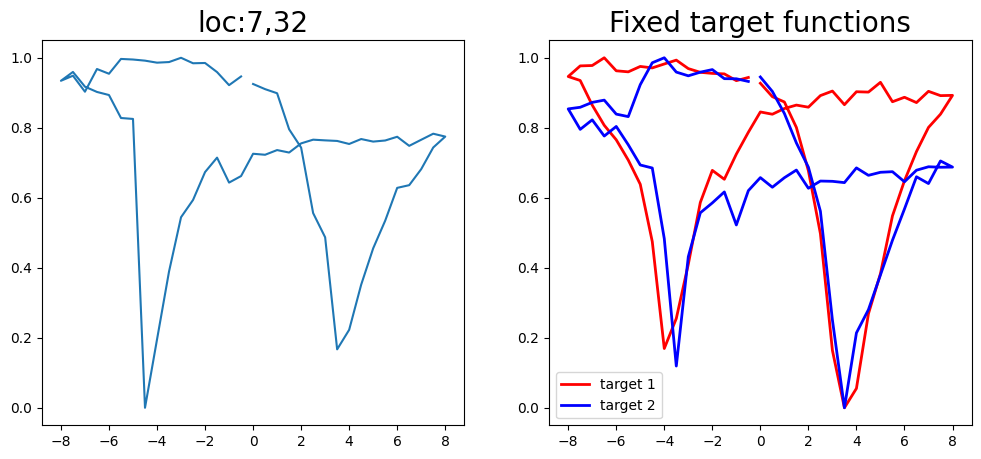

Epoch 1/200 ... Training loss: 3.481
Epoch 10/200 ... Training loss: 2.9648
Epoch 20/200 ... Training loss: 2.3361
Epoch 30/200 ... Training loss: 1.8776
Epoch 40/200 ... Training loss: 1.626
Epoch 50/200 ... Training loss: 1.6446
Epoch 60/200 ... Training loss: 1.4288
Epoch 70/200 ... Training loss: 1.3233
Epoch 80/200 ... Training loss: 1.2378
Epoch 90/200 ... Training loss: 1.1457
Epoch 100/200 ... Training loss: 1.0998
Epoch 110/200 ... Training loss: 1.0764
Epoch 120/200 ... Training loss: 1.0319
Epoch 130/200 ... Training loss: 1.0245
Epoch 140/200 ... Training loss: 0.9766
Epoch 150/200 ... Training loss: 0.9233
Epoch 160/200 ... Training loss: 0.8815
Epoch 170/200 ... Training loss: 1.0536
Epoch 180/200 ... Training loss: 0.895
Epoch 190/200 ... Training loss: 0.8267
Epoch 200/200 ... Training loss: 0.8026
Epoch 1/200 ... Training loss: 2.5931
Epoch 10/200 ... Training loss: 2.4768
Epoch 20/200 ... Training loss: 2.2455
Epoch 30/200 ... Training loss: 1.9163
Epoch 40/200 ... Tr

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


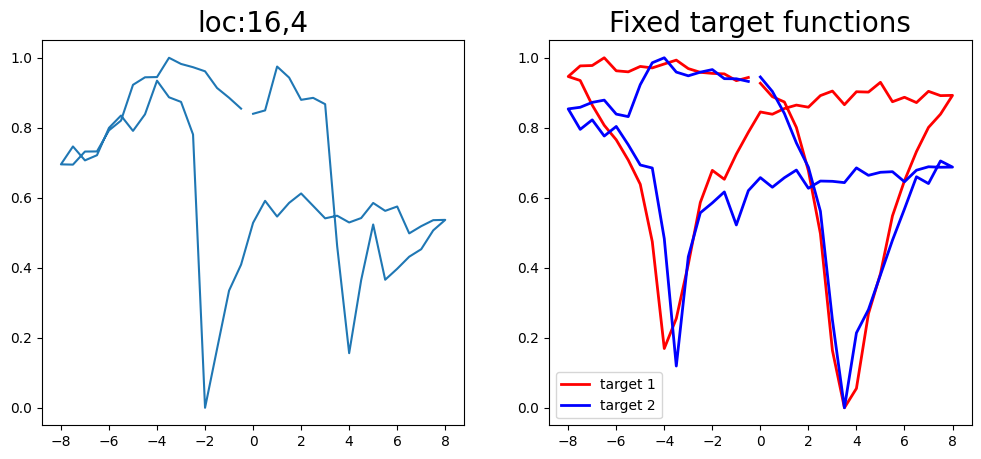

Epoch 1/200 ... Training loss: 3.5388
Epoch 10/200 ... Training loss: 2.9805
Epoch 20/200 ... Training loss: 2.2523
Epoch 30/200 ... Training loss: 1.8562
Epoch 40/200 ... Training loss: 1.5852
Epoch 50/200 ... Training loss: 1.4013
Epoch 60/200 ... Training loss: 1.2761
Epoch 70/200 ... Training loss: 1.3614
Epoch 80/200 ... Training loss: 1.201
Epoch 90/200 ... Training loss: 1.1667
Epoch 100/200 ... Training loss: 1.1197
Epoch 110/200 ... Training loss: 1.0585
Epoch 120/200 ... Training loss: 1.0085
Epoch 130/200 ... Training loss: 1.2992
Epoch 140/200 ... Training loss: 1.0622
Epoch 150/200 ... Training loss: 0.9692
Epoch 160/200 ... Training loss: 0.9302
Epoch 170/200 ... Training loss: 1.2467
Epoch 180/200 ... Training loss: 0.9508
Epoch 190/200 ... Training loss: 0.8382
Epoch 200/200 ... Training loss: 0.9874
Epoch 1/200 ... Training loss: 2.6321
Epoch 10/200 ... Training loss: 2.5738
Epoch 20/200 ... Training loss: 2.249
Epoch 30/200 ... Training loss: 2.0297
Epoch 40/200 ... T

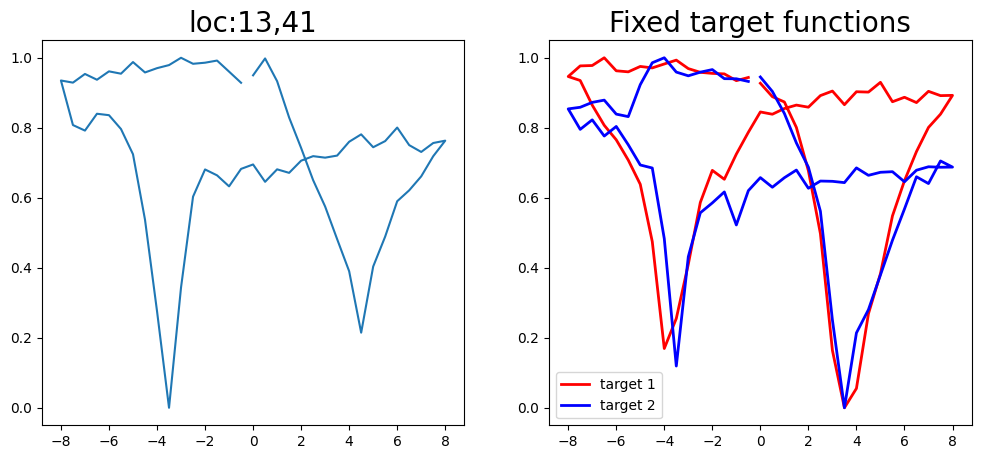

Epoch 1/200 ... Training loss: 3.5204
Epoch 10/200 ... Training loss: 3.2298
Epoch 20/200 ... Training loss: 2.5
Epoch 30/200 ... Training loss: 2.1046
Epoch 40/200 ... Training loss: 1.7898
Epoch 50/200 ... Training loss: 1.509
Epoch 60/200 ... Training loss: 1.7342
Epoch 70/200 ... Training loss: 1.428
Epoch 80/200 ... Training loss: 1.3112
Epoch 90/200 ... Training loss: 1.2325
Epoch 100/200 ... Training loss: 1.1818
Epoch 110/200 ... Training loss: 1.1699
Epoch 120/200 ... Training loss: 1.3219
Epoch 130/200 ... Training loss: 1.4074
Epoch 140/200 ... Training loss: 1.2761
Epoch 150/200 ... Training loss: 1.1558
Epoch 160/200 ... Training loss: 1.0734
Epoch 170/200 ... Training loss: 1.0214
Epoch 180/200 ... Training loss: 0.9959
Epoch 190/200 ... Training loss: 0.9606
Epoch 200/200 ... Training loss: 0.9871
Epoch 1/200 ... Training loss: 2.6213
Epoch 10/200 ... Training loss: 2.5166
Epoch 20/200 ... Training loss: 2.2989
Epoch 30/200 ... Training loss: 2.0305
Epoch 40/200 ... Trai

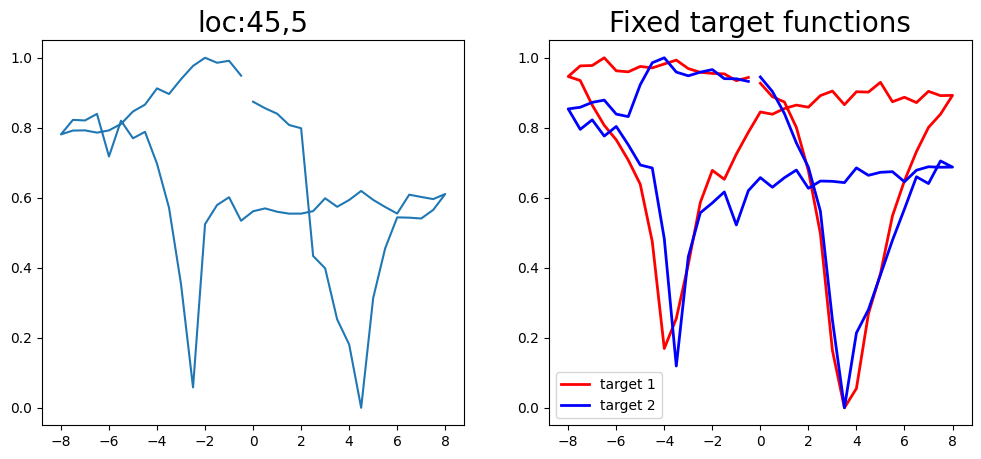

Epoch 1/200 ... Training loss: 3.4958
Epoch 10/200 ... Training loss: 2.9288
Epoch 20/200 ... Training loss: 2.248
Epoch 30/200 ... Training loss: 1.8762
Epoch 40/200 ... Training loss: 1.8298
Epoch 50/200 ... Training loss: 1.4047
Epoch 60/200 ... Training loss: 1.28
Epoch 70/200 ... Training loss: 1.2415
Epoch 80/200 ... Training loss: 1.1854
Epoch 90/200 ... Training loss: 1.1329
Epoch 100/200 ... Training loss: 1.0939
Epoch 110/200 ... Training loss: 1.0388
Epoch 120/200 ... Training loss: 1.0476
Epoch 130/200 ... Training loss: 0.9848
Epoch 140/200 ... Training loss: 0.9606
Epoch 150/200 ... Training loss: 1.0164
Epoch 160/200 ... Training loss: 0.9137
Epoch 170/200 ... Training loss: 0.8527
Epoch 180/200 ... Training loss: 0.8747
Epoch 190/200 ... Training loss: 0.8555
Epoch 200/200 ... Training loss: 0.7696
Epoch 1/200 ... Training loss: 2.6015
Epoch 10/200 ... Training loss: 2.4051
Epoch 20/200 ... Training loss: 1.9945
Epoch 30/200 ... Training loss: 1.7664
Epoch 40/200 ... Tr

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(
C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


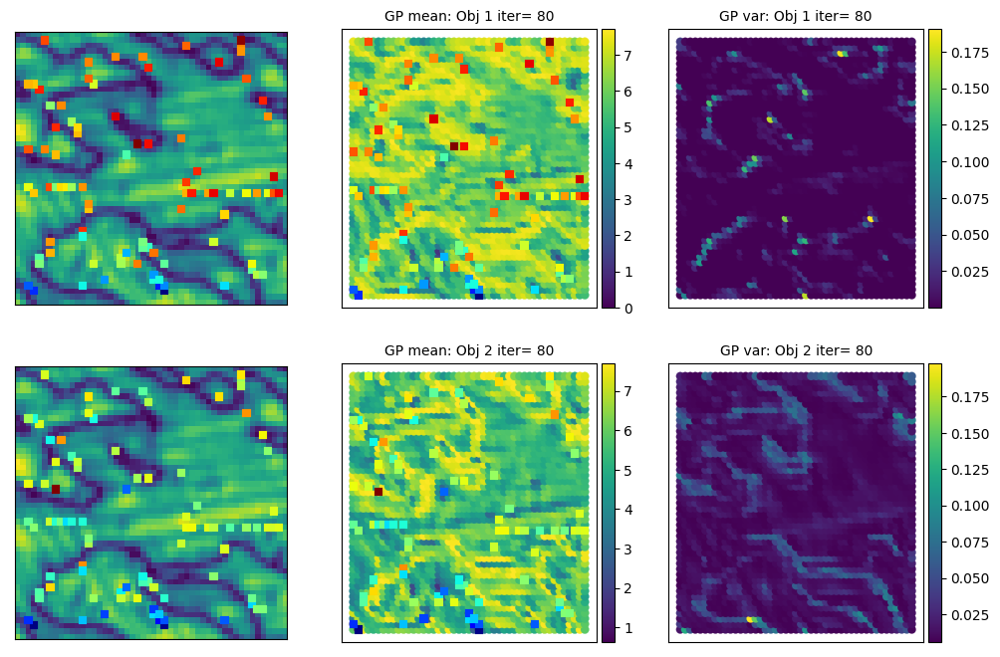

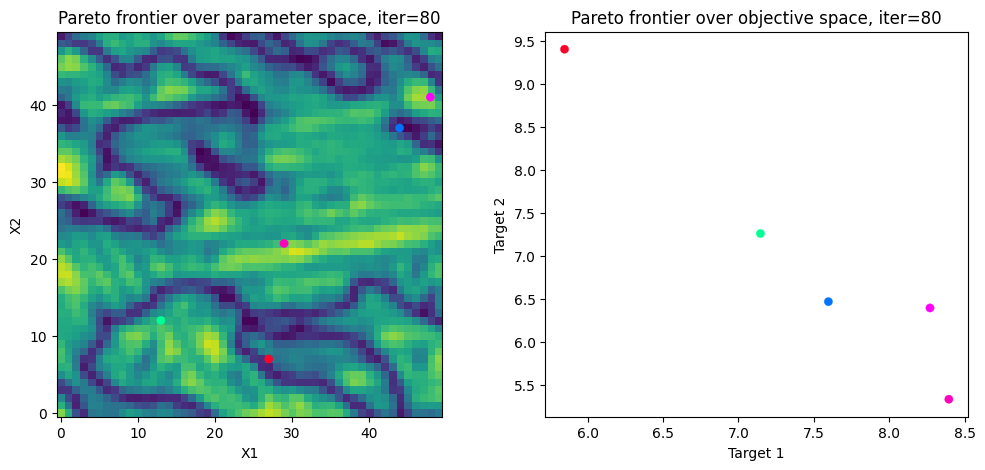

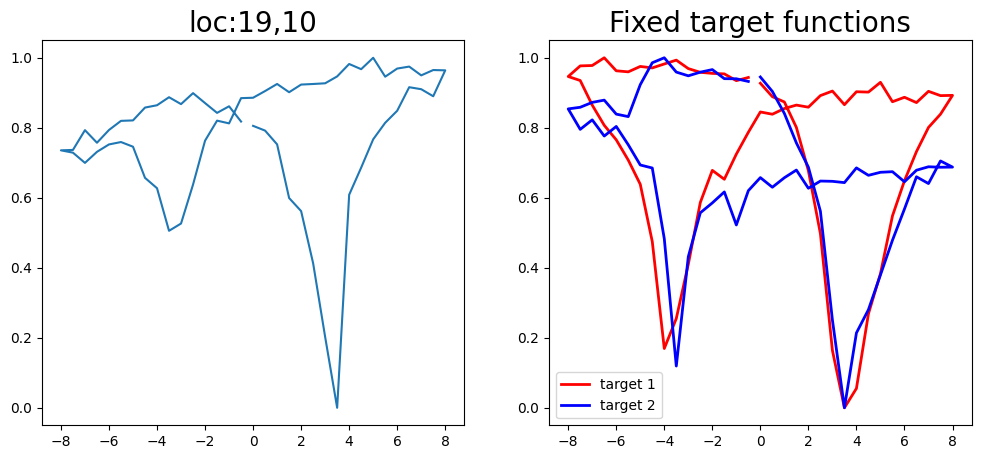

Epoch 1/200 ... Training loss: 3.4824
Epoch 10/200 ... Training loss: 2.8885
Epoch 20/200 ... Training loss: 2.2177
Epoch 30/200 ... Training loss: 1.9885
Epoch 40/200 ... Training loss: 1.8053
Epoch 50/200 ... Training loss: 1.5926
Epoch 60/200 ... Training loss: 1.4451
Epoch 70/200 ... Training loss: 1.3645
Epoch 80/200 ... Training loss: 1.2899
Epoch 90/200 ... Training loss: 1.2158
Epoch 100/200 ... Training loss: 1.3064
Epoch 110/200 ... Training loss: 1.1703
Epoch 120/200 ... Training loss: 1.0752
Epoch 130/200 ... Training loss: 1.1074
Epoch 140/200 ... Training loss: 0.9861
Epoch 150/200 ... Training loss: 1.0511
Epoch 160/200 ... Training loss: 0.9919
Epoch 170/200 ... Training loss: 0.9307
Epoch 180/200 ... Training loss: 0.8971
Epoch 190/200 ... Training loss: 0.8438
Epoch 200/200 ... Training loss: 0.7636
Epoch 1/200 ... Training loss: 2.6057
Epoch 10/200 ... Training loss: 2.3765
Epoch 20/200 ... Training loss: 1.9484
Epoch 30/200 ... Training loss: 1.7294
Epoch 40/200 ...

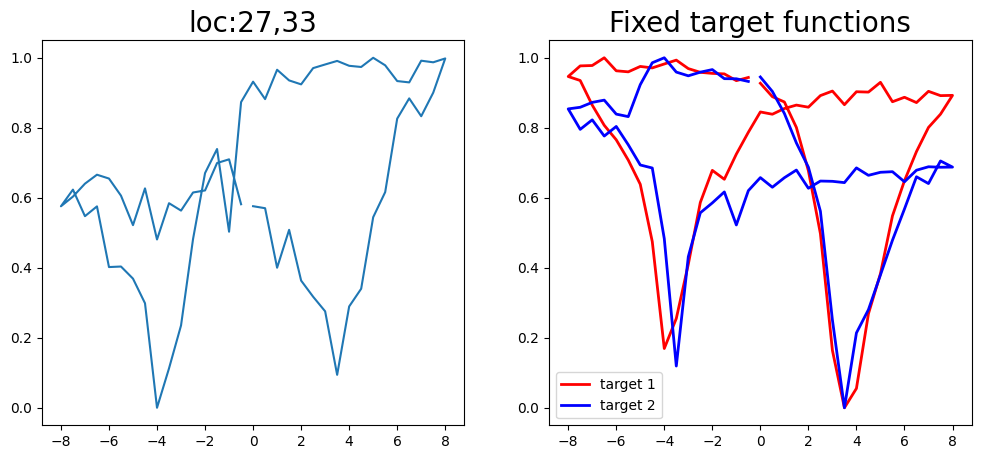

Epoch 1/200 ... Training loss: 3.4642
Epoch 10/200 ... Training loss: 2.9281
Epoch 20/200 ... Training loss: 2.4991
Epoch 30/200 ... Training loss: 2.1713
Epoch 40/200 ... Training loss: 2.0728
Epoch 50/200 ... Training loss: 1.7151
Epoch 60/200 ... Training loss: 1.4814
Epoch 70/200 ... Training loss: 1.4453
Epoch 80/200 ... Training loss: 1.4473
Epoch 90/200 ... Training loss: 1.4002
Epoch 100/200 ... Training loss: 1.2703
Epoch 110/200 ... Training loss: 1.1885
Epoch 120/200 ... Training loss: 1.1368
Epoch 130/200 ... Training loss: 1.0902
Epoch 140/200 ... Training loss: 1.116
Epoch 150/200 ... Training loss: 1.1536
Epoch 160/200 ... Training loss: 1.3053
Epoch 170/200 ... Training loss: 1.1014
Epoch 180/200 ... Training loss: 1.0385
Epoch 190/200 ... Training loss: 0.9571
Epoch 200/200 ... Training loss: 0.9654
Epoch 1/200 ... Training loss: 2.5854
Epoch 10/200 ... Training loss: 2.2656
Epoch 20/200 ... Training loss: 1.8534
Epoch 30/200 ... Training loss: 1.7577
Epoch 40/200 ... 

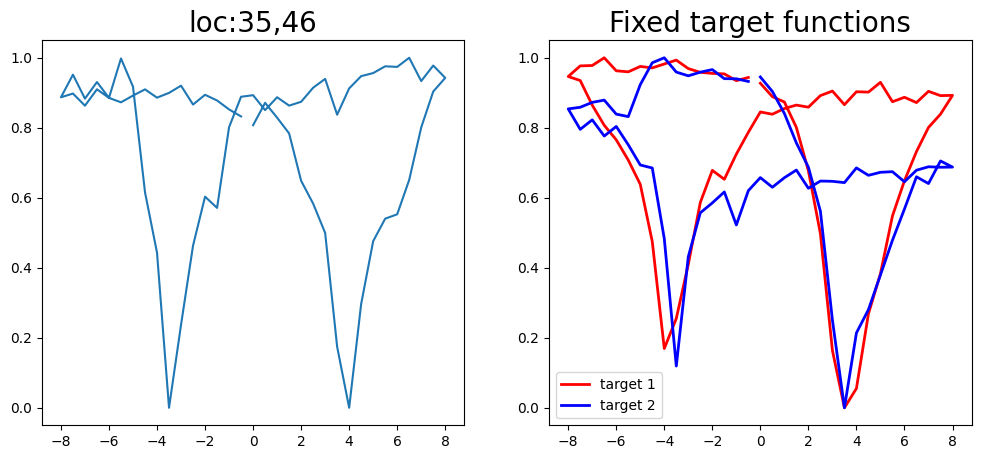

Epoch 1/200 ... Training loss: 3.4516
Epoch 10/200 ... Training loss: 2.7891
Epoch 20/200 ... Training loss: 2.0266
Epoch 30/200 ... Training loss: 1.6524
Epoch 40/200 ... Training loss: 1.6004
Epoch 50/200 ... Training loss: 1.784
Epoch 60/200 ... Training loss: 1.5236
Epoch 70/200 ... Training loss: 1.5437
Epoch 80/200 ... Training loss: 1.4888
Epoch 90/200 ... Training loss: 1.2842
Epoch 100/200 ... Training loss: 1.1845
Epoch 110/200 ... Training loss: 1.1275
Epoch 120/200 ... Training loss: 1.1604
Epoch 130/200 ... Training loss: 1.074
Epoch 140/200 ... Training loss: 1.0142
Epoch 150/200 ... Training loss: 0.9471
Epoch 160/200 ... Training loss: 0.9241
Epoch 170/200 ... Training loss: 0.9036
Epoch 180/200 ... Training loss: 0.8403
Epoch 190/200 ... Training loss: 0.7881
Epoch 200/200 ... Training loss: 0.7275
Epoch 1/200 ... Training loss: 2.5665
Epoch 10/200 ... Training loss: 2.4207
Epoch 20/200 ... Training loss: 2.1682
Epoch 30/200 ... Training loss: 1.9751
Epoch 40/200 ... T

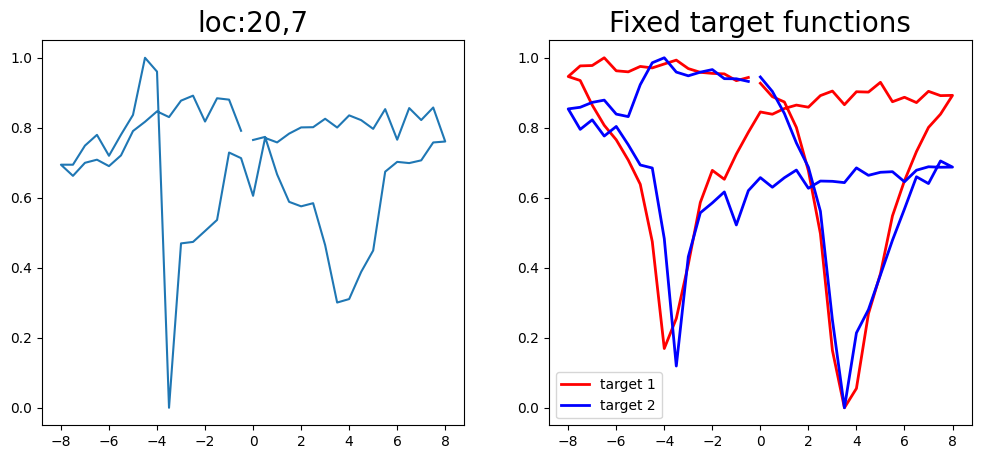

Epoch 1/200 ... Training loss: 3.4424
Epoch 10/200 ... Training loss: 3.0909
Epoch 20/200 ... Training loss: 2.4625
Epoch 30/200 ... Training loss: 2.4014
Epoch 40/200 ... Training loss: 2.086
Epoch 50/200 ... Training loss: 1.7028
Epoch 60/200 ... Training loss: 1.4913
Epoch 70/200 ... Training loss: 1.3666
Epoch 80/200 ... Training loss: 1.2542
Epoch 90/200 ... Training loss: 1.206
Epoch 100/200 ... Training loss: 1.1531
Epoch 110/200 ... Training loss: 1.1668
Epoch 120/200 ... Training loss: 1.1285
Epoch 130/200 ... Training loss: 1.0697
Epoch 140/200 ... Training loss: 1.0095
Epoch 150/200 ... Training loss: 0.9722
Epoch 160/200 ... Training loss: 0.9861
Epoch 170/200 ... Training loss: 1.0089
Epoch 180/200 ... Training loss: 0.8849
Epoch 190/200 ... Training loss: 0.9374
Epoch 200/200 ... Training loss: 1.5251
Epoch 1/200 ... Training loss: 2.5469
Epoch 10/200 ... Training loss: 2.4169
Epoch 20/200 ... Training loss: 2.1551
Epoch 30/200 ... Training loss: 1.9367
Epoch 40/200 ... T

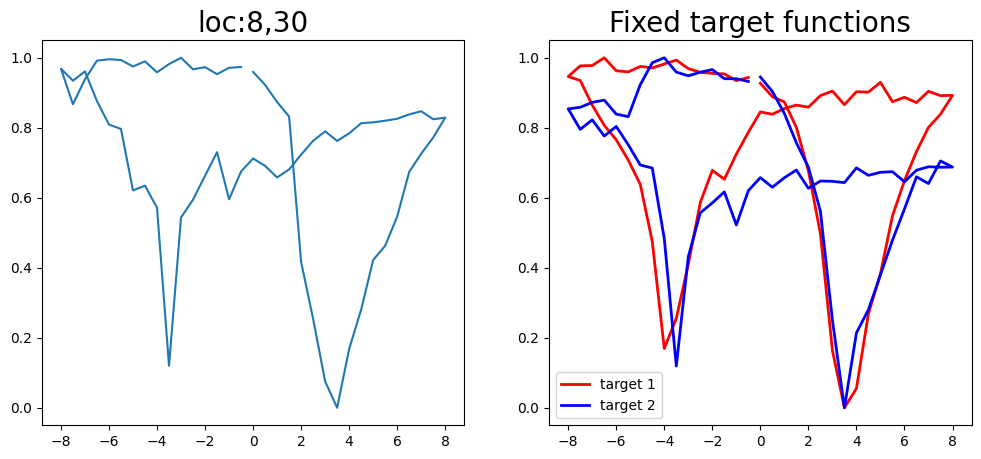

Epoch 1/200 ... Training loss: 3.4341
Epoch 10/200 ... Training loss: 3.0998
Epoch 20/200 ... Training loss: 2.4895
Epoch 30/200 ... Training loss: 2.2939
Epoch 40/200 ... Training loss: 1.8872
Epoch 50/200 ... Training loss: 1.5803
Epoch 60/200 ... Training loss: 1.5019
Epoch 70/200 ... Training loss: 1.3639
Epoch 80/200 ... Training loss: 1.2519
Epoch 90/200 ... Training loss: 1.1837
Epoch 100/200 ... Training loss: 1.1653
Epoch 110/200 ... Training loss: 1.1139
Epoch 120/200 ... Training loss: 1.1026
Epoch 130/200 ... Training loss: 1.1013
Epoch 140/200 ... Training loss: 1.0307
Epoch 150/200 ... Training loss: 0.9732
Epoch 160/200 ... Training loss: 0.9619
Epoch 170/200 ... Training loss: 0.9174
Epoch 180/200 ... Training loss: 0.8706
Epoch 190/200 ... Training loss: 1.0398
Epoch 200/200 ... Training loss: 0.9181
Epoch 1/200 ... Training loss: 2.5435
Epoch 10/200 ... Training loss: 2.3463
Epoch 20/200 ... Training loss: 2.2101
Epoch 30/200 ... Training loss: 2.0068
Epoch 40/200 ...

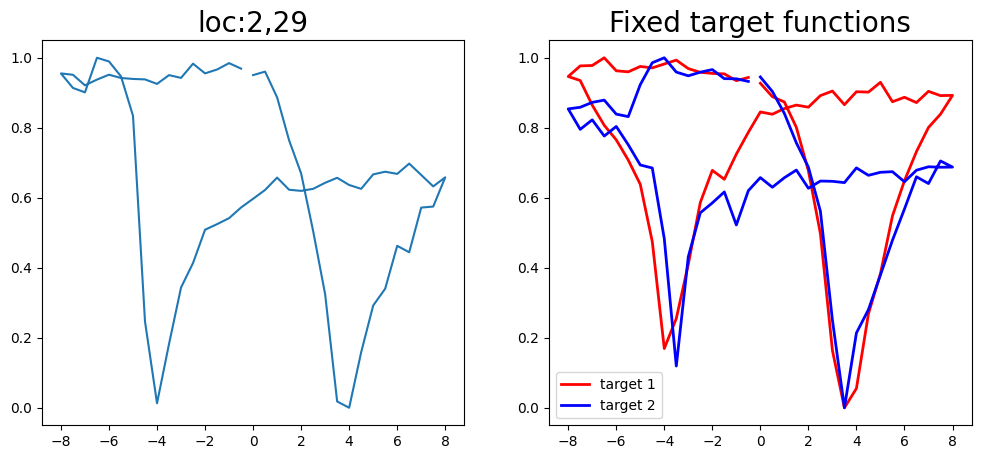

Epoch 1/200 ... Training loss: 3.4158
Epoch 10/200 ... Training loss: 2.8914
Epoch 20/200 ... Training loss: 2.7788
Epoch 30/200 ... Training loss: 2.4147
Epoch 40/200 ... Training loss: 2.0442
Epoch 50/200 ... Training loss: 1.7013
Epoch 60/200 ... Training loss: 1.4872
Epoch 70/200 ... Training loss: 1.6328
Epoch 80/200 ... Training loss: 1.484
Epoch 90/200 ... Training loss: 1.3589
Epoch 100/200 ... Training loss: 1.2665
Epoch 110/200 ... Training loss: 1.1809
Epoch 120/200 ... Training loss: 1.2069
Epoch 130/200 ... Training loss: 1.1331
Epoch 140/200 ... Training loss: 1.0812
Epoch 150/200 ... Training loss: 1.0523
Epoch 160/200 ... Training loss: 1.029
Epoch 170/200 ... Training loss: 0.999
Epoch 180/200 ... Training loss: 0.9723
Epoch 190/200 ... Training loss: 0.9349
Epoch 200/200 ... Training loss: 0.9125
Epoch 1/200 ... Training loss: 2.5276
Epoch 10/200 ... Training loss: 2.4634
Epoch 20/200 ... Training loss: 2.2755
Epoch 30/200 ... Training loss: 2.1552
Epoch 40/200 ... Tr

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


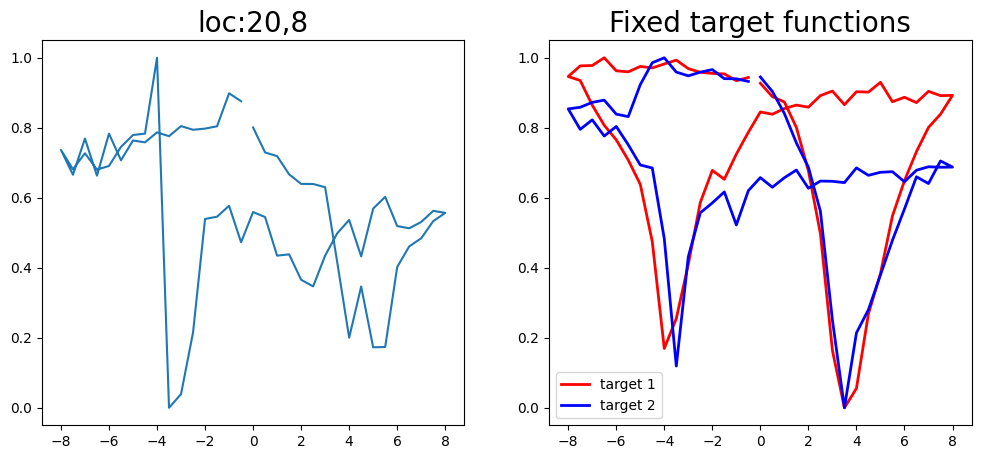

Epoch 1/200 ... Training loss: 3.4575
Epoch 10/200 ... Training loss: 3.0702
Epoch 20/200 ... Training loss: 2.637
Epoch 30/200 ... Training loss: 2.0971
Epoch 40/200 ... Training loss: 2.3177
Epoch 50/200 ... Training loss: 1.7556
Epoch 60/200 ... Training loss: 1.5055
Epoch 70/200 ... Training loss: 1.4105
Epoch 80/200 ... Training loss: 2.0743
Epoch 90/200 ... Training loss: 1.5365
Epoch 100/200 ... Training loss: 1.3267
Epoch 110/200 ... Training loss: 1.2678
Epoch 120/200 ... Training loss: 1.1977
Epoch 130/200 ... Training loss: 1.1431
Epoch 140/200 ... Training loss: 1.1223
Epoch 150/200 ... Training loss: 1.0714
Epoch 160/200 ... Training loss: 1.0368
Epoch 170/200 ... Training loss: 1.0033
Epoch 180/200 ... Training loss: 1.08
Epoch 190/200 ... Training loss: 0.9786
Epoch 200/200 ... Training loss: 0.9295
Epoch 1/200 ... Training loss: 2.5219
Epoch 10/200 ... Training loss: 2.4368
Epoch 20/200 ... Training loss: 2.2063
Epoch 30/200 ... Training loss: 1.9678
Epoch 40/200 ... Tr

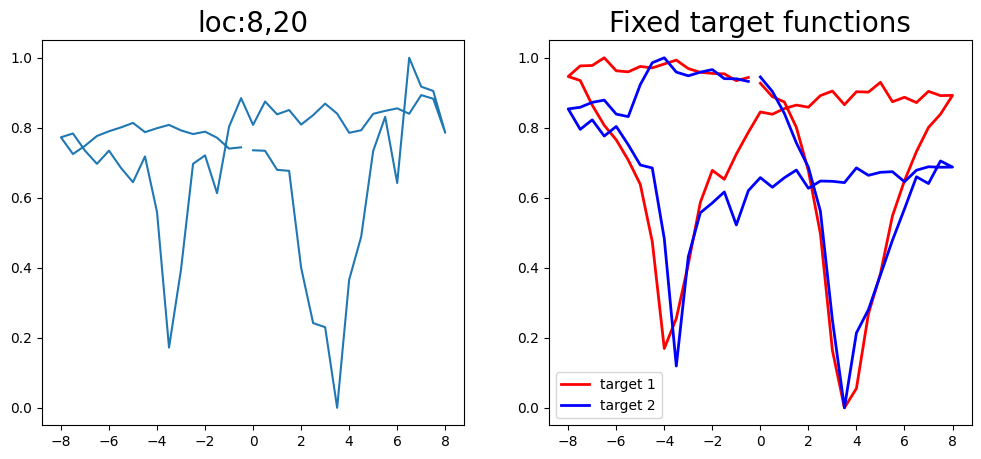

Epoch 1/200 ... Training loss: 3.4302
Epoch 10/200 ... Training loss: 3.119
Epoch 20/200 ... Training loss: 2.9837
Epoch 30/200 ... Training loss: 2.1005
Epoch 40/200 ... Training loss: 2.3776
Epoch 50/200 ... Training loss: 2.0701
Epoch 60/200 ... Training loss: 1.7103
Epoch 70/200 ... Training loss: 1.6466
Epoch 80/200 ... Training loss: 1.4592
Epoch 90/200 ... Training loss: 1.3099
Epoch 100/200 ... Training loss: 1.3064
Epoch 110/200 ... Training loss: 1.2392
Epoch 120/200 ... Training loss: 1.1699
Epoch 130/200 ... Training loss: 1.1327
Epoch 140/200 ... Training loss: 1.1791
Epoch 150/200 ... Training loss: 1.0865
Epoch 160/200 ... Training loss: 1.0465
Epoch 170/200 ... Training loss: 1.0132
Epoch 180/200 ... Training loss: 0.9871
Epoch 190/200 ... Training loss: 0.9603
Epoch 200/200 ... Training loss: 0.9723
Epoch 1/200 ... Training loss: 2.5055
Epoch 10/200 ... Training loss: 2.4041
Epoch 20/200 ... Training loss: 2.1772
Epoch 30/200 ... Training loss: 1.8914
Epoch 40/200 ... 

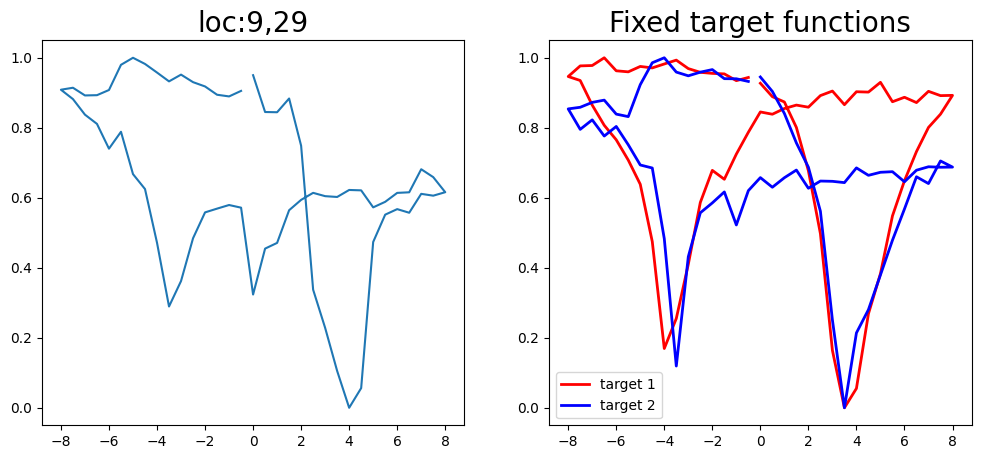

Epoch 1/200 ... Training loss: 3.4032
Epoch 10/200 ... Training loss: 2.9989
Epoch 20/200 ... Training loss: 2.4262
Epoch 30/200 ... Training loss: 2.6377
Epoch 40/200 ... Training loss: 2.2394
Epoch 50/200 ... Training loss: 1.6902
Epoch 60/200 ... Training loss: 1.5282
Epoch 70/200 ... Training loss: 1.4662
Epoch 80/200 ... Training loss: 1.3431
Epoch 90/200 ... Training loss: 1.2557
Epoch 100/200 ... Training loss: 1.2238
Epoch 110/200 ... Training loss: 1.188
Epoch 120/200 ... Training loss: 1.1787
Epoch 130/200 ... Training loss: 1.1151
Epoch 140/200 ... Training loss: 1.1426
Epoch 150/200 ... Training loss: 1.1137
Epoch 160/200 ... Training loss: 1.0314
Epoch 170/200 ... Training loss: 1.0371
Epoch 180/200 ... Training loss: 1.1055
Epoch 190/200 ... Training loss: 1.0004
Epoch 200/200 ... Training loss: 0.9255
Epoch 1/200 ... Training loss: 2.4911
Epoch 10/200 ... Training loss: 2.41
Epoch 20/200 ... Training loss: 2.2158
Epoch 30/200 ... Training loss: 1.9655
Epoch 40/200 ... Tr

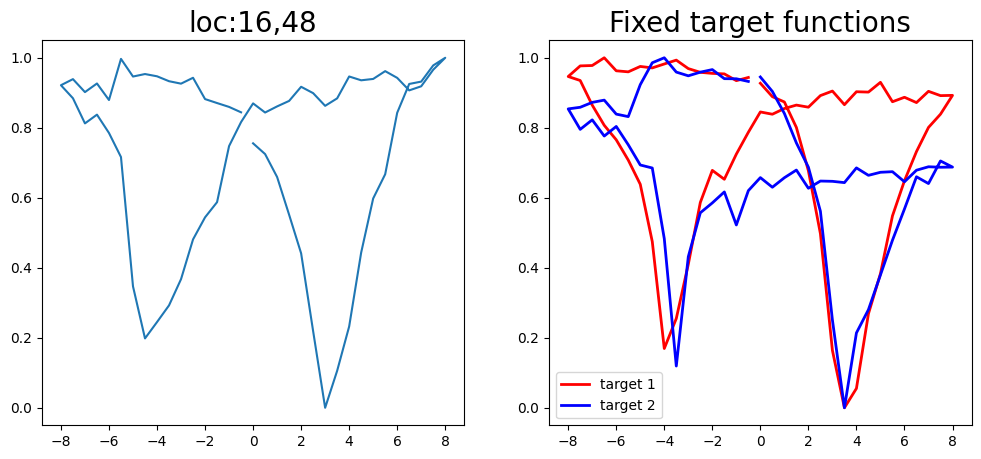

Epoch 1/200 ... Training loss: 3.3941
Epoch 10/200 ... Training loss: 3.0003
Epoch 20/200 ... Training loss: 2.4572
Epoch 30/200 ... Training loss: 1.9952
Epoch 40/200 ... Training loss: 1.7414
Epoch 50/200 ... Training loss: 1.4792
Epoch 60/200 ... Training loss: 1.5257
Epoch 70/200 ... Training loss: 1.37
Epoch 80/200 ... Training loss: 1.2447
Epoch 90/200 ... Training loss: 1.1863
Epoch 100/200 ... Training loss: 1.2631
Epoch 110/200 ... Training loss: 1.1578
Epoch 120/200 ... Training loss: 1.1067
Epoch 130/200 ... Training loss: 1.0558
Epoch 140/200 ... Training loss: 1.1103
Epoch 150/200 ... Training loss: 1.0055
Epoch 160/200 ... Training loss: 0.9636
Epoch 170/200 ... Training loss: 0.9347
Epoch 180/200 ... Training loss: 0.9445
Epoch 190/200 ... Training loss: 0.8743
Epoch 200/200 ... Training loss: 0.8588
Epoch 1/200 ... Training loss: 2.4768
Epoch 10/200 ... Training loss: 2.3935
Epoch 20/200 ... Training loss: 2.1979
Epoch 30/200 ... Training loss: 1.9708
Epoch 40/200 ... T

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(
C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


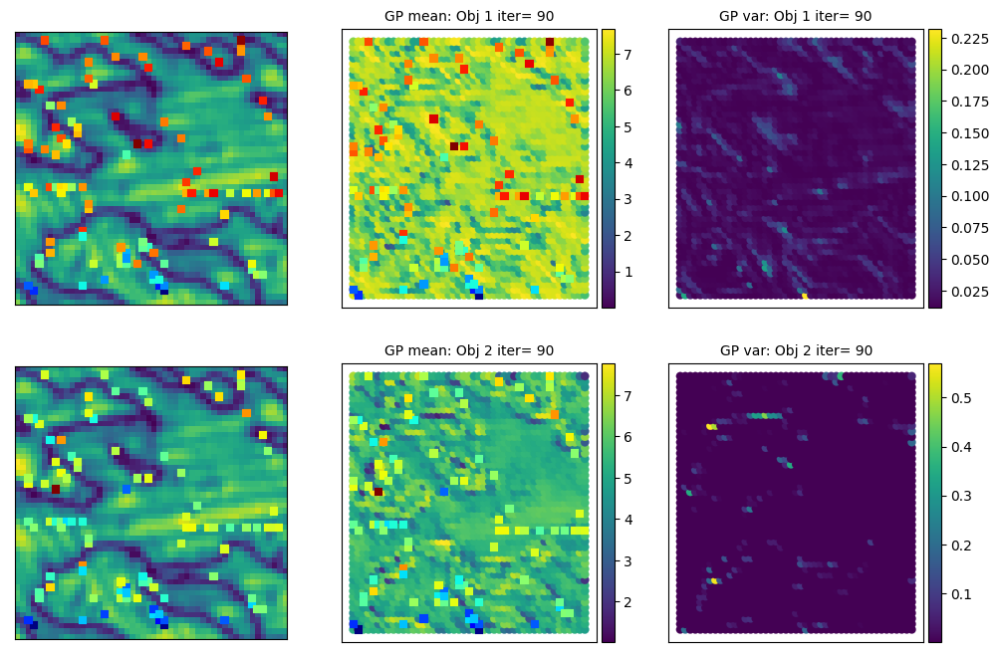

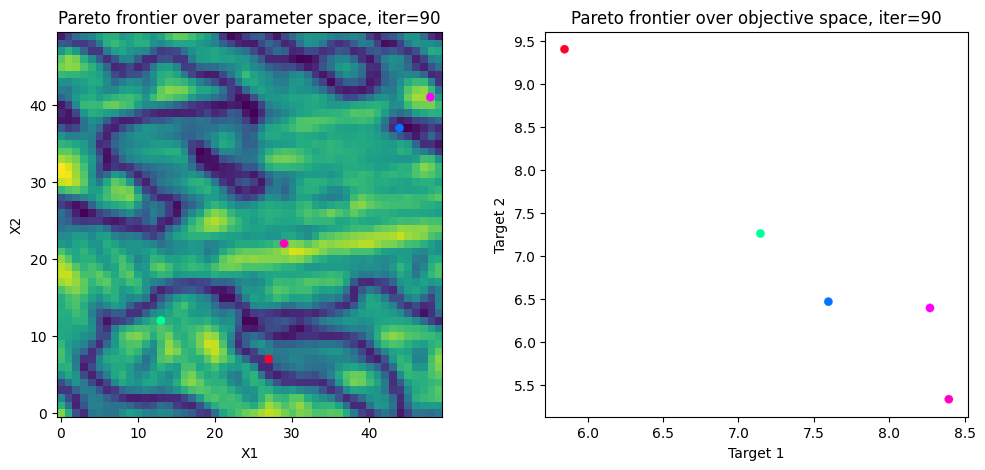

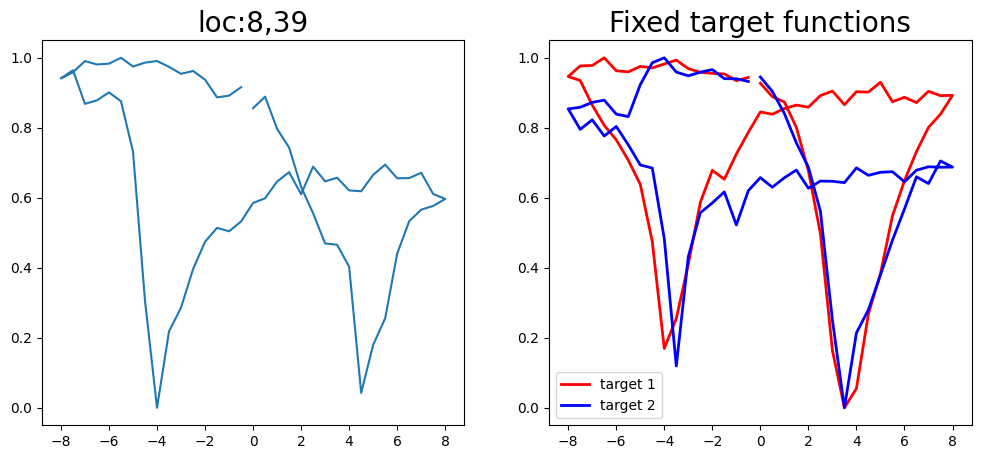

Epoch 1/200 ... Training loss: 3.3755
Epoch 10/200 ... Training loss: 3.1002
Epoch 20/200 ... Training loss: 2.5304
Epoch 30/200 ... Training loss: 2.5692
Epoch 40/200 ... Training loss: 2.2269
Epoch 50/200 ... Training loss: 2.1213
Epoch 60/200 ... Training loss: 1.7364
Epoch 70/200 ... Training loss: 1.4916
Epoch 80/200 ... Training loss: 1.4263
Epoch 90/200 ... Training loss: 1.395
Epoch 100/200 ... Training loss: 1.3126
Epoch 110/200 ... Training loss: 1.2916
Epoch 120/200 ... Training loss: 1.2788
Epoch 130/200 ... Training loss: 1.1823
Epoch 140/200 ... Training loss: 1.1331
Epoch 150/200 ... Training loss: 1.0924
Epoch 160/200 ... Training loss: 1.1194
Epoch 170/200 ... Training loss: 1.0391
Epoch 180/200 ... Training loss: 0.9998
Epoch 190/200 ... Training loss: 0.9652
Epoch 200/200 ... Training loss: 0.9306
Epoch 1/200 ... Training loss: 2.4599
Epoch 10/200 ... Training loss: 2.3806
Epoch 20/200 ... Training loss: 2.1725
Epoch 30/200 ... Training loss: 1.9828
Epoch 40/200 ... 

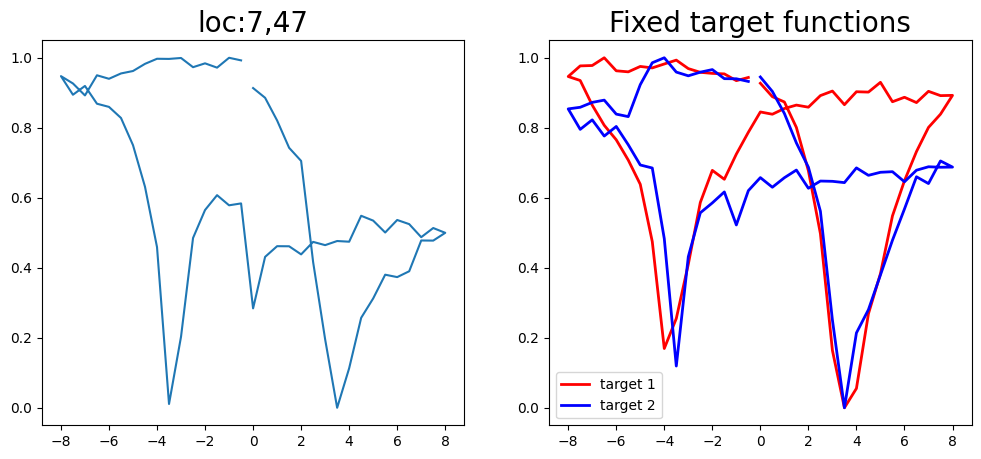

Epoch 1/200 ... Training loss: 3.3504
Epoch 10/200 ... Training loss: 3.0616
Epoch 20/200 ... Training loss: 2.512
Epoch 30/200 ... Training loss: 2.5035
Epoch 40/200 ... Training loss: 2.1694
Epoch 50/200 ... Training loss: 1.7582
Epoch 60/200 ... Training loss: 1.4768
Epoch 70/200 ... Training loss: 1.4607
Epoch 80/200 ... Training loss: 1.4068
Epoch 90/200 ... Training loss: 1.2947
Epoch 100/200 ... Training loss: 1.2289
Epoch 110/200 ... Training loss: 1.1755
Epoch 120/200 ... Training loss: 1.1546
Epoch 130/200 ... Training loss: 1.3508
Epoch 140/200 ... Training loss: 1.2221
Epoch 150/200 ... Training loss: 1.1183
Epoch 160/200 ... Training loss: 1.047
Epoch 170/200 ... Training loss: 1.0142
Epoch 180/200 ... Training loss: 1.0573
Epoch 190/200 ... Training loss: 0.9978
Epoch 200/200 ... Training loss: 0.9729
Epoch 1/200 ... Training loss: 2.4507
Epoch 10/200 ... Training loss: 2.3856
Epoch 20/200 ... Training loss: 2.1503
Epoch 30/200 ... Training loss: 2.0324
Epoch 40/200 ... T

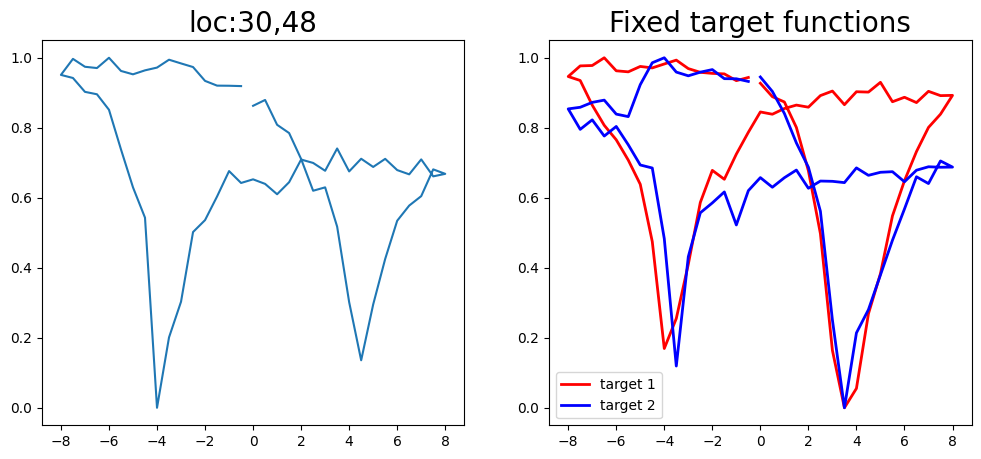

Epoch 1/200 ... Training loss: 3.3324
Epoch 10/200 ... Training loss: 3.0605
Epoch 20/200 ... Training loss: 2.4838
Epoch 30/200 ... Training loss: 2.4417
Epoch 40/200 ... Training loss: 2.2276
Epoch 50/200 ... Training loss: 1.8829
Epoch 60/200 ... Training loss: 1.7164
Epoch 70/200 ... Training loss: 1.8358
Epoch 80/200 ... Training loss: 1.5501
Epoch 90/200 ... Training loss: 1.3621
Epoch 100/200 ... Training loss: 1.2837
Epoch 110/200 ... Training loss: 1.2125
Epoch 120/200 ... Training loss: 1.2041
Epoch 130/200 ... Training loss: 1.2323
Epoch 140/200 ... Training loss: 1.1357
Epoch 150/200 ... Training loss: 1.0965
Epoch 160/200 ... Training loss: 1.06
Epoch 170/200 ... Training loss: 1.025
Epoch 180/200 ... Training loss: 1.0225
Epoch 190/200 ... Training loss: 0.9746
Epoch 200/200 ... Training loss: 1.0168
Epoch 1/200 ... Training loss: 2.4344
Epoch 10/200 ... Training loss: 2.4313
Epoch 20/200 ... Training loss: 2.2101
Epoch 30/200 ... Training loss: 2.0353
Epoch 40/200 ... Tr

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


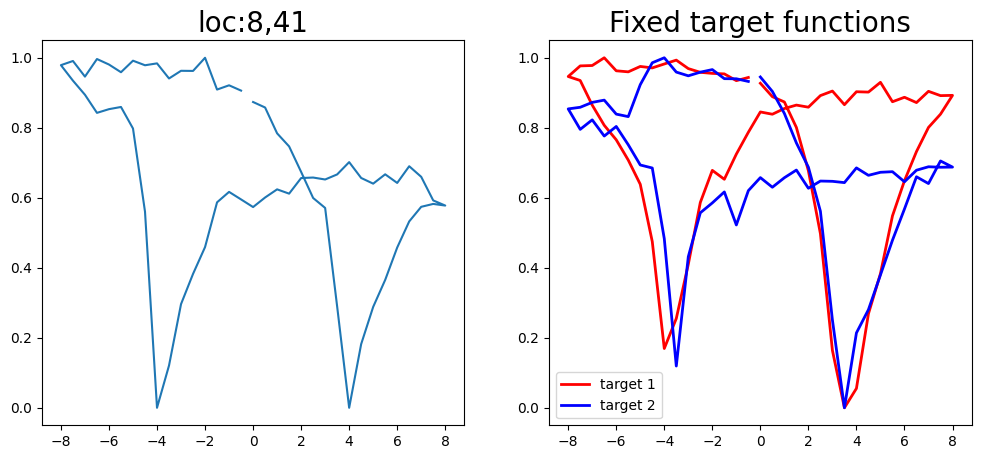

Epoch 1/200 ... Training loss: 3.3161
Epoch 10/200 ... Training loss: 2.8912
Epoch 20/200 ... Training loss: 2.4144
Epoch 30/200 ... Training loss: 2.5975
Epoch 40/200 ... Training loss: 2.0405
Epoch 50/200 ... Training loss: 1.6414
Epoch 60/200 ... Training loss: 1.435
Epoch 70/200 ... Training loss: 1.5061
Epoch 80/200 ... Training loss: 1.3106
Epoch 90/200 ... Training loss: 1.2413
Epoch 100/200 ... Training loss: 1.1917
Epoch 110/200 ... Training loss: 1.1427
Epoch 120/200 ... Training loss: 1.154
Epoch 130/200 ... Training loss: 1.1275
Epoch 140/200 ... Training loss: 1.1116
Epoch 150/200 ... Training loss: 1.0625
Epoch 160/200 ... Training loss: 1.012
Epoch 170/200 ... Training loss: 0.9641
Epoch 180/200 ... Training loss: 0.9274
Epoch 190/200 ... Training loss: 0.9345
Epoch 200/200 ... Training loss: 0.9359
Epoch 1/200 ... Training loss: 2.423
Epoch 10/200 ... Training loss: 2.3495
Epoch 20/200 ... Training loss: 2.1809
Epoch 30/200 ... Training loss: 1.9703
Epoch 40/200 ... Tra

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


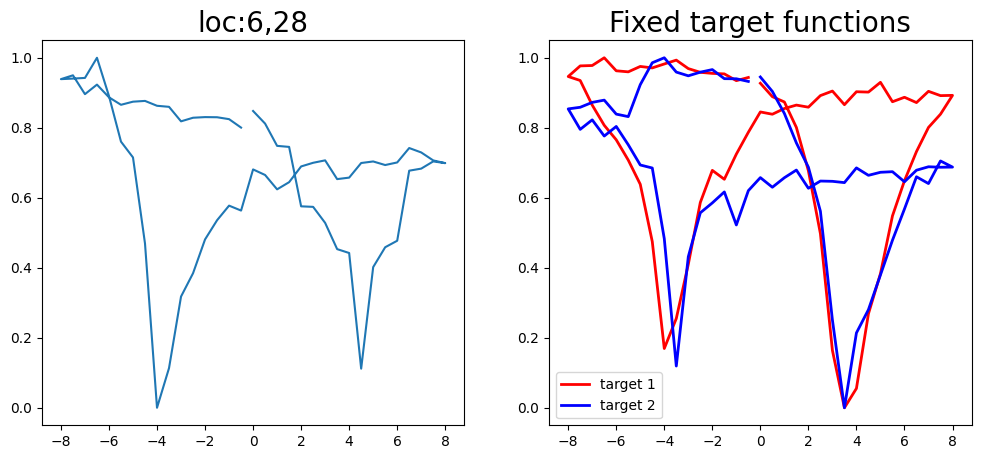

Epoch 1/200 ... Training loss: 3.3012
Epoch 10/200 ... Training loss: 2.8642
Epoch 20/200 ... Training loss: 2.9016
Epoch 30/200 ... Training loss: 2.4028
Epoch 40/200 ... Training loss: 2.1545
Epoch 50/200 ... Training loss: 1.9044
Epoch 60/200 ... Training loss: 1.7003
Epoch 70/200 ... Training loss: 1.4585
Epoch 80/200 ... Training loss: 1.551
Epoch 90/200 ... Training loss: 1.3554
Epoch 100/200 ... Training loss: 1.3216
Epoch 110/200 ... Training loss: 1.3524
Epoch 120/200 ... Training loss: 1.2368
Epoch 130/200 ... Training loss: 1.1566
Epoch 140/200 ... Training loss: 1.1078
Epoch 150/200 ... Training loss: 1.0834
Epoch 160/200 ... Training loss: 1.0266
Epoch 170/200 ... Training loss: 0.9893
Epoch 180/200 ... Training loss: 0.993
Epoch 190/200 ... Training loss: 1.0138
Epoch 200/200 ... Training loss: 0.9324
Epoch 1/200 ... Training loss: 2.4069
Epoch 10/200 ... Training loss: 2.3368
Epoch 20/200 ... Training loss: 2.1685
Epoch 30/200 ... Training loss: 1.969
Epoch 40/200 ... Tr

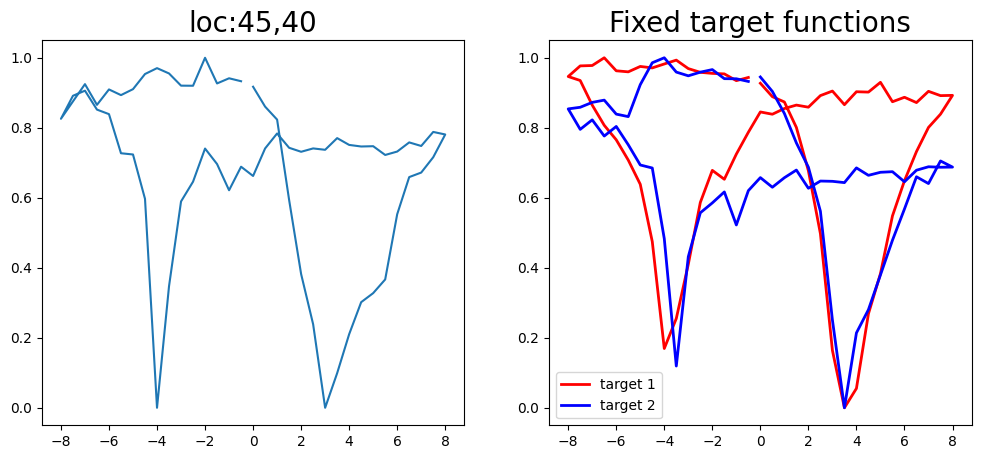

Epoch 1/200 ... Training loss: 3.2823
Epoch 10/200 ... Training loss: 3.0205
Epoch 20/200 ... Training loss: 2.8721
Epoch 30/200 ... Training loss: 2.4778
Epoch 40/200 ... Training loss: 1.9151
Epoch 50/200 ... Training loss: 2.2305
Epoch 60/200 ... Training loss: 2.0826
Epoch 70/200 ... Training loss: 1.7018
Epoch 80/200 ... Training loss: 1.6921
Epoch 90/200 ... Training loss: 1.638
Epoch 100/200 ... Training loss: 1.5456
Epoch 110/200 ... Training loss: 1.3795
Epoch 120/200 ... Training loss: 1.3023
Epoch 130/200 ... Training loss: 1.346
Epoch 140/200 ... Training loss: 1.2447
Epoch 150/200 ... Training loss: 1.17
Epoch 160/200 ... Training loss: 1.1661
Epoch 170/200 ... Training loss: 1.1107
Epoch 180/200 ... Training loss: 1.1424
Epoch 190/200 ... Training loss: 1.4652
Epoch 200/200 ... Training loss: 1.182
Epoch 1/200 ... Training loss: 2.4071
Epoch 10/200 ... Training loss: 2.3315
Epoch 20/200 ... Training loss: 2.0661
Epoch 30/200 ... Training loss: 1.943
Epoch 40/200 ... Train

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


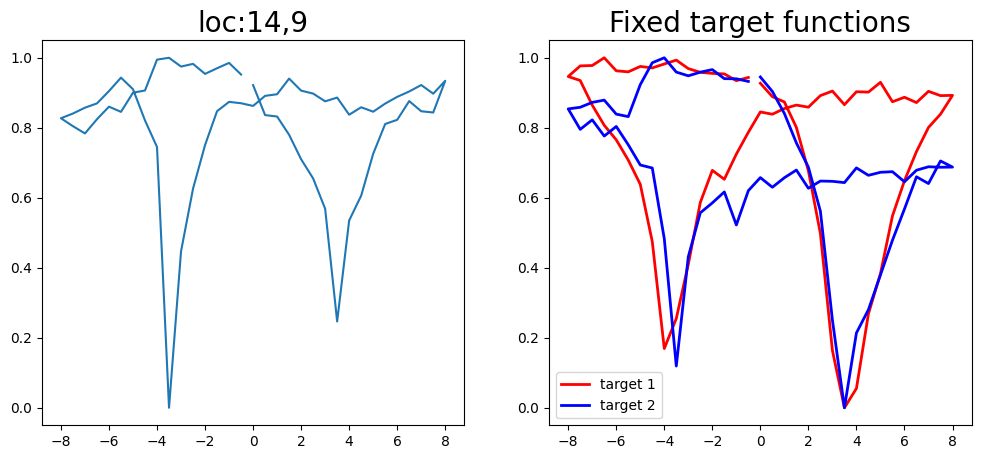

Epoch 1/200 ... Training loss: 3.2635
Epoch 10/200 ... Training loss: 2.6016
Epoch 20/200 ... Training loss: 2.6621
Epoch 30/200 ... Training loss: 2.4377
Epoch 40/200 ... Training loss: 2.0161
Epoch 50/200 ... Training loss: 1.6254
Epoch 60/200 ... Training loss: 1.475
Epoch 70/200 ... Training loss: 1.4083
Epoch 80/200 ... Training loss: 1.5698
Epoch 90/200 ... Training loss: 1.381
Epoch 100/200 ... Training loss: 1.2485
Epoch 110/200 ... Training loss: 1.3028
Epoch 120/200 ... Training loss: 1.1479
Epoch 130/200 ... Training loss: 1.0838
Epoch 140/200 ... Training loss: 1.1062
Epoch 150/200 ... Training loss: 1.0652
Epoch 160/200 ... Training loss: 0.9904
Epoch 170/200 ... Training loss: 0.9567
Epoch 180/200 ... Training loss: 0.929
Epoch 190/200 ... Training loss: 0.8791
Epoch 200/200 ... Training loss: 0.8717
Epoch 1/200 ... Training loss: 2.3948
Epoch 10/200 ... Training loss: 2.4165
Epoch 20/200 ... Training loss: 2.2488
Epoch 30/200 ... Training loss: 2.0719
Epoch 40/200 ... Tr

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


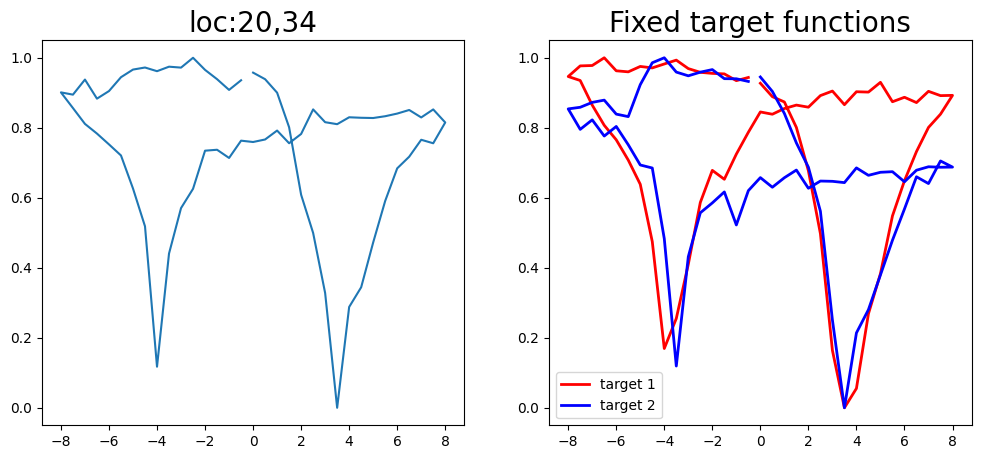

Epoch 1/200 ... Training loss: 3.2696
Epoch 10/200 ... Training loss: 2.8242
Epoch 20/200 ... Training loss: 2.2815
Epoch 30/200 ... Training loss: 1.9597
Epoch 40/200 ... Training loss: 1.63
Epoch 50/200 ... Training loss: 1.8028
Epoch 60/200 ... Training loss: 1.4273
Epoch 70/200 ... Training loss: 1.2915
Epoch 80/200 ... Training loss: 1.3179
Epoch 90/200 ... Training loss: 1.1642
Epoch 100/200 ... Training loss: 1.129
Epoch 110/200 ... Training loss: 1.1217
Epoch 120/200 ... Training loss: 1.05
Epoch 130/200 ... Training loss: 1.042
Epoch 140/200 ... Training loss: 0.959
Epoch 150/200 ... Training loss: 1.1816
Epoch 160/200 ... Training loss: 1.0176
Epoch 170/200 ... Training loss: 0.9193
Epoch 180/200 ... Training loss: 0.868
Epoch 190/200 ... Training loss: 0.8171
Epoch 200/200 ... Training loss: 0.9162
Epoch 1/200 ... Training loss: 2.3981
Epoch 10/200 ... Training loss: 2.452
Epoch 20/200 ... Training loss: 2.2431
Epoch 30/200 ... Training loss: 2.1251
Epoch 40/200 ... Training

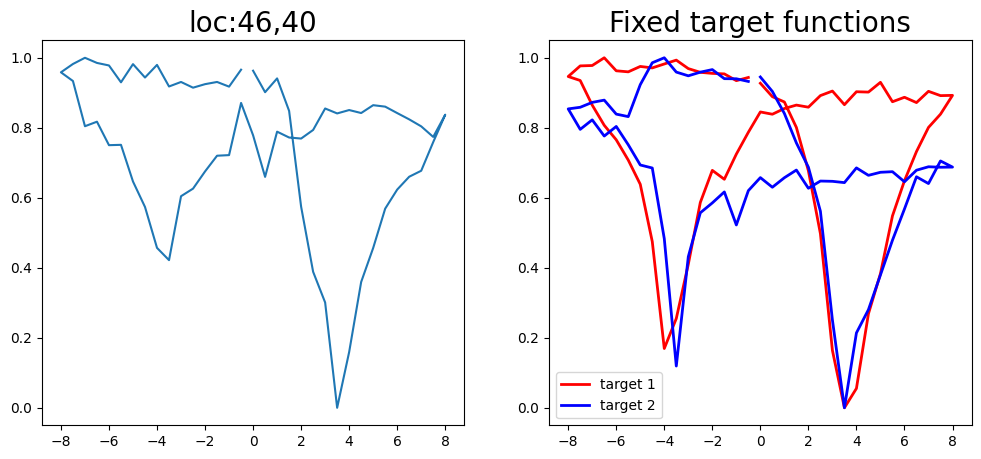

Epoch 1/200 ... Training loss: 3.2722
Epoch 10/200 ... Training loss: 2.6373
Epoch 20/200 ... Training loss: 2.192
Epoch 30/200 ... Training loss: 1.9005
Epoch 40/200 ... Training loss: 1.8163
Epoch 50/200 ... Training loss: 1.5858
Epoch 60/200 ... Training loss: 1.5101
Epoch 70/200 ... Training loss: 1.3333
Epoch 80/200 ... Training loss: 1.2343
Epoch 90/200 ... Training loss: 1.2245
Epoch 100/200 ... Training loss: 1.1308
Epoch 110/200 ... Training loss: 1.0687
Epoch 120/200 ... Training loss: 1.4099
Epoch 130/200 ... Training loss: 1.1662
Epoch 140/200 ... Training loss: 1.0862
Epoch 150/200 ... Training loss: 0.9986
Epoch 160/200 ... Training loss: 0.9981
Epoch 170/200 ... Training loss: 0.905
Epoch 180/200 ... Training loss: 0.8599
Epoch 190/200 ... Training loss: 0.8714
Epoch 200/200 ... Training loss: 0.84
Epoch 1/200 ... Training loss: 2.3896
Epoch 10/200 ... Training loss: 2.3039
Epoch 20/200 ... Training loss: 2.0999
Epoch 30/200 ... Training loss: 1.8529
Epoch 40/200 ... Tra

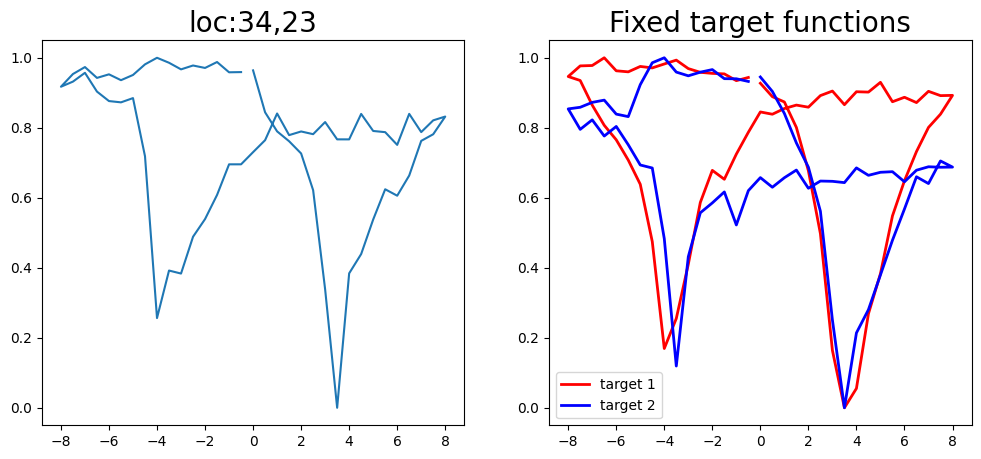

Epoch 1/200 ... Training loss: 3.2719
Epoch 10/200 ... Training loss: 2.6884
Epoch 20/200 ... Training loss: 2.6412
Epoch 30/200 ... Training loss: 2.1716
Epoch 40/200 ... Training loss: 1.8999
Epoch 50/200 ... Training loss: 2.0627
Epoch 60/200 ... Training loss: 1.7258
Epoch 70/200 ... Training loss: 1.7674
Epoch 80/200 ... Training loss: 1.701
Epoch 90/200 ... Training loss: 1.5513
Epoch 100/200 ... Training loss: 1.7139
Epoch 110/200 ... Training loss: 1.5201
Epoch 120/200 ... Training loss: 1.4867
Epoch 130/200 ... Training loss: 1.3915
Epoch 140/200 ... Training loss: 1.3403
Epoch 150/200 ... Training loss: 1.2629
Epoch 160/200 ... Training loss: 1.2419
Epoch 170/200 ... Training loss: 1.1504
Epoch 180/200 ... Training loss: 1.1838
Epoch 190/200 ... Training loss: 1.0632
Epoch 200/200 ... Training loss: 1.079
Epoch 1/200 ... Training loss: 2.3967
Epoch 10/200 ... Training loss: 2.2922
Epoch 20/200 ... Training loss: 2.1659
Epoch 30/200 ... Training loss: 1.9271
Epoch 40/200 ... T

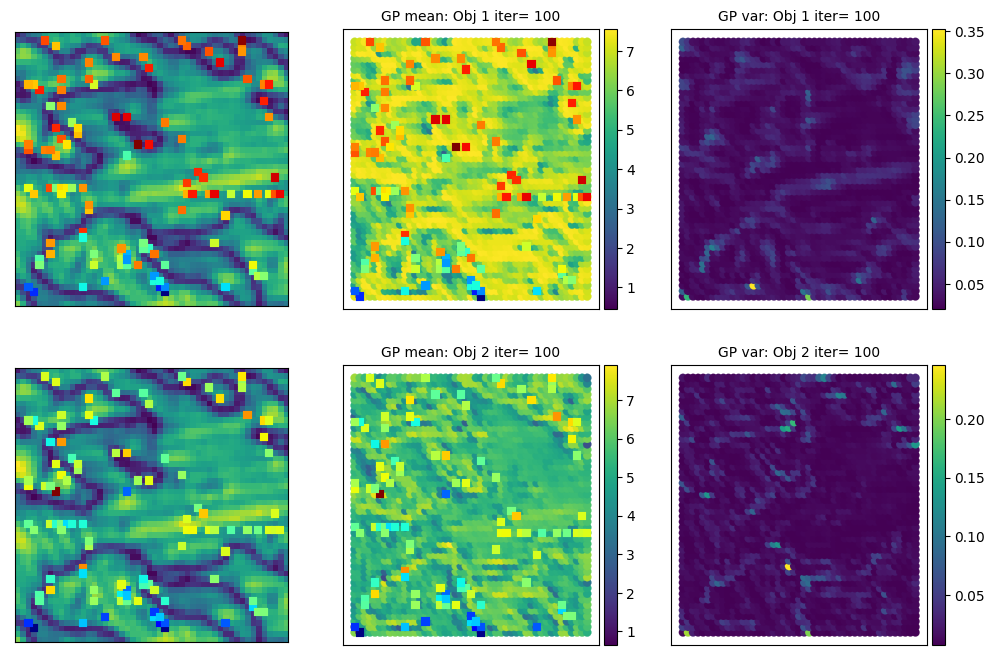

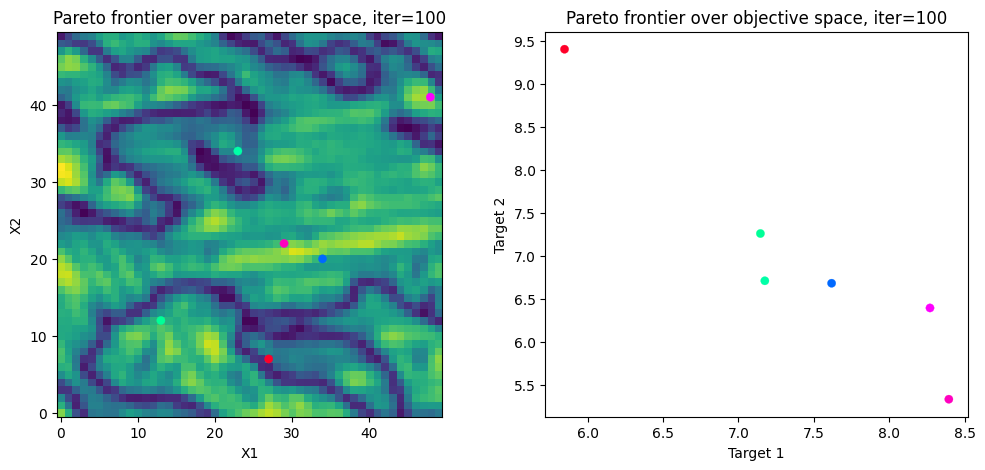

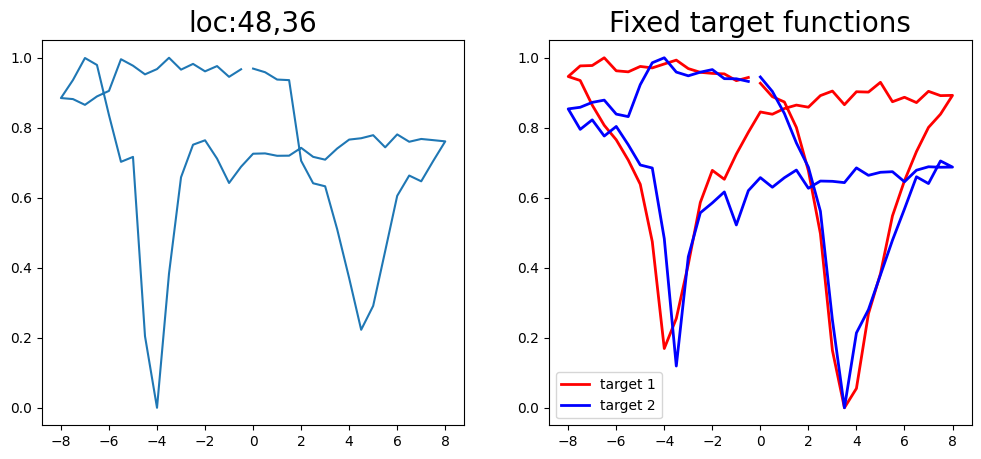

Epoch 1/200 ... Training loss: 3.2489
Epoch 10/200 ... Training loss: 2.8317
Epoch 20/200 ... Training loss: 2.7452
Epoch 30/200 ... Training loss: 2.2433
Epoch 40/200 ... Training loss: 1.8687
Epoch 50/200 ... Training loss: 1.754
Epoch 60/200 ... Training loss: 1.6218
Epoch 70/200 ... Training loss: 1.7314
Epoch 80/200 ... Training loss: 1.596
Epoch 90/200 ... Training loss: 1.3965
Epoch 100/200 ... Training loss: 1.3696
Epoch 110/200 ... Training loss: 1.3065
Epoch 120/200 ... Training loss: 1.6959
Epoch 130/200 ... Training loss: 1.4412
Epoch 140/200 ... Training loss: 1.2739
Epoch 150/200 ... Training loss: 1.2031
Epoch 160/200 ... Training loss: 1.1607
Epoch 170/200 ... Training loss: 1.076
Epoch 180/200 ... Training loss: 1.0303
Epoch 190/200 ... Training loss: 0.9929
Epoch 200/200 ... Training loss: 0.9384
Epoch 1/200 ... Training loss: 2.3824
Epoch 10/200 ... Training loss: 2.3632
Epoch 20/200 ... Training loss: 2.1931
Epoch 30/200 ... Training loss: 1.9938
Epoch 40/200 ... Tr

C:\Users\86f\PycharmProjects\pythonProject1\venv\lib\site-packages\gpytorch\distributions\multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


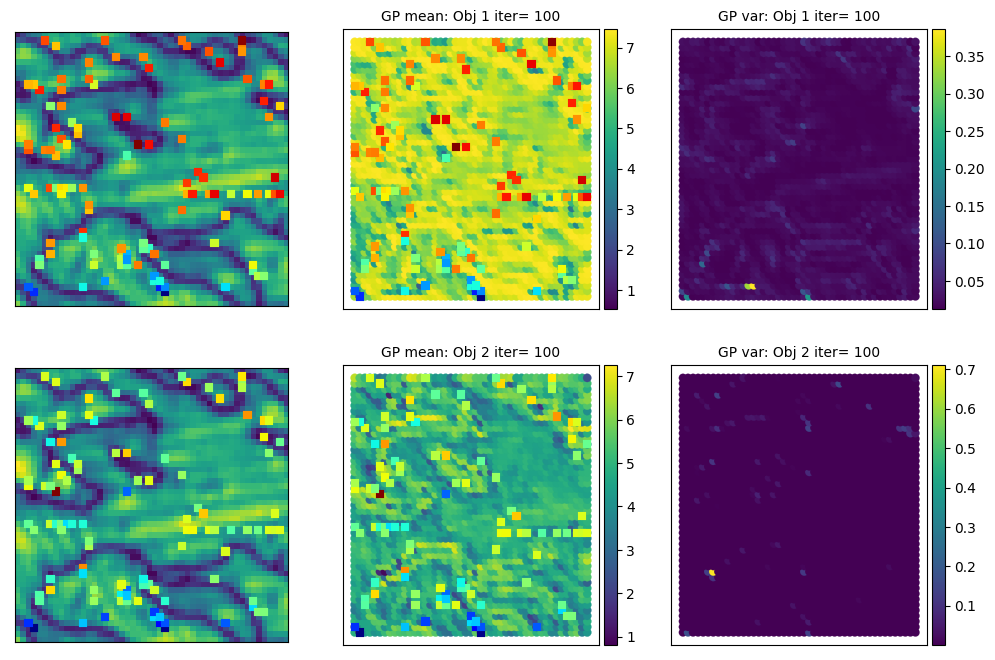

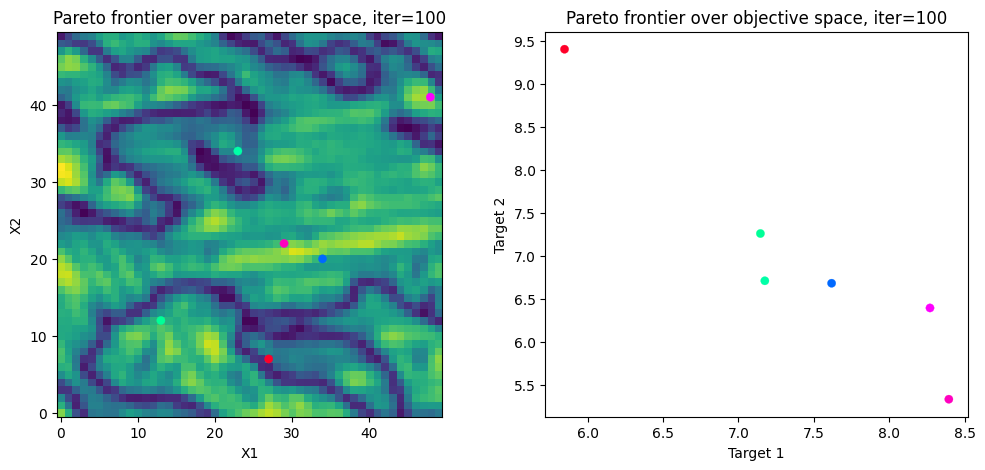

In [6]:
switch_obj_index = 0  # This is the index parameter to switch from 0 to 1 when the user satisfy with updating target
hvs = []  # Initializing hypervolume
rf = torch.tensor([0.0] * n_obj) - 0.001  # rf is the worst solution of the objectives.
BATCH_SIZE = 1
# Set up the surrogate emodel
# gp_surro = mGPtrainer.train_GP(train_X_norm, train_Y, kfun="periodic", lr=0.1)
gp_surro = mGPtrainer.train_dKLgp(train_X_norm, train_Y)
for i in range(1, N + 1):
    print("step: ", i)
    print("Sample #" + str(m + 1) + "\n\n")
    # Calculate posterior for analysis for intermediate iterations
    # y_pred_means, y_pred_vars = mGPtrainer.cal_posteriorGP(gp_surro, test_X_norm)
    y_pred_means, y_pred_vars = mGPtrainer.cal_posteriordKLGP(gp_surro, test_X_norm)
    # Compute pareto and hypervolume
    pareto_y, pareto_ind, hvs = Pareto.estimate(train_indices, train_Y, hvs, rf=rf)
    # Plot every tenth iteration after running the evaluation
    if (i == 1) or ((i % 10) == 0):
        # y_pred_means_full, y_pred_vars_full = mGPtrainer.cal_posteriorGP(gp_surro, X_feas_norm)
        y_pred_means_full, y_pred_vars_full = mGPtrainer.cal_posteriordKLGP(gp_surro, X_feas_norm)
        iresults = [pareto_y, pareto_ind, train_indices, train_Y, indices, y_pred_means_full, y_pred_vars_full, img,
                    i, idx, hvs, var_params]
        plotPareto(iresults)
        # put the savefig within the plot function
        # fig.savefig('acquisition_results_step=' + str(i) +'.png', dpi = 300, bbox_inches = 'tight', pad_inches = 1.0)
    # calculate acquisition function
    acq_cand, acq_val = mAcqFunc.wtbei(y_pred_means, y_pred_vars, train_Y)
    # acq_cand, acq_val = mAcqFunc.qehvi(gp_surro, test_X, train_Y, rf=rf)
    val = acq_val
    # ind = acq_cand
    ind = np.random.choice(acq_cand)  # for wtbei
    idx = np.hstack((idx, ind))
    # print(idx)

    # Find next point which maximizes the learning through exploration-exploitation
    if i == 1:
        val_ini = val
    # Check for convergence
    if val < 0:  # Stop for negligible expected improvement
        print("Model converged due to sufficient learning over search space ")
        break
    else:
        nextX = torch.empty((1, test_X.shape[1]))
        nextX_norm = torch.empty(1, test_X_norm.shape[1])
        next_indices = torch.empty((1, 2))
        nextX[0, :] = test_X[ind, :]
        nextX_norm[0, :] = test_X_norm[ind, :]
        next_indices[0, :] = test_indices[ind, :]
        idx_x = int(next_indices[0, 0])
        idx_y = int(next_indices[0, 1])
        # print(nextX_norm)

        next_loc = np.asarray([idx_x, idx_y])
        new_points_measured = idx

        # polarization loop area
        IV, points_measured = return_new_measurement(test_targets, ind)

        new_iv = IV[points_measured, :]

        new_spec_x = torch.from_numpy(vdc_vec)
        new_spec_y = torch.from_numpy(new_iv)

        new_spec_y = (new_spec_y - new_spec_y.min()) / (new_spec_y.max() - new_spec_y.min())

        eval_spec_y[idx_x, idx_y, :] = new_spec_y
        # Evaluate true function for new data, augment data
        train_X, train_X_norm, train_indices, train_Y, var_params, switch_obj_index, m = \
            augment_newdata(nextX, nextX_norm, next_indices, train_X, train_X_norm, train_indices,
                            train_Y,
                            new_spec_x, new_spec_y, eval_spec_y, img, var_params, n_obj,
                            switch_obj_index, m)

        # Remove evaluated samples from test data (Avoid repeated sampling)
        test_targets = np.concatenate([test_targets[:ind], test_targets[ind + 1:]])  # Spectral data
        test_indices = torch.cat([test_indices[:ind], test_indices[ind + 1:]])  # Grid locations
        test_X = torch.cat([test_X[:ind], test_X[ind + 1:]])  # Input image patches
        test_X_norm = torch.cat([test_X_norm[:ind], test_X_norm[ind + 1:]])

        # Updating GP with augmented training data
        # gp_surro = mGPtrainer.train_GP(train_X_norm, train_Y, kfun="periodic", lr=0.1)
        gp_surro = mGPtrainer.train_dKLgp(train_X_norm, train_Y)

    ## Final posterior prediction after all the sampling done

if (i == N):
    print("\n\n#####----Max. sampling reached, model stopped----#####")

# Optimal GP learning
gp_opt = gp_surro
# Posterior calculation with converged GP model
# y_pred_means_full, y_pred_vars_full = mGPtrainer.cal_posteriorGP(gp_surro, X_feas_norm)
y_pred_means_full, y_pred_vars_full = mGPtrainer.cal_posteriordKLGP(gp_surro, X_feas_norm)
# Plotting functions to check final iteration
pareto_y_opt, pareto_ind_opt, hvs = Pareto.estimate(train_indices, train_Y, hvs, rf=rf)
optim_results = [pareto_y_opt, pareto_ind_opt, train_indices, train_Y, indices, y_pred_means_full, y_pred_vars_full,
                 img, i, idx, hvs, var_params]
plotPareto(optim_results)

explored_data = [train_indices, train_Y]
user_votes = var_params[1]

# Save few data
# np.save("optim_resultsd2_BOpatch", optim_results)

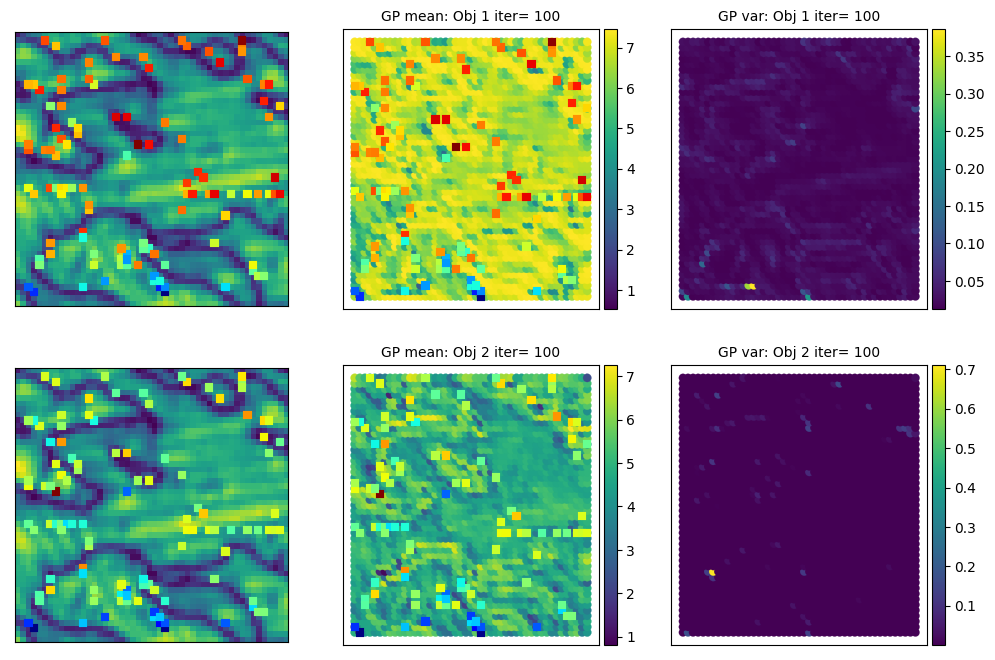

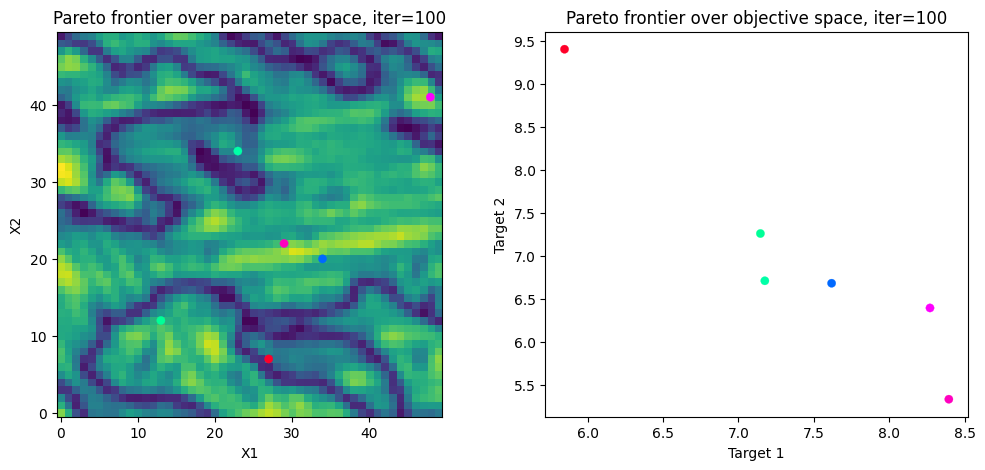

In [7]:
plotPareto(optim_results)

# Final Pareto front and Hypervolume after 100 iterations

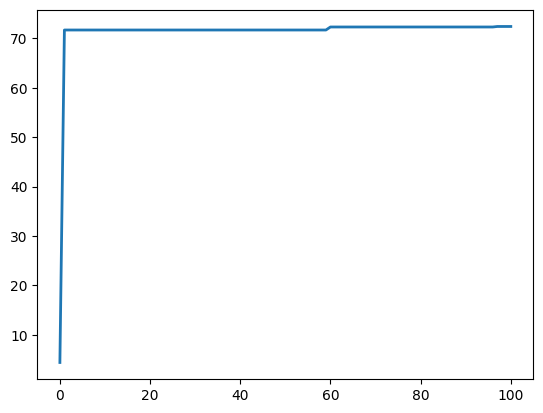

72.41336822509766


In [8]:
plt.plot(hvs, linewidth=2)
plt.show()
print(hvs[-1])

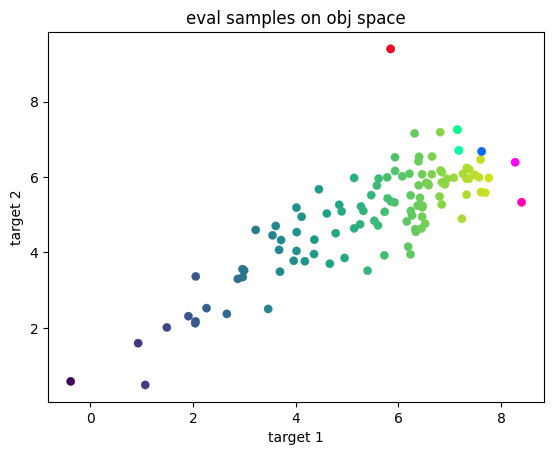

In [9]:
plt.scatter(train_Y[:, 0],train_Y[:, 1], c=  train_Y[:, 0], linewidth=0.2)
plt.scatter(pareto_y[:, 0], pareto_y[:, 1], c= pareto_y[:, 0], cmap='gist_rainbow',linewidth=0.2)
plt.xlabel("target 1")
plt.ylabel("target 2")
plt.title("eval samples on obj space")
plt.show()

# Validation with ground truth

In [18]:
spec_ground = torch.zeros((indices.shape[0],n_obj))
spec_ground.shape

torch.Size([2209, 2])

In [19]:
for i in range(0, indices.shape[0]):
  idx_x = int(indices[i, 0])
  idx_y = int(indices[i, 1])
  new_spec_y = targets[i, :]
  new_spec_y = (new_spec_y - new_spec_y.min())/(new_spec_y.max() - new_spec_y.min())
  new_spec_y = torch.from_numpy(new_spec_y)
  #print(idx_x, idx_y, spec_y)
  spec_ground[i, :] = func_automated_obj(idx_x, idx_y, new_spec_x, new_spec_y, target_func, n_obj)
  
spec_ground.shape

torch.Size([2209, 2])

In [20]:
hvs_ground = []
pareto_y_ground, pareto_ind_ground, hvs_ground = Pareto.estimate(indices, spec_ground, hvs_ground, rf=rf)


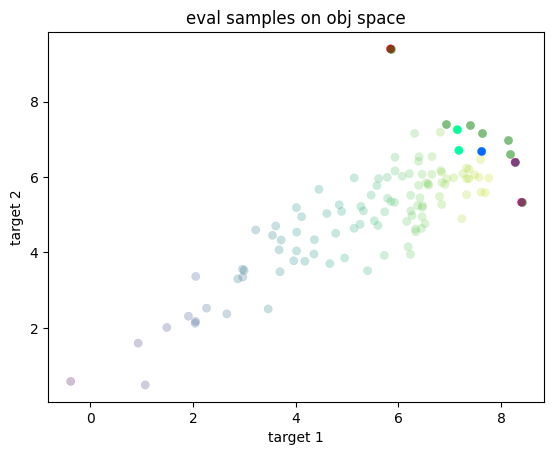

[73.20641326904297]


In [21]:
plt.scatter(train_Y[:, 0],train_Y[:, 1], c= train_Y[:, 0],cmap='viridis', alpha= 0.25, linewidth=0.2)
plt.scatter(pareto_y[:, 0], pareto_y[:, 1], c= pareto_y[:, 0], cmap='gist_rainbow',linewidth=0.2)
plt.scatter(pareto_y_ground[:, 0], pareto_y_ground[:, 1], c='g', alpha=0.5, linewidth=0.2)
plt.xlabel("target 1")
plt.ylabel("target 2")
plt.title("eval samples on obj space")
plt.show()

print(hvs_ground)


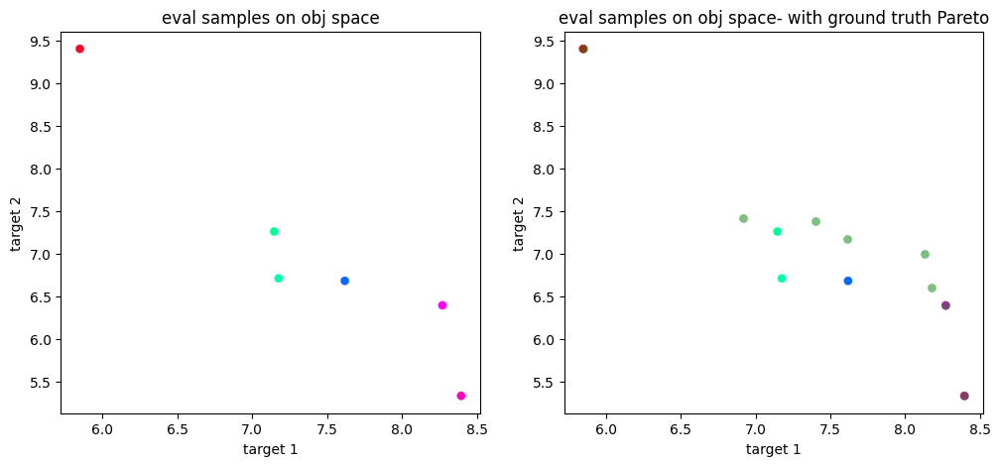

In [28]:
fig, ax = plt.subplots(ncols=2, figsize=(12, 5))
#plt.scatter(train_Y[:, 0],train_Y[:, 1], c=  train_Y[:, 0], linewidth=0.2)
ax[0].scatter(pareto_y[:, 0], pareto_y[:, 1], c= pareto_y[:, 0], cmap='gist_rainbow',linewidth=0.2)
ax[0].set_xlabel("target 1")
ax[0].set_ylabel("target 2")
ax[0].set_title("eval samples on obj space")

#plt.scatter(train_Y[:, 0],train_Y[:, 1], c=  train_Y[:, 0], linewidth=0.2)
ax[1].scatter(pareto_y[:, 0], pareto_y[:, 1], c= pareto_y[:, 0], cmap='gist_rainbow',linewidth=0.2)
ax[1].scatter(pareto_y_ground[:, 0], pareto_y_ground[:, 1], c='g', alpha= 0.5, linewidth=0.2)
ax[1].set_xlabel("target 1")
ax[1].set_ylabel("target 2")
ax[1].set_title("eval samples on obj space- with ground truth Pareto")
plt.show()